#	Hypothesis	Description
* 1	Untrained vs. Trained Defender	A trained defender will significantly outperform an untrained (random-action) defender.
* 2	Impact of RL Algorithm	Different RL algorithms will yield different performance levels.
* 3	Observation of Epsilon (Exploration vs. Exploitation)	The tuning of the exploration-exploitation balance (epsilon) impacts learning speed and performance.
* 4	Training Agents in Isolation vs. Together	Agents trained together adapt better to each other's strategies compared to agents trained in isolation.
* 5	Exploration vs. Exploitation Balance	There exists an optimal balance between exploration and exploitation that maximizes learning effectiveness.
* 6	Convergence Rate	Attackers and defenders will show different convergence rates, influenced by the complexity of their tasks.
* 7	Impact of Training Duration	Extending the training duration improves performance up to a point, after which improvements plateau or degrade.
* 8	Effect of Different Reward Structures	The design of the reward structure significantly affects the strategies learned by agents.

In [1]:
import time
import copy
import logging
import networkx
from networkx import convert_matrix
from typing import NamedTuple, Optional, Tuple, List, Dict, TypeVar, TypedDict, cast

import numpy
import gym
from gym import spaces
from gym.utils import seeding

import plotly.graph_objects as go
from plotly.subplots import make_subplots

from cyberbattle._env.shared_cyberbattle_env import EnvironmentBounds, AttackerGoal, DefenderGoal, DefenderConstraint
from cyberbattle._env.defender import DefenderAgent,ScanAndReimageCompromisedMachines
from cyberbattle.simulation.model import PortName, PrivilegeLevel
from cyberbattle.simulation import commandcontrol, model, actions
from cyberbattle._env.discriminatedunion import DiscriminatedUnion
from cyberbattle.agents.baseline import agent_wrapper as w
import cyberbattle.agents.baseline.learner as learner
from cyberbattle.agents.baseline.learner import Learner
import cyberbattle.agents.baseline.agent_tabularqlearning as a
import cyberbattle.agents.baseline.agent_ddql as ddqla
import cyberbattle.agents.baseline.agent_dql as dqla
from cyberbattle.defender_agents.trainedDefender import *

In [2]:
import random

In [3]:
random.seed(120394016)
%matplotlib inline
import cyberbattle.agents.baseline.agent_tabularqlearning as a
import cyberbattle.agents.baseline.learner as learner
from cyberbattle.agents.baseline.agent_wrapper import Verbosity
#ql
iteration_count = 10
training_episode_count = 10
eval_episode_count = 20
gamma_sweep = [
    0.015,  # about right
]

In [4]:
import gym

#create an instance of the CyberBattleChain environment without the defender
gym_env = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    )
)


defender_name = "DefenderName" 
defender_agent = DefenderWrapper(gym_env,defender_name)

Generated nodes:
[('start', {'data': NodeInfo(services=[], vulnerabilities={'ScanExplorerRecentFiles': VulnerabilityInfo(description='Scan Windows Explorer recent files for possible references to other machines', type=<VulnerabilityType.LOCAL: 1>, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f18a84d8e80>, precondition=<cyberbattle.simulation.model.Precondition object at 0x7f185f375880>, rates=Rates(probingDetectionRate=0.0, exploitDetectionRate=0.0, successRate=1.0), URL='', cost=1.0, reward_string='Found a reference to a remote Linux node in bash history')}, value=0, properties=[], firewall=FirewallConfiguration(outgoing=[FirewallRule(port='RDP', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='SSH', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTPS', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTP', permission=<RulePermission.ALLOW: 0>, reason='')], incoming=[FirewallRule(port='RDP', permis

In [5]:
ep = w.EnvironmentBounds.of_identifiers(
    maximum_total_credentials=22,
    maximum_node_count=22,
    identifiers=gym_env.identifiers
)
#cyberbattlechain_defender.render_as_fig()

# Attacker Training

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.95,ϵ_min=0.1, ϵ_multdecay=0.75,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9500, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:  -24.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 2|Iteration 10|reward:  -54.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cdcec0a0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
A

Episode 3|Iteration 2|reward:    4.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cdd319d0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}

Episode 3|Iteration 5|reward:  -26.0|last_reward_at:    1|Elapsed Time: 0:00:00||


attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=in

Episode 3|Iteration 10|reward:  -45.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7f17cdd42610>)
Attacker reward: 4.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=Non

Episode 4|Iteration 3|reward:  -15.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 4|Iteration 5|reward:  -25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 4|Iteration 10|reward:  -50.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 5|Iteration 8|reward:  -33.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cdd1c520>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult

Episode 5|Iteration 9|reward:  -31.0|last_reward_at:    9|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}


Episode 5|Iteration 10|reward:  -41.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/3 (0.25)
    explore-connect: 0/4 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  ## Episode: 6/10 'Q-learning' ϵ=0.7063, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 3|reward:   -1.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f18a857cfd0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

Episode 6|Iteration 9|reward:  -46.0|last_reward_at:    2|Elapsed Time: 0:00:00||


attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 1, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 7

Episode 6|Iteration 10|reward:  -56.0|last_reward_at:    2|Elapsed Time: 0:00:00||



Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
  Episode 6 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 0/4 (0.00)
    explore-connect: 0/5 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  ## Episode: 7/10 'Q-learning' ϵ=0.7050, γ=0.015,learning_rate=0.99,Q%=100


Episode 7|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action: 

Episode 7|Iteration 6|reward:  -16.0|last_reward_at:    5|Elapsed Time: 0:00:00||

 ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  Action

Episode 7|Iteration 10|reward:  -25.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7f17cdca7970>)
Attacker reward: 4.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7f17cdca7970>)
Attacker reward: -6.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vuln

Episode 8|Iteration 5|reward:  -11.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 8|Iteration 6|reward:  -16.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}


Episode 8|Iteration 10|reward:  -48.0|last_reward_at:    4|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cdcacaf0>)
Attacker reward: -2.0
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Execut

Episode 9|Iteration 6|reward:  -31.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cdcbb490>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 3, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step calle

Episode 9|Iteration 7|reward:  -27.0|last_reward_at:    1|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7f17cdd1cd90>)
Attacker reward: 4.0


Episode 9|Iteration 8|reward:  -25.0|last_reward_at:    8|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7f17cdd1cd60>)
Attacker reward: 2.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7f17cdd1cd90>)
Attacker reward: -6.0


Episode 9|Iteration 10|reward:  -33.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cdcbb490>)
Attacker reward: -2.0
  Episode 9 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 2/2 (0.50)
    explore-connect: 0/4 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  ## Episode: 10/10 'Q-learning' ϵ=0.7013, γ=0.015,learning_rate=0.99,Q%=100


Episode 10|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 10|Iteration 6|reward:  -16.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing a

Episode 10|Iteration 8|reward:  -28.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 0, 7, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 7, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}

Episode 10|Iteration 9|reward:  -26.0|last_reward_at:    9|Elapsed Time: 0:00:00||


attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7f17cdcb5730>)
Attacker reward: 2.0
Step called with action: {'connect': array([0, 1, 3, 0], dtype=int32)}


Episode 10|Iteration 10|reward:  -36.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Executing attacker action {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 3, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
  Episode 10 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/4 (0.20)
    explore-connect: 0/3 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1
simulation ended


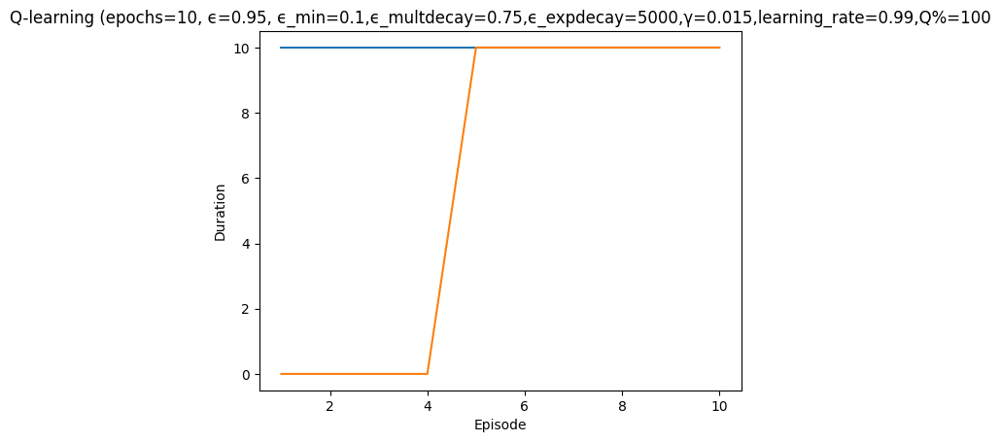

In [6]:
trained_attacker = learner.epsilon_greedy_search(
        gym_env,
        ep,
        a.QTabularLearner(ep, gamma=.015, learning_rate=0.99, exploit_percentile=100),
        episode_count=10,
        iteration_count=10,
        epsilon=0.95,
        render=False,
        epsilon_multdecay=0.75,  # 0.999,
        epsilon_exponential_decay=5000,
        epsilon_minimum=0.1,
        verbosity=Verbosity.Quiet,
        title="Q-learning"
    )

# Defender Training

In [7]:
statespace = w.HashEncoding(ep, [
            # Feature_discovered_node_count(),
            # Feature_discovered_credential_count(),
            w.Feature_discovered_ports_sliding(ep),
            w.Feature_discovered_nodeproperties_sliding(ep),
            w.Feature_discovered_notowned_node_count(ep, 3)
        ], 5000)  

actionspace = w.RavelEncoding(ep, [
            w.Feature_active_node_properties(ep)])
print(statespace)
print(actionspace)
q_matrix = DefenderQMatrix(statespace, actionspace,gym_env)
learner2 = DefenderQLearner(gym_env, defender_agent, ep, q_matrix, epsilon=0.9, gamma=0.015, learning_rate=.07)

MultiDiscrete([5000])
MultiDiscrete([16384])


In [8]:
import matplotlib.pyplot as plt
print(plt.style.available)


['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


###### Defender Q-Learning Training
Learning with: episode_count=10,iteration_count=10,ϵ=0.99,ϵ_min=0.05, ϵ_multdecay=1.0,ϵ_expdecay=5000,Defender learner parameters: []
  ## Episode: 1/10 'Defender Q-Learning Training' ϵ=0.9900, Defender learner parameters: []


Episode 1|Iteration 10|reward: 10000.0|last_reward_at:    9|Elapsed Time: 0:00:00||


0 5 2
{'action_type': 0, 'node_id': 5, 'parameter': 2}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 2}
0 5 2
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=5, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '4_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1, 'successful_actions': 0, 'failed_actions': 0, 'unnecessary': 1}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
0 5 3
{'action_type': 0, 'node_id': 5, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 3}
0 5 3
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=5, Parameter=3
info {'action': 'reimage_node', 'status'

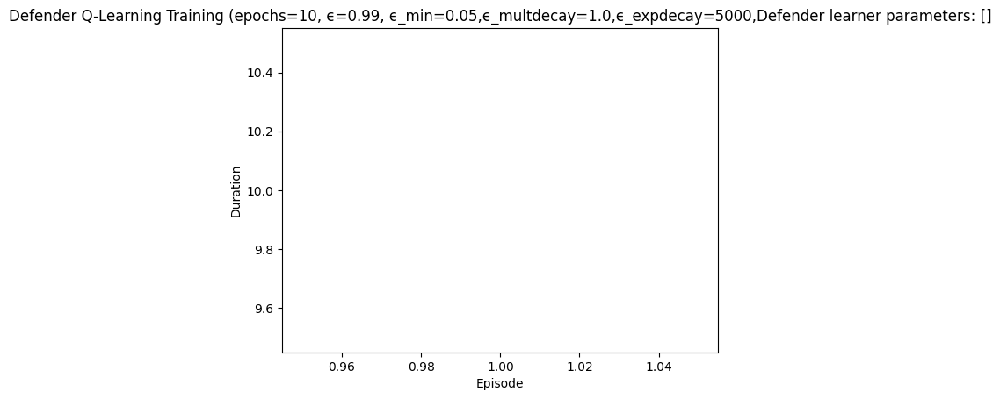

Rendering the current state of the environment
  ## Episode: 2/10 'Defender Q-Learning Training' ϵ=0.9883, Defender learner parameters: []


Episode 2|Iteration 9|reward: 6000.0|last_reward_at:    4|Elapsed Time: 0:00:00|||

1 6 9
{'action_type': 1, 'node_id': 6, 'parameter': 9}
[DEBUG] Received action: {'action_type': 1, 'node_id': 6, 'parameter': 9}
1 6 9
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=6, Parameter=9
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 9, 'performance_metrics': {'actions_taken': 11, 'successful_actions': 5, 'failed_actions': 0, 'unnecessary': 6}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
3 12 9
{'action_type': 3, 'node_id': 12, 'parameter': 9}
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 9}
3 12 9
action type:  Allow Traffic
Iteration 2: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service not running or not found',

Episode 2|Iteration 10|reward: 5000.0|last_reward_at:    4|Elapsed Time: 0:00:00||


 11 7
{'action_type': 4, 'node_id': 11, 'parameter': 7}
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 7}
4 11 7
action type:  Start Service
Iteration 10: Action Taken: Type=Start Service, NodeID=11, Parameter=7
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 20, 'successful_actions': 7, 'failed_actions': 0, 'unnecessary': 13}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
  Episode 2 stopped at t=10 
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/0 (NaN)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  E

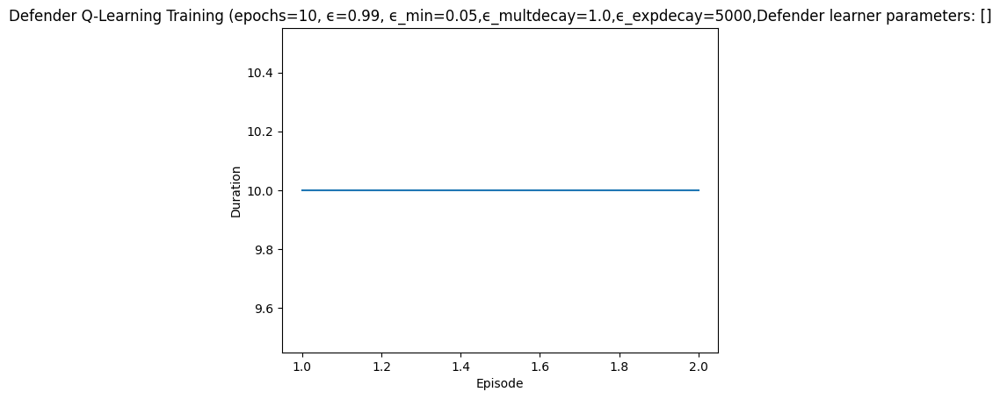

Rendering the current state of the environment
  ## Episode: 3/10 'Defender Q-Learning Training' ϵ=0.9864, Defender learner parameters: []


Episode 3|Iteration 10|reward: 25000.0|last_reward_at:    9|Elapsed Time: 0:00:00||


1 11 5
{'action_type': 1, 'node_id': 11, 'parameter': 5}
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 5}
1 11 5
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=11, Parameter=5
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 21, 'successful_actions': 8, 'failed_actions': 0, 'unnecessary': 13}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
2 6 6
{'action_type': 2, 'node_id': 6, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 6}
2 6 6
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=6, Parameter=6
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxN

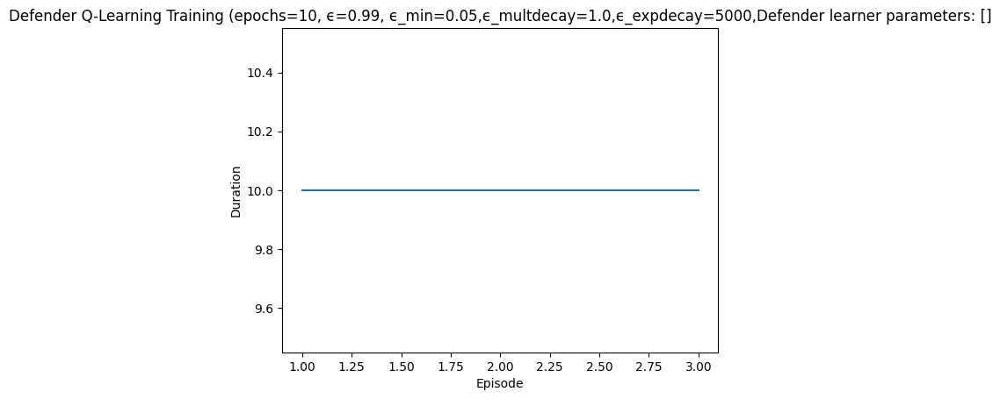

Rendering the current state of the environment
  ## Episode: 4/10 'Defender Q-Learning Training' ϵ=0.9846, Defender learner parameters: []


Episode 4|Iteration 4|reward: 16000.0|last_reward_at:    3|Elapsed Time: 0:00:00||

1 11 1
{'action_type': 1, 'node_id': 11, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 1}
1 11 1
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=11, Parameter=1
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 31, 'successful_actions': 15, 'failed_actions': 0, 'unnecessary': 16}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
2 7 6
{'action_type': 2, 'node_id': 7, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 6}
2 7 6
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=7, Parameter=6
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_Windo

Episode 4|Iteration 10|reward: 15000.0|last_reward_at:    6|Elapsed Time: 0:00:00||


0 3 6
{'action_type': 0, 'node_id': 3, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 6}
0 3 6
action type:  Reimage Node
Iteration 5: Action Taken: Type=Reimage Node, NodeID=3, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 35, 'successful_actions': 18, 'failed_actions': 0, 'unnecessary': 17}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
2 11 6
{'action_type': 2, 'node_id': 11, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 11, 'parameter': 6}
2 11 6
action type:  Reimage Node
Iteration 6: Action Taken: Type=Reimage Node, NodeID=11, Parameter=6
info {'action': 'allow_traffic',

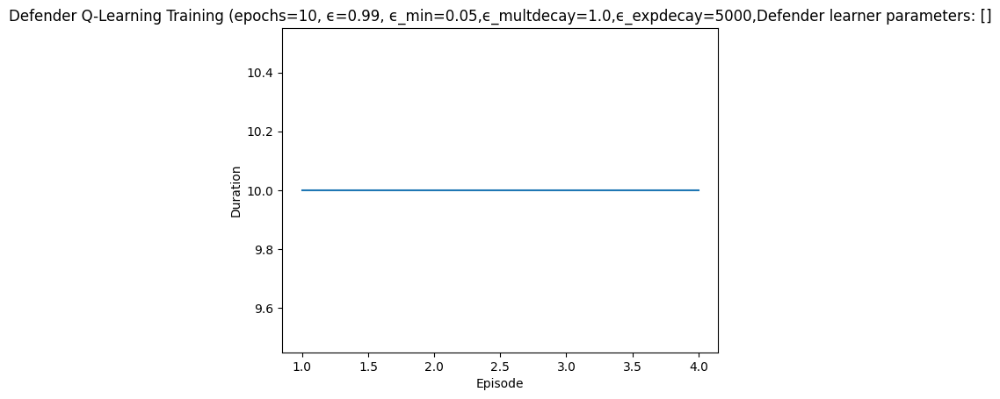

Rendering the current state of the environment
  ## Episode: 5/10 'Defender Q-Learning Training' ϵ=0.9827, Defender learner parameters: []


Episode 5|Iteration 10|reward: 6000.0|last_reward_at:    3|Elapsed Time: 0:00:00||


2 6 7
{'action_type': 2, 'node_id': 6, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 7}
2 6 7
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=6, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 41, 'successful_actions': 20, 'failed_actions': 0, 'unnecessary': 21}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
0 0 6
{'action_type': 0, 'node_id': 0, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 6}
0 0 6
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=0, Parameter=6
info {'action': 'reimage_node', 'status': 'success', 'node_id': 'start', 'performan

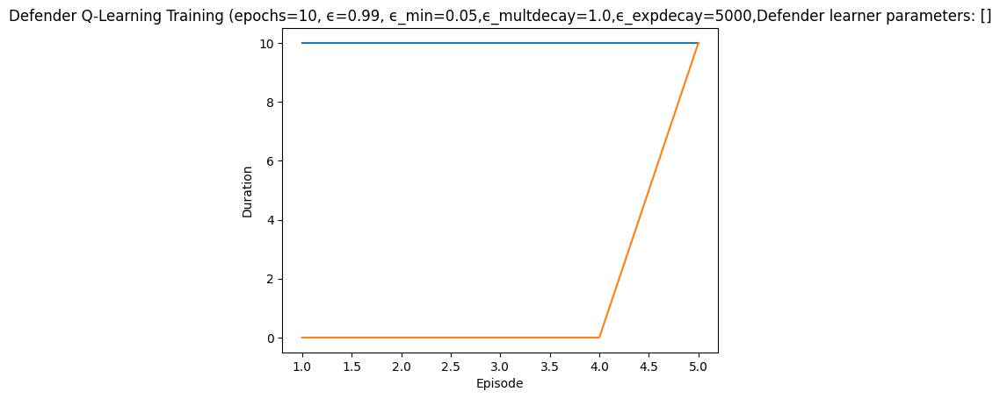

Rendering the current state of the environment
  ## Episode: 6/10 'Defender Q-Learning Training' ϵ=0.9808, Defender learner parameters: []


Episode 6|Iteration 8|reward: 12000.0|last_reward_at:    8|Elapsed Time: 0:00:00||

0 12 3
{'action_type': 0, 'node_id': 12, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 3}
0 12 3
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=12, Parameter=3
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 51, 'successful_actions': 22, 'failed_actions': 0, 'unnecessary': 29}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 8 1
{'action_type': 1, 'node_id': 8, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 1}
1 8 1
action type:  Block Traffic
Iteration 2: Action Taken: Type=Block Traffic, NodeID=8, Parameter=1
info {'action': 'block_traffic', 'status': 'succ

Episode 6|Iteration 9|reward: 11000.0|last_reward_at:    8|Elapsed Time: 0:00:00||

0 7 1
{'action_type': 0, 'node_id': 7, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 7, 'parameter': 1}
0 7 1
action type:  Reimage Node
Iteration 9: Action Taken: Type=Reimage Node, NodeID=7, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '6_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 59, 'successful_actions': 26, 'failed_actions': 0, 'unnecessary': 33}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 6|Iteration 10|reward: 6000.0|last_reward_at:    8|Elapsed Time: 0:00:00||


2 0 6
{'action_type': 2, 'node_id': 0, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 6}
2 0 6
action type:  Reimage Node
Iteration 10: Action Taken: Type=Reimage Node, NodeID=0, Parameter=6
info {'action': 'allow_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 6, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 60, 'successful_actions': 26, 'failed_actions': 1, 'unnecessary': 33}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
  Episode 6 stopped at t=10 
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/0 (NaN)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  Episode 6

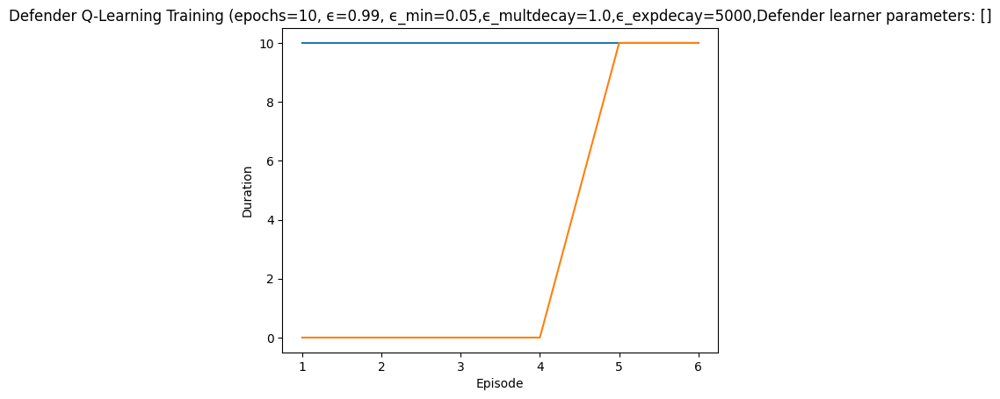

Rendering the current state of the environment
  ## Episode: 7/10 'Defender Q-Learning Training' ϵ=0.9790, Defender learner parameters: []


Episode 7|Iteration 1|reward: -1000.0|last_reward_at: ----|Elapsed Time: 0:00:00||

0 2 4
{'action_type': 0, 'node_id': 2, 'parameter': 4}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 4}
0 2 4
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=2, Parameter=4
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 61, 'successful_actions': 26, 'failed_actions': 1, 'unnecessary': 34}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 12 6
{'action_type': 3, 'node_id': 12, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 6}
3 12

Episode 7|Iteration 9|reward: 6000.0|last_reward_at:    7|Elapsed Time: 0:00:00|||

 6
action type:  Allow Traffic
Iteration 2: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 62, 'successful_actions': 26, 'failed_actions': 1, 'unnecessary': 35}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 1 9
{'action_type': 2, 'node_id': 1, 'parameter': 9}
[DEBUG] Received action: {'action_type': 2, 'node_id': 1, 'parameter': 9}
2 1 9
action type:  Reimage Node
Iteration 3: Action Taken: Type=Reimage Node, NodeID=1, Parameter=9
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 9, 'performance_metrics': {'actions_taken': 63, 'successful_actions': 27, 'failed_actions': 1, 'unnecessary': 35}, 'network_avai

Episode 7|Iteration 10|reward: 1000.0|last_reward_at:    7|Elapsed Time: 0:00:00||


1 0 4
{'action_type': 1, 'node_id': 0, 'parameter': 4}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 4}
1 0 4
action type:  Block Traffic
Iteration 10: Action Taken: Type=Block Traffic, NodeID=0, Parameter=4
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 4, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 70, 'successful_actions': 29, 'failed_actions': 2, 'unnecessary': 39}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
  Episode 7 stopped at t=10 
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/0 (NaN)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  Episode

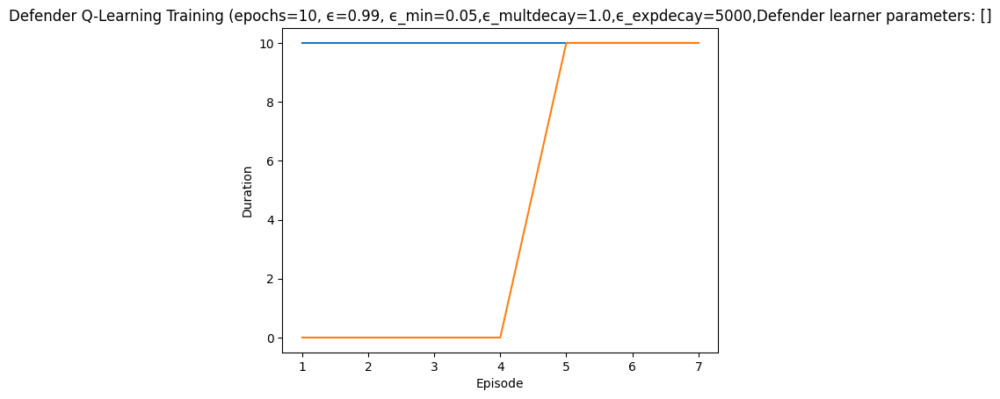

Rendering the current state of the environment
  ## Episode: 8/10 'Defender Q-Learning Training' ϵ=0.9771, Defender learner parameters: []


Episode 8|Iteration 10|reward: 5000.0|last_reward_at:    9|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 0}
0 13 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '12_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 71, 'successful_actions': 29, 'failed_actions': 2, 'unnecessary': 40}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 8 4
{'action_type': 3, 'node_id': 8, 'parameter': 4}
[DEBUG] Received action: {'action_type': 3, 'node_id': 8, 'parameter': 4}
3 8

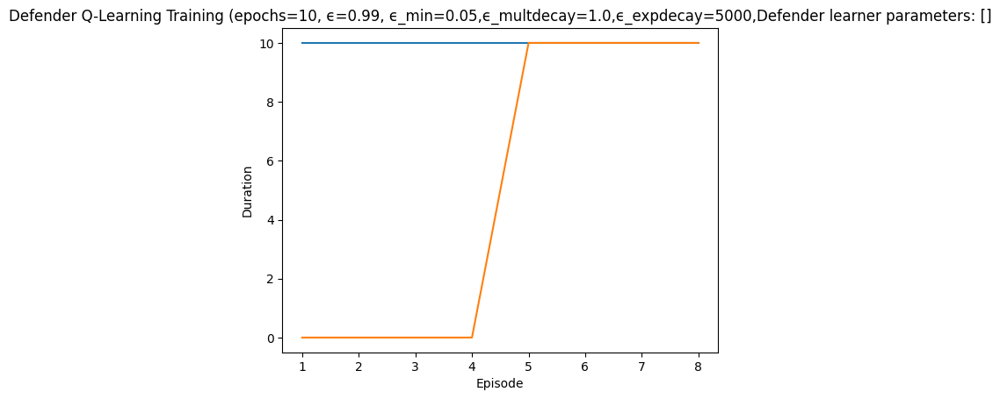

Rendering the current state of the environment
  ## Episode: 9/10 'Defender Q-Learning Training' ϵ=0.9753, Defender learner parameters: []


Episode 9|Iteration 10|reward:    0.0|last_reward_at:   10|Elapsed Time: 0:00:00||


0 6 1
{'action_type': 0, 'node_id': 6, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 1}
0 6 1
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=6, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 81, 'successful_actions': 32, 'failed_actions': 2, 'unnecessary': 47}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 1 4
{'action_type': 3, 'node_id': 1, 'parameter': 4}
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 4}
3 1 4
action type:  Allow Traffic
Iteration 2: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service not 

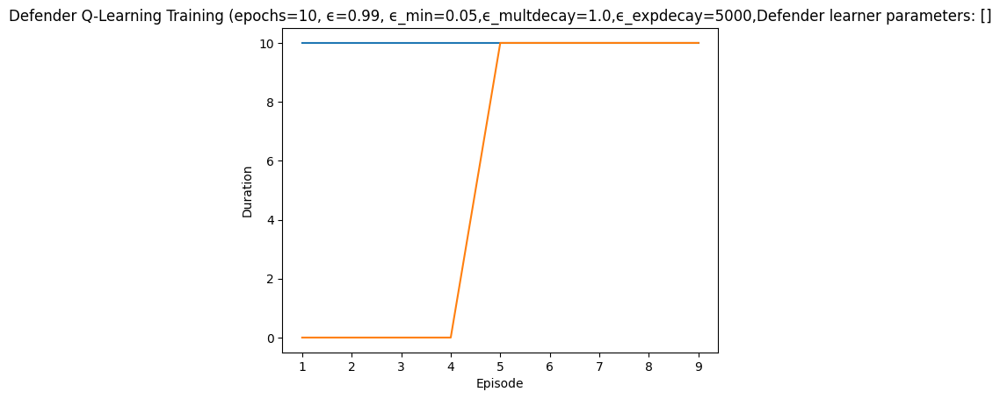

Rendering the current state of the environment
  ## Episode: 10/10 'Defender Q-Learning Training' ϵ=0.9734, Defender learner parameters: []


Episode 10|Iteration 10|reward: 10000.0|last_reward_at:   10|Elapsed Time: 0:00:00||


0 8 5
{'action_type': 0, 'node_id': 8, 'parameter': 5}
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 5}
0 8 5
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=8, Parameter=5
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 91, 'successful_actions': 34, 'failed_actions': 2, 'unnecessary': 55}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 4 4
{'action_type': 4, 'node_id': 4, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 4}
4 4 4
action type:  Start Service
Iteration 2: Action Taken: Type=Start Service, NodeID=4, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service alre

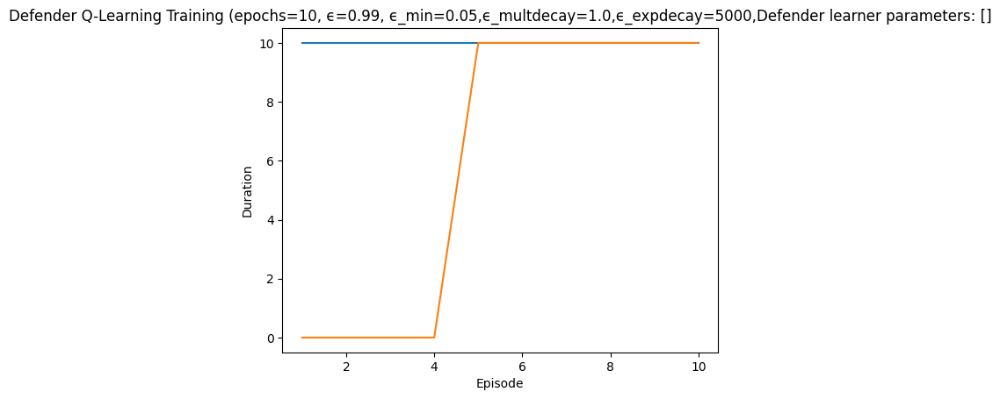

Rendering the current state of the environment
simulation ended


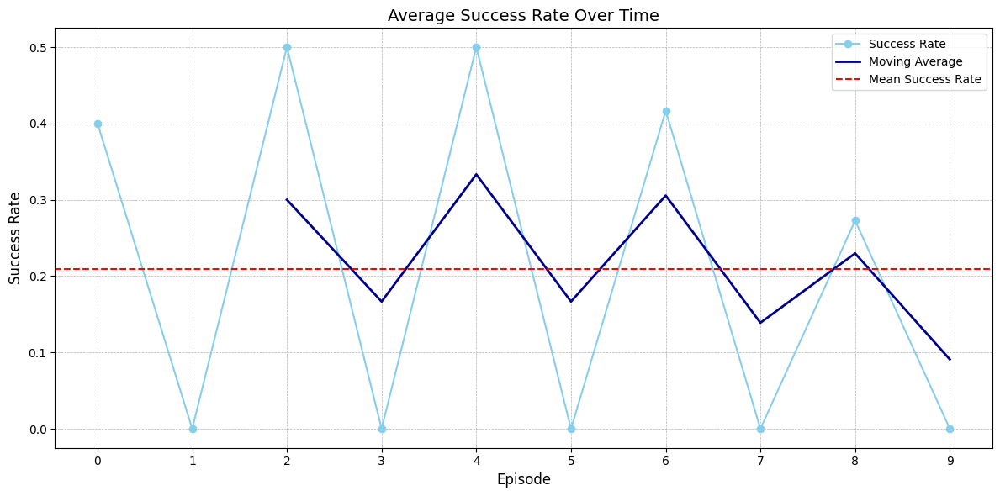

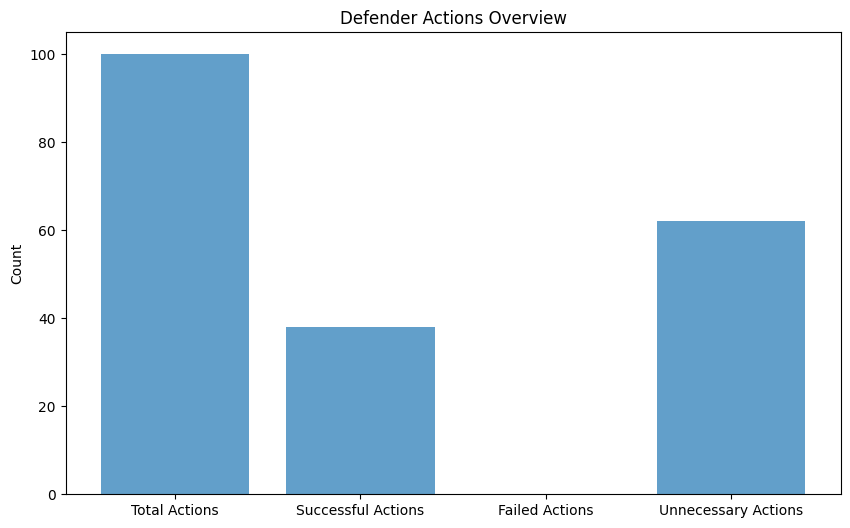

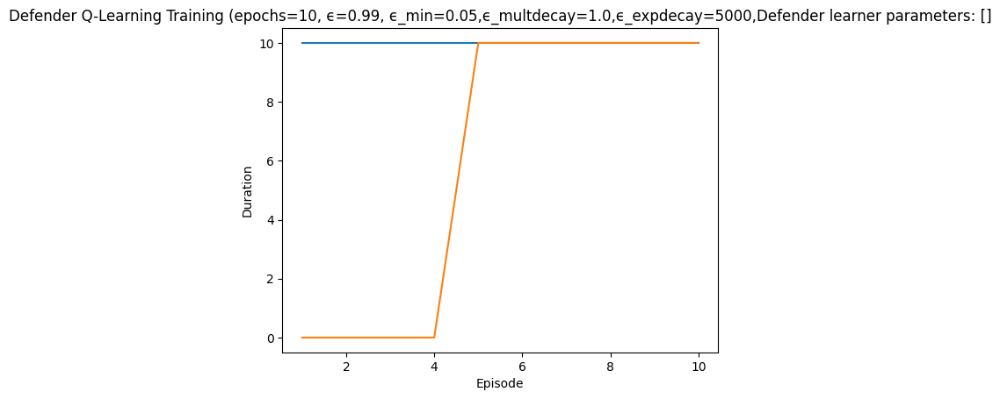

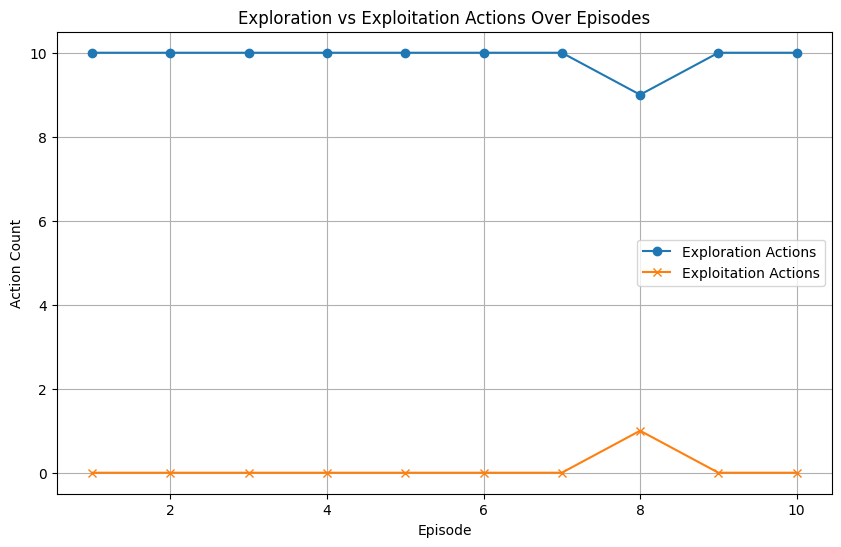

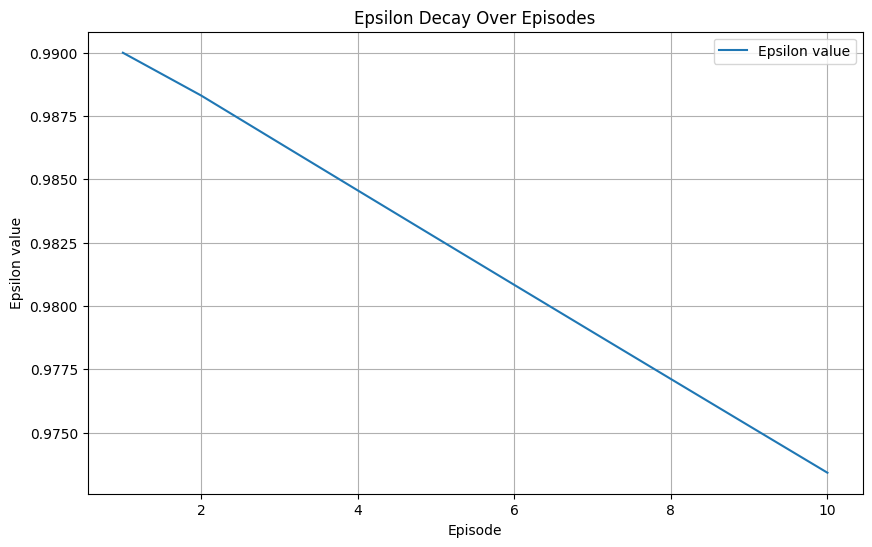

In [9]:
random.seed(120394016)
#%matplotlib inline
trained_defender = epsilon_greedy_defender_training(
    cyberbattle_gym_env=gym_env,
    environment_properties=ep,
    learner=learner2,
    episode_count=10,
    iteration_count=10,
    epsilon=0.99,
    epsilon_exponential_decay=5000,
    epsilon_minimum=0.05,
    epsilon_multdecay=0.99999999999999999999,  # 0.999,,
    verbosity=logging.INFO,
    render=True,
    plot_episodes_length=True,
    title="Defender Q-Learning Training"
)

# Hypothesis 1

In [10]:
gym_env = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    )
)

Generated nodes:
[('start', {'data': NodeInfo(services=[], vulnerabilities={'ScanExplorerRecentFiles': VulnerabilityInfo(description='Scan Windows Explorer recent files for possible references to other machines', type=<VulnerabilityType.LOCAL: 1>, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cdbb1730>, precondition=<cyberbattle.simulation.model.Precondition object at 0x7f185f375880>, rates=Rates(probingDetectionRate=0.0, exploitDetectionRate=0.0, successRate=1.0), URL='', cost=1.0, reward_string='Found a reference to a remote Linux node in bash history')}, value=0, properties=[], firewall=FirewallConfiguration(outgoing=[FirewallRule(port='RDP', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='SSH', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTPS', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTP', permission=<RulePermission.ALLOW: 0>, reason='')], incoming=[FirewallRule(port='RDP', permis

# Untrained Defender

In [11]:
defender_name = "DefenderName" 
defender_agent = UntrainedDefenderWrapper(gym_env,defender_name)

In [12]:
def run_defender_simulation(env, defender_class, episode_count=10, steps_per_episode=100):
    """Run a simulation with the specified defender in the given environment.

    Args:
        env: The environment instance to run the simulation in.
        defender_class: The class of the defender to use in the simulation.
        episode_count (int): Number of episodes to run in the simulation.
        steps_per_episode (int): Maximum number of steps to take in each episode.

    Returns:
        A dictionary containing aggregated performance metrics from the simulation.
    """
    aggregated_metrics = {
        'total_actions_taken': 0,
        'total_successful_actions': 0,
        'total_failed_actions': 0,
        'total_unnecessary_actions': 0,
    }
    for episode in range(10):

        observation = env.reset()
        defender = UntrainedDefenderWrapper(env, "Untrained Defender")

        for step in range(10):
 
            observation, reward, done, info = defender.step()

            if done:
                break

        aggregated_metrics['total_actions_taken'] += defender.performance_metrics['actions_taken']
        aggregated_metrics['total_successful_actions'] += defender.performance_metrics['successful_actions']
        aggregated_metrics['total_failed_actions'] += defender.performance_metrics['failed_actions']
        aggregated_metrics['total_unnecessary_actions'] += defender.performance_metrics['unnecessary']

    aggregated_metrics['average_success_rate'] = (aggregated_metrics['total_successful_actions'] / 
                                                  aggregated_metrics['total_actions_taken'])

    return aggregated_metrics

In [13]:

random.seed(120394016)
metrics = run_defender_simulation(gym_env, UntrainedDefenderWrapper, episode_count=10, steps_per_episode=10)

print("Simulation metrics:", metrics)


[DEBUG] Received external action: None (this action will be ignored)
[DEBUG] Processed Node ID: 13_LinuxNode (Numerical ID: 1) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Start Service': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)}}, -1000, False, {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed

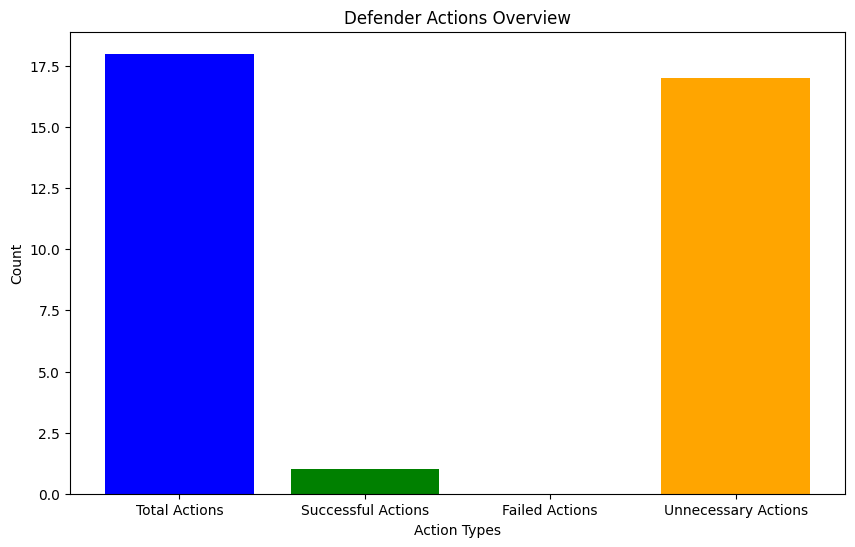

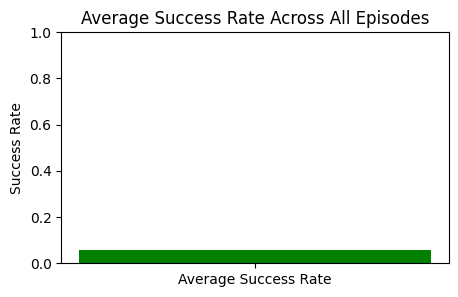

In [14]:
import matplotlib.pyplot as plt

total_actions_taken = metrics['total_actions_taken']
total_successful_actions = metrics['total_successful_actions']
total_failed_actions = metrics['total_failed_actions']
total_unnecessary_actions = metrics['total_unnecessary_actions']
average_success_rate = metrics['average_success_rate']

actions = ['Total Actions', 'Successful Actions', 'Failed Actions', 'Unnecessary Actions']
values = [total_actions_taken, total_successful_actions, total_failed_actions, total_unnecessary_actions]

plt.figure(figsize=(10, 6))
plt.bar(actions, values, color=['blue', 'green', 'red', 'orange'])
plt.xlabel('Action Types')
plt.ylabel('Count')
plt.title('Defender Actions Overview')
plt.show()

plt.figure(figsize=(5, 3))
plt.bar('Average Success Rate', average_success_rate, color='green')
plt.ylim(0, 1) 
plt.ylabel('Success Rate')
plt.title('Average Success Rate Across All Episodes')
plt.show()


# Trained Defender

In [15]:
import gym

gym_env = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    )
)

defender_name = "DefenderName" 
defender_agent = DefenderWrapper(gym_env,defender_name)

Generated nodes:
[('start', {'data': NodeInfo(services=[], vulnerabilities={'ScanExplorerRecentFiles': VulnerabilityInfo(description='Scan Windows Explorer recent files for possible references to other machines', type=<VulnerabilityType.LOCAL: 1>, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cc41fa90>, precondition=<cyberbattle.simulation.model.Precondition object at 0x7f185f375880>, rates=Rates(probingDetectionRate=0.0, exploitDetectionRate=0.0, successRate=1.0), URL='', cost=1.0, reward_string='Found a reference to a remote Linux node in bash history')}, value=0, properties=[], firewall=FirewallConfiguration(outgoing=[FirewallRule(port='RDP', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='SSH', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTPS', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTP', permission=<RulePermission.ALLOW: 0>, reason='')], incoming=[FirewallRule(port='RDP', permis

In [16]:
ep = w.EnvironmentBounds.of_identifiers(
    maximum_total_credentials=22,
    maximum_node_count=22,
    identifiers=gym_env.identifiers
)

statespace = w.HashEncoding(ep, [
            w.Feature_discovered_ports_sliding(ep),
            w.Feature_discovered_nodeproperties_sliding(ep),
            w.Feature_discovered_notowned_node_count(ep, 3)
        ], 5000)  

actionspace = w.RavelEncoding(ep, [
            w.Feature_active_node_properties(ep)])
print(statespace)
print(actionspace)
q_matrix = DefenderQMatrix(statespace, actionspace,gym_env)
learner2 = DefenderQLearner(gym_env, defender_agent, ep, q_matrix, epsilon=0.1, gamma=0.01, learning_rate=.01)
#learner2 = DefenderQLearner(gym_env, defender_agent, ep, q_matrix, epsilon=0.9, gamma=0.015, learning_rate=.07)

MultiDiscrete([5000])
MultiDiscrete([16384])


###### Defender Q-Learning Training
Learning with: episode_count=10,iteration_count=10,ϵ=0.99,ϵ_min=0.05, ϵ_multdecay=1.0,ϵ_expdecay=5000,Defender learner parameters: []
  ## Episode: 1/10 'Defender Q-Learning Training' ϵ=0.9900, Defender learner parameters: []


Episode 1|Iteration 5|reward:    0.0|last_reward_at:    4|Elapsed Time: 0:00:00|||

0 5 2
{'action_type': 0, 'node_id': 5, 'parameter': 2}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 2}
0 5 2
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=5, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '4_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1, 'successful_actions': 0, 'failed_actions': 0, 'unnecessary': 1}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
0 5 3
{'action_type': 0, 'node_id': 5, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 3}
0 5 3
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=5, Parameter=3
info {'action': 'reimage_node', 'status'

Episode 1|Iteration 10|reward: 10000.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Accessing Q-matrix with state=141, action=0
1 1 1
{'action_type': 1, 'node_id': 1, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 1, 'parameter': 1}
1 1 1
action type:  Block Traffic
Iteration 7: Action Taken: Type=Block Traffic, NodeID=1, Parameter=1
info {'action': 'block_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 7, 'successful_actions': 2, 'failed_actions': 0, 'unnecessary': 5}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
2 1 4
{'action_type': 2, 'node_id': 1, 'parameter': 4}
[DEBUG] Received action: {'action_type': 2, 'node_id': 1, 'parameter': 4}
2 1 4
action type:  Reimage Node
Iteration 8: Action Taken: Type=Reimage Node, NodeID=1, Parameter=4
info {'action': 'allow_traffic', 'statu

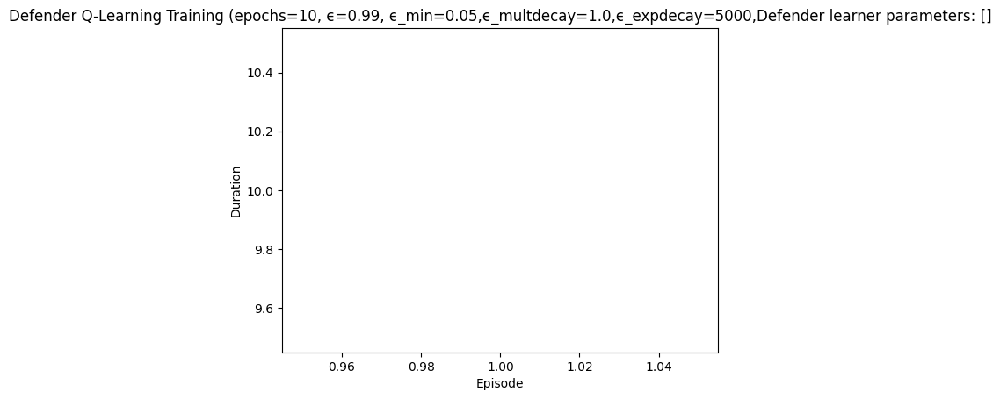

Rendering the current state of the environment
  ## Episode: 2/10 'Defender Q-Learning Training' ϵ=0.9883, Defender learner parameters: []


Episode 2|Iteration 10|reward: 5000.0|last_reward_at:    4|Elapsed Time: 0:00:00||


1 6 9
{'action_type': 1, 'node_id': 6, 'parameter': 9}
[DEBUG] Received action: {'action_type': 1, 'node_id': 6, 'parameter': 9}
1 6 9
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=6, Parameter=9
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 9, 'performance_metrics': {'actions_taken': 11, 'successful_actions': 5, 'failed_actions': 0, 'unnecessary': 6}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
3 12 9
{'action_type': 3, 'node_id': 12, 'parameter': 9}
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 9}
3 12 9
action type:  Allow Traffic
Iteration 2: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service not running or not found',

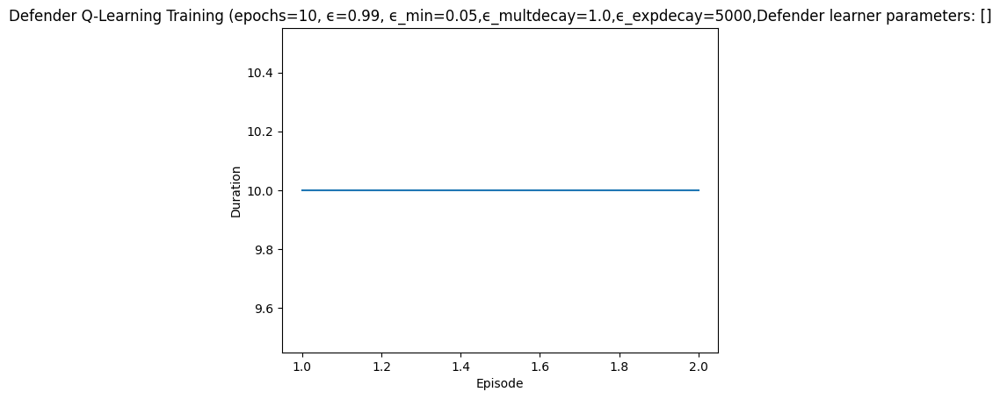

Rendering the current state of the environment
  ## Episode: 3/10 'Defender Q-Learning Training' ϵ=0.9864, Defender learner parameters: []


Episode 3|Iteration 10|reward: 25000.0|last_reward_at:    9|Elapsed Time: 0:00:00||


1 11 5
{'action_type': 1, 'node_id': 11, 'parameter': 5}
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 5}
1 11 5
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=11, Parameter=5
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 21, 'successful_actions': 8, 'failed_actions': 0, 'unnecessary': 13}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
2 6 6
{'action_type': 2, 'node_id': 6, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 6}
2 6 6
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=6, Parameter=6
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxN

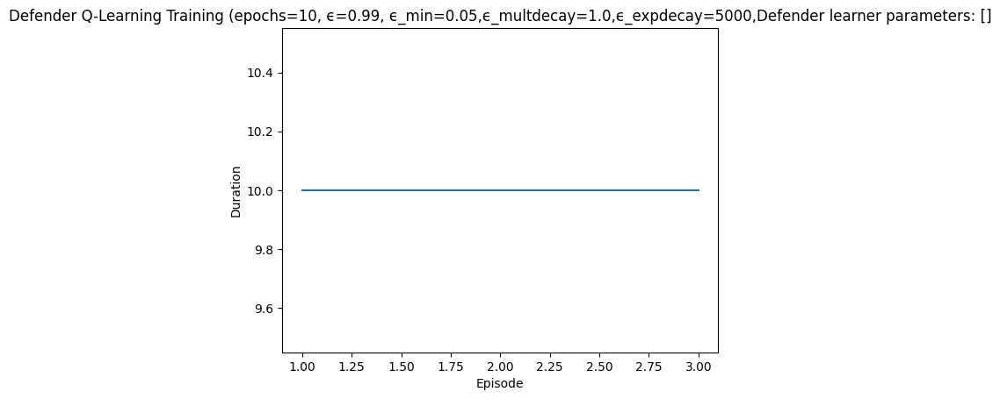

Rendering the current state of the environment
  ## Episode: 4/10 'Defender Q-Learning Training' ϵ=0.9846, Defender learner parameters: []


Episode 4|Iteration 6|reward: 19000.0|last_reward_at:    4|Elapsed Time: 0:00:00||

1 11 1
{'action_type': 1, 'node_id': 11, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 1}
1 11 1
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=11, Parameter=1
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 31, 'successful_actions': 15, 'failed_actions': 0, 'unnecessary': 16}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
2 7 6
{'action_type': 2, 'node_id': 7, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 6}
2 7 6
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=7, Parameter=6
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_Windo

Episode 4|Iteration 7|reward: 18000.0|last_reward_at:    6|Elapsed Time: 0:00:00||

0 11 0
{'action_type': 0, 'node_id': 11, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 11, 'parameter': 0}
0 11 0
action type:  Reimage Node
Iteration 7: Action Taken: Type=Reimage Node, NodeID=11, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '10_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 37, 'successful_actions': 19, 'failed_actions': 0, 'unnecessary': 18}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0


Episode 4|Iteration 10|reward: 15000.0|last_reward_at:    6|Elapsed Time: 0:00:00||


3 5 3
{'action_type': 3, 'node_id': 5, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 3}
3 5 3
action type:  Allow Traffic
Iteration 8: Action Taken: Type=Allow Traffic, NodeID=5, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 38, 'successful_actions': 19, 'failed_actions': 0, 'unnecessary': 19}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
0 9 1
{'action_type': 0, 'node_id': 9, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 1}
0 9 1
action type:  Reimage Node
Iteration 9: Action Taken: Type=Reimage Node, NodeID=9, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_Win

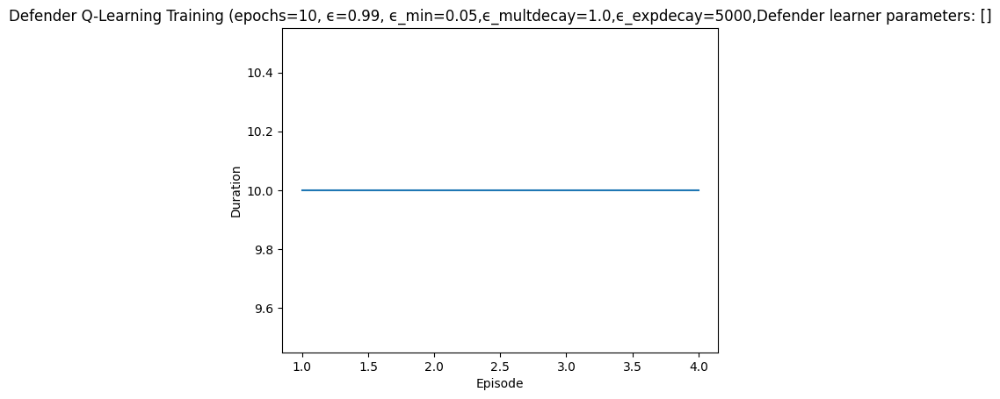

Rendering the current state of the environment
  ## Episode: 5/10 'Defender Q-Learning Training' ϵ=0.9827, Defender learner parameters: []


Episode 5|Iteration 10|reward: 6000.0|last_reward_at:    3|Elapsed Time: 0:00:00||


2 6 7
{'action_type': 2, 'node_id': 6, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 7}
2 6 7
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=6, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 41, 'successful_actions': 20, 'failed_actions': 0, 'unnecessary': 21}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
0 0 6
{'action_type': 0, 'node_id': 0, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 6}
0 0 6
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=0, Parameter=6
info {'action': 'reimage_node', 'status': 'success', 'node_id': 'start', 'performan

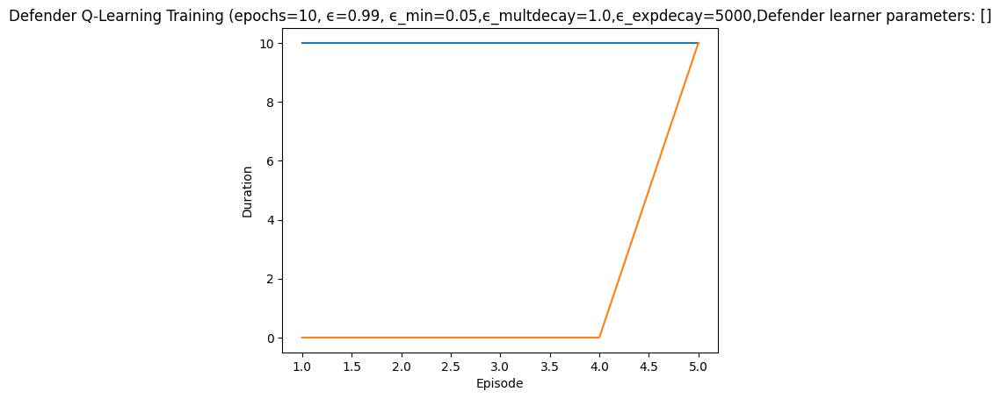

Rendering the current state of the environment
  ## Episode: 6/10 'Defender Q-Learning Training' ϵ=0.9808, Defender learner parameters: []


Episode 6|Iteration 2|reward: 3000.0|last_reward_at:    2|Elapsed Time: 0:00:00|||

0 12 3
{'action_type': 0, 'node_id': 12, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 3}
0 12 3
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=12, Parameter=3
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 51, 'successful_actions': 22, 'failed_actions': 0, 'unnecessary': 29}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 8 1
{'action_type': 1, 'node_id': 8, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 1}
1 8 1
action type:  Block Traffic
Iteration 2: Action Taken: Type=Block Traffic, NodeID=8, Parameter=1
info {'action': 'block_traffic', 'status': 'succ

Episode 6|Iteration 4|reward: 1000.0|last_reward_at:    2|Elapsed Time: 0:00:00||

4 12 8
{'action_type': 4, 'node_id': 12, 'parameter': 8}
[DEBUG] Received action: {'action_type': 4, 'node_id': 12, 'parameter': 8}
4 12 8
action type:  Start Service
Iteration 3: Action Taken: Type=Start Service, NodeID=12, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 53, 'successful_actions': 23, 'failed_actions': 0, 'unnecessary': 30}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 0 6
{'action_type': 3, 'node_id': 0, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 0, 'parameter': 6}
3 0 6
action type:  Allow Traffic
Iteration 4: Action Taken: Type=Allow Traffic, NodeID=0, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'a

Episode 6|Iteration 9|reward: 11000.0|last_reward_at:    8|Elapsed Time: 0:00:00||

4 6 5
{'action_type': 4, 'node_id': 6, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 6, 'parameter': 5}
4 6 5
action type:  Start Service
Iteration 5: Action Taken: Type=Start Service, NodeID=6, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 55, 'successful_actions': 23, 'failed_actions': 0, 'unnecessary': 32}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 4 8
{'action_type': 2, 'node_id': 4, 'parameter': 8}
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 8}
2 4 8
action type:  Reimage Node
Iteration 6: Action Taken: Type=Reimage Node, NodeID=4, Parameter=8
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_

Episode 6|Iteration 10|reward: 6000.0|last_reward_at:    8|Elapsed Time: 0:00:00||


2 0 6
{'action_type': 2, 'node_id': 0, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 6}
2 0 6
action type:  Reimage Node
Iteration 10: Action Taken: Type=Reimage Node, NodeID=0, Parameter=6
info {'action': 'allow_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 6, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 60, 'successful_actions': 26, 'failed_actions': 1, 'unnecessary': 33}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
  Episode 6 stopped at t=10 
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/0 (NaN)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  Episode 6

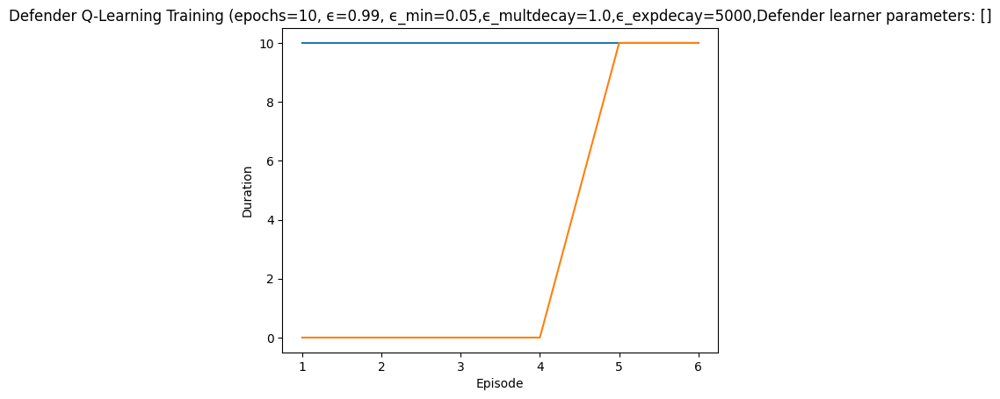

Rendering the current state of the environment
  ## Episode: 7/10 'Defender Q-Learning Training' ϵ=0.9790, Defender learner parameters: []


Episode 7|Iteration 5|reward:    0.0|last_reward_at:    3|Elapsed Time: 0:00:00|||

0 2 4
{'action_type': 0, 'node_id': 2, 'parameter': 4}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 4}
0 2 4
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=2, Parameter=4
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 61, 'successful_actions': 26, 'failed_actions': 1, 'unnecessary': 34}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 12 6
{'action_type': 3, 'node_id': 12, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 6}
3 12 6
action type:  Allow Traffic
Iteration 2: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service

Episode 7|Iteration 10|reward: 1000.0|last_reward_at:    7|Elapsed Time: 0:00:00||


1 5 2
{'action_type': 1, 'node_id': 5, 'parameter': 2}
[DEBUG] Received action: {'action_type': 1, 'node_id': 5, 'parameter': 2}
1 5 2
action type:  Block Traffic
Iteration 6: Action Taken: Type=Block Traffic, NodeID=5, Parameter=2
info {'action': 'block_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 2, 'performance_metrics': {'actions_taken': 66, 'successful_actions': 28, 'failed_actions': 1, 'unnecessary': 37}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 13 2
{'action_type': 2, 'node_id': 13, 'parameter': 2}
[DEBUG] Received action: {'action_type': 2, 'node_id': 13, 'parameter': 2}
2 13 2
action type:  Reimage Node
Iteration 7: Action Taken: Type=Reimage Node, NodeID=13, Parameter=2
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_na

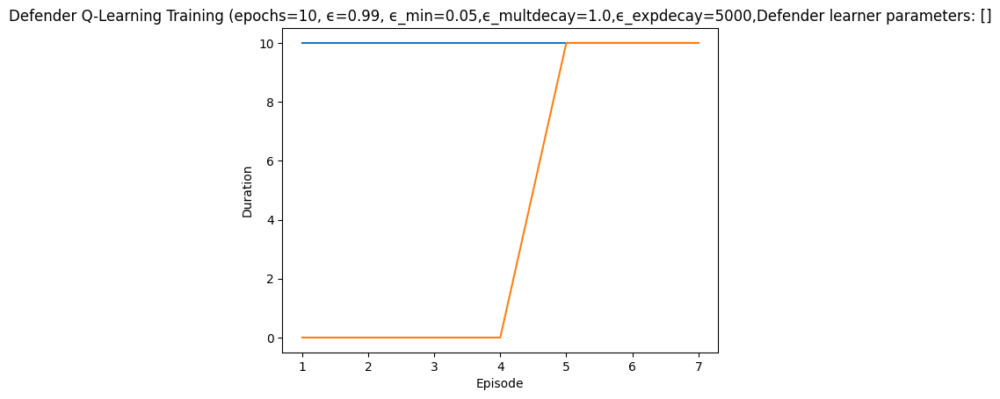

Rendering the current state of the environment
  ## Episode: 8/10 'Defender Q-Learning Training' ϵ=0.9771, Defender learner parameters: []


Episode 8|Iteration 7|reward: 8000.0|last_reward_at:    7|Elapsed Time: 0:00:00|||

0 13 9
{'action_type': 0, 'node_id': 13, 'parameter': 9}
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 9}
0 13 9
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=13, Parameter=9
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '12_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 71, 'successful_actions': 29, 'failed_actions': 2, 'unnecessary': 40}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 6 2
{'action_type': 2, 'node_id': 6, 'parameter': 2}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 2}
2 6 2
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=6, Parameter=2
info {'action': 'allow_traffic', 'status': 'succ

Episode 8|Iteration 8|reward: 7000.0|last_reward_at:    7|Elapsed Time: 0:00:00||

 3 6
{'action_type': 0, 'node_id': 3, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 6}
0 3 6
action type:  Reimage Node
Iteration 8: Action Taken: Type=Reimage Node, NodeID=3, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 78, 'successful_actions': 32, 'failed_actions': 2, 'unnecessary': 44}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 13 7
{'action_type': 4, 'node_id': 13, 'parameter': 7}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 7}
4 13 7
action type:  Start Service
Iteration 9: Action Taken: Type=Start Service, NodeID=13, Parameter=7
info {'status': 'unnecessary', 'reason': 'Servic

Episode 8|Iteration 10|reward: 5000.0|last_reward_at:    7|Elapsed Time: 0:00:00||



4 11 4
{'action_type': 4, 'node_id': 11, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 4}
4 11 4
action type:  Start Service
Iteration 10: Action Taken: Type=Start Service, NodeID=11, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 80, 'successful_actions': 32, 'failed_actions': 2, 'unnecessary': 46}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
  Episode 8 stopped at t=10 
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/0 (NaN)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  Episode 8 break

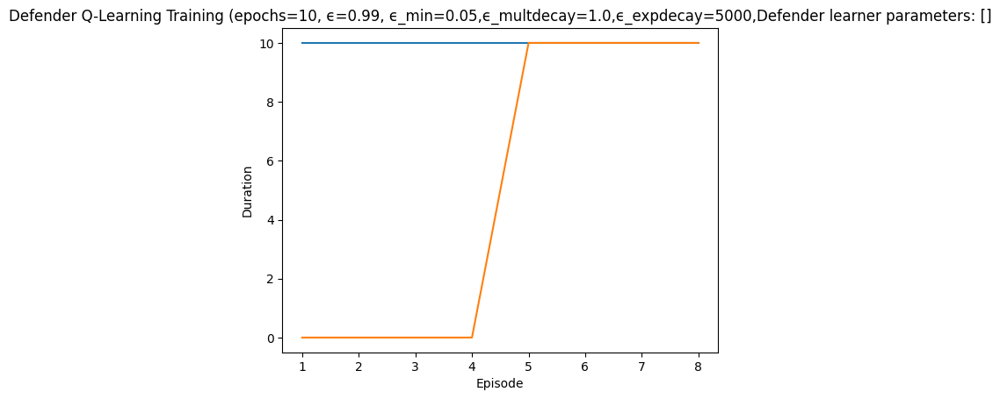

Rendering the current state of the environment
  ## Episode: 9/10 'Defender Q-Learning Training' ϵ=0.9753, Defender learner parameters: []


Episode 9|Iteration 10|reward:    0.0|last_reward_at:   10|Elapsed Time: 0:00:00||


0 6 1
{'action_type': 0, 'node_id': 6, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 1}
0 6 1
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=6, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 81, 'successful_actions': 32, 'failed_actions': 2, 'unnecessary': 47}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 1 4
{'action_type': 3, 'node_id': 1, 'parameter': 4}
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 4}
3 1 4
action type:  Allow Traffic
Iteration 2: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service not 

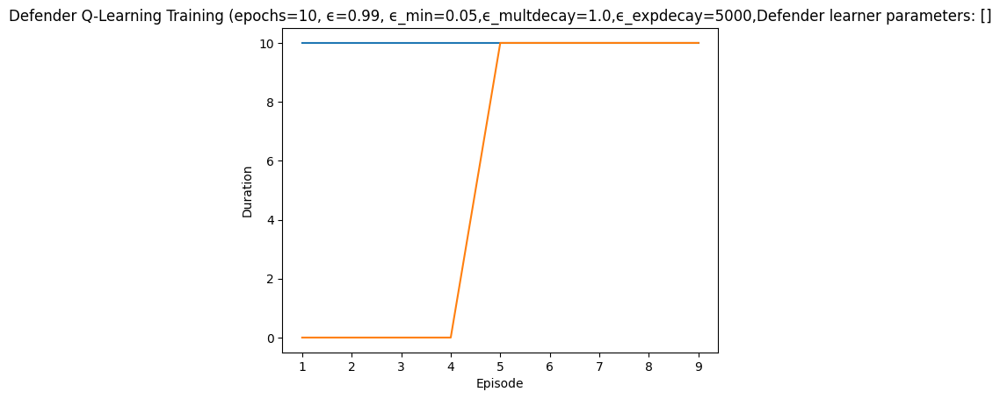

Rendering the current state of the environment
  ## Episode: 10/10 'Defender Q-Learning Training' ϵ=0.9734, Defender learner parameters: []


Episode 10|Iteration 10|reward: 10000.0|last_reward_at:   10|Elapsed Time: 0:00:00||


0 8 5
{'action_type': 0, 'node_id': 8, 'parameter': 5}
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 5}
0 8 5
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=8, Parameter=5
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 91, 'successful_actions': 34, 'failed_actions': 2, 'unnecessary': 55}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 4 4
{'action_type': 4, 'node_id': 4, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 4}
4 4 4
action type:  Start Service
Iteration 2: Action Taken: Type=Start Service, NodeID=4, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service alre

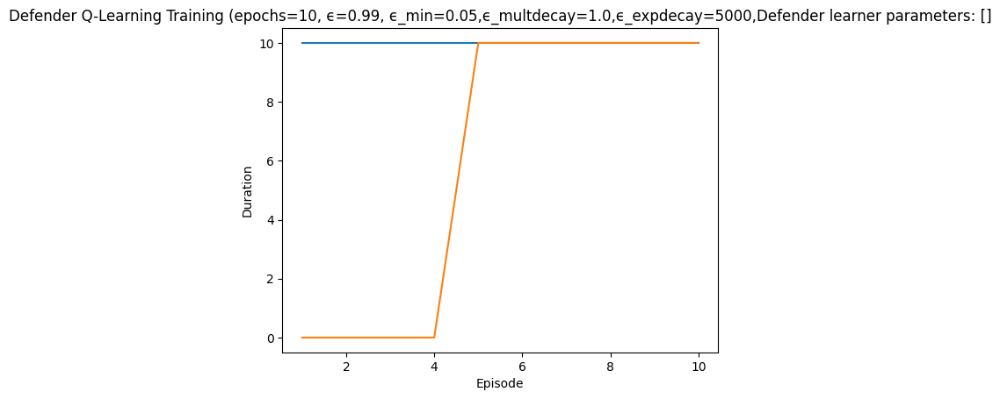

Rendering the current state of the environment
simulation ended


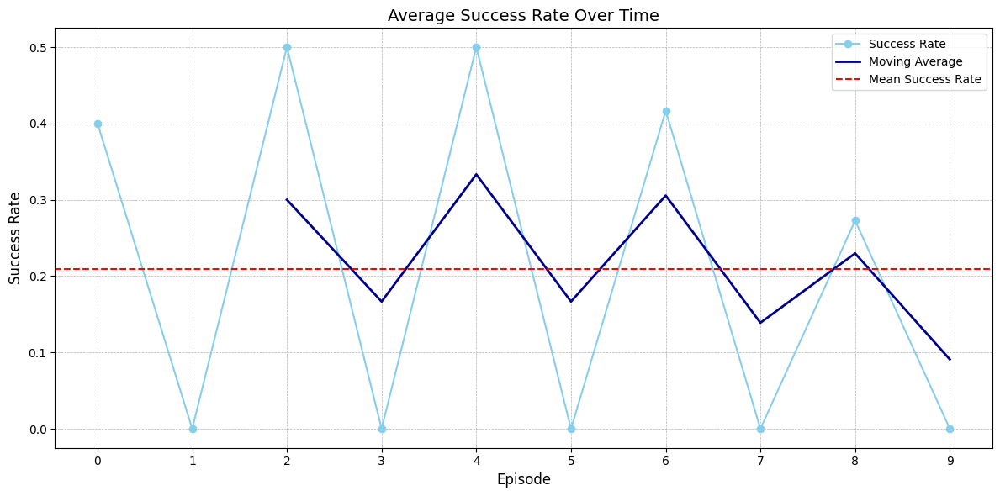

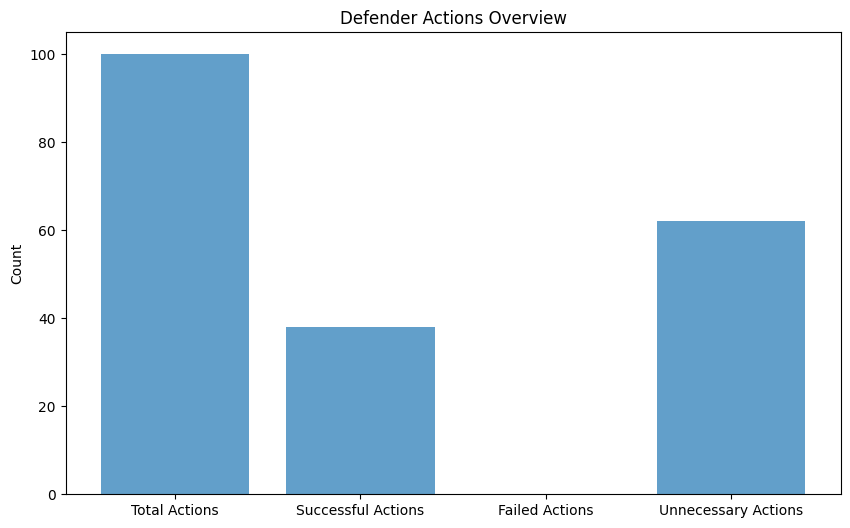

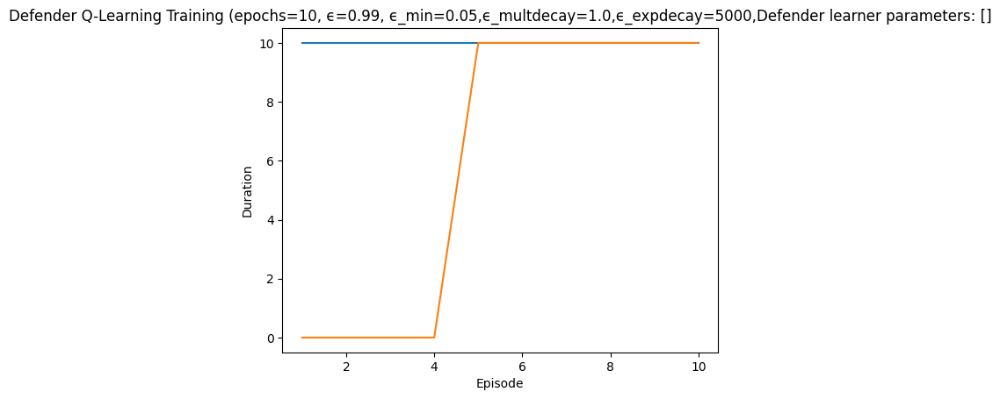

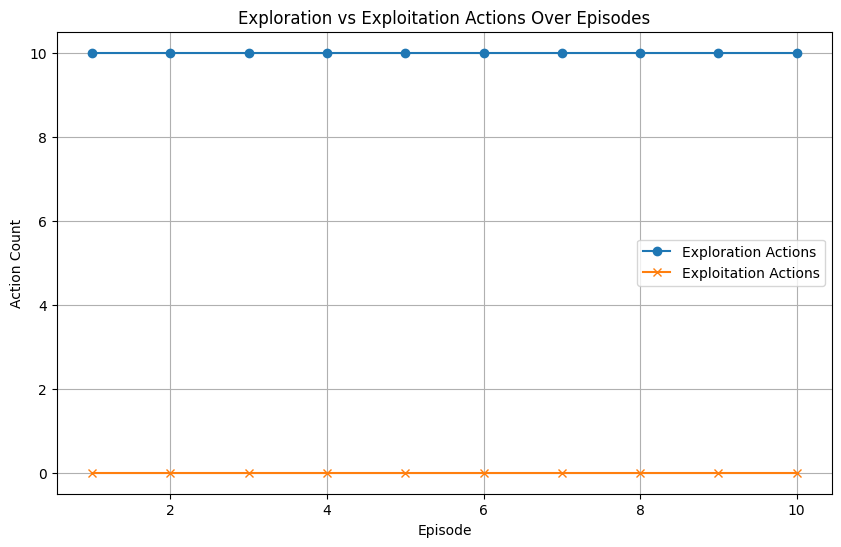

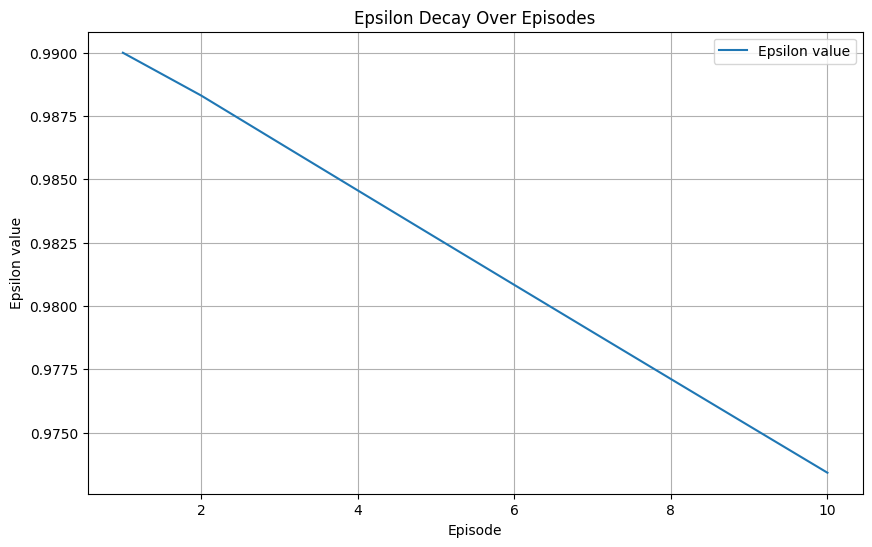

In [17]:
random.seed(120394016)
trained_defender = epsilon_greedy_defender_training(
    cyberbattle_gym_env=gym_env,
    environment_properties=ep,
    learner=learner2,
    episode_count=10,
    iteration_count=10,
    epsilon=0.99,
    epsilon_exponential_decay=5000,
    epsilon_minimum=0.05,
    epsilon_multdecay=0.99999999999999999999,  # 0.999,,
    verbosity=logging.INFO,
    render=True,
    plot_episodes_length=True,
    title="Defender Q-Learning Training"
)

# Stackelberg Interaction

In [18]:
attacker_learner = trained_attacker['learner']

In [19]:
defender_learner = trained_defender['learner']

In [20]:
import numpy as np
import matplotlib.pyplot as plt

class SimulationTracker:
    def __init__(self):
        self.attacker_rewards = []
        self.defender_rewards = []
        self.actions_taken = {'attacker': [], 'defender': []}
        self.exploration_actions = {'attacker': 0, 'defender': 0}
        self.exploitation_actions = {'attacker': 0, 'defender': 0}
        self.episode_lengths = []
        self.reward_variability = []
        self.state_visitation_frequencies = {}
        self.temporal_differences = []
        self.infected_nodes = []

    def log_episode(self, attacker_reward, defender_reward, episode_length, episode_rewards):
        self.attacker_rewards.append(attacker_reward)
        self.defender_rewards.append(defender_reward)
        self.episode_lengths.append(episode_length)
        self.reward_variability.append(np.var(episode_rewards))
        #self.temporal_differences.append(temporal_difference)

    def log_action(self, role, action, exploration):
        action_str = str(action)  # Convert the action dictionary to a string
        self.actions_taken[role].append(action_str)
        if exploration:
            self.exploration_actions[role] += 1
        else:
            self.exploitation_actions[role] += 1


    def log_state_visitation(self, state):
        if state not in self.state_visitation_frequencies:
            self.state_visitation_frequencies[state] = 1
        else:
            self.state_visitation_frequencies[state] += 1

    def log_infected_nodes(self, nodes_count):
        self.infected_nodes.append(nodes_count)

    def print_summary(self):
        print("Simulation Summary:")
        print(f"Average Attacker Reward: {np.mean(self.attacker_rewards)}")
        print(f"Average Defender Reward: {np.mean(self.defender_rewards)}")
        print(f"Average Episode Length: {np.mean(self.episode_lengths)} steps")
        print(f"Average Reward Variability: {np.mean(self.reward_variability)}")
        print(f"Average Temporal Difference: {np.mean(self.temporal_differences)}")
        print(f"Average Infected Nodes per Episode: {np.mean(self.infected_nodes)}")

        print("\nExploration vs. Exploitation:")
        for role in ['attacker', 'defender']:
            total_actions = self.exploration_actions[role] + self.exploitation_actions[role]
            if total_actions > 0:
                print(f"{role.capitalize()} Exploration: {self.exploration_actions[role] / total_actions:.2f}")
                print(f"{role.capitalize()} Exploitation: {self.exploitation_actions[role] / total_actions:.2f}")

        self._print_action_distributions()

        self._plot_rewards()

    def _print_action_distributions(self):
        print("\nAction Distributions:")
        for role, actions in self.actions_taken.items():
            unique_actions, counts = np.unique(actions, return_counts=True)
            print(f"{role.capitalize()} Actions:")
            for action, count in zip(unique_actions, counts):
                print(f"Action {action}: {count} times")


    def _plot_rewards(self):
        plt.figure(figsize=(10, 5))
        plt.plot(self.attacker_rewards, label='Attacker Rewards')
        plt.plot(self.defender_rewards, label='Defender Rewards')
        plt.xlabel('Episode')
        plt.ylabel('Reward')
        plt.title('Rewards per Episode for Attacker and Defender')
        plt.legend()
        plt.show()


In [21]:
from cyberbattle.agents.baseline.agent_wrapper import AgentWrapper, StateAugmentation
def wrap_environment(env):
    initial_observation = env.reset()  
    state = StateAugmentation(initial_observation)  
    return AgentWrapper(env, state)



# Trained Defender

In [22]:
import gym

gym_env = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    )
)

defender_name = "DefenderName" 
defender_agent = DefenderWrapper(gym_env,defender_name)

gym_environment = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    ),
    defender_agent=defender_agent
)



Generated nodes:
[('start', {'data': NodeInfo(services=[], vulnerabilities={'ScanExplorerRecentFiles': VulnerabilityInfo(description='Scan Windows Explorer recent files for possible references to other machines', type=<VulnerabilityType.LOCAL: 1>, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cda3a1f0>, precondition=<cyberbattle.simulation.model.Precondition object at 0x7f185f375880>, rates=Rates(probingDetectionRate=0.0, exploitDetectionRate=0.0, successRate=1.0), URL='', cost=1.0, reward_string='Found a reference to a remote Linux node in bash history')}, value=0, properties=[], firewall=FirewallConfiguration(outgoing=[FirewallRule(port='RDP', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='SSH', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTPS', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTP', permission=<RulePermission.ALLOW: 0>, reason='')], incoming=[FirewallRule(port='RDP', permis

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 5, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 0}
0 5 0
defender reward -1000
defender info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '4_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1, 'successful_actions': 0, 'failed_actions': 0, 'unnecessary': 1}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: 0.0
Average Defender Reward: -1000.0
Average Episode Length: 1.0 steps
Average Reward Variability: 0.0
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Defen

/home/gmod1/miniconda3/envs/cybersim/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/gmod1/miniconda3/envs/cybersim/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


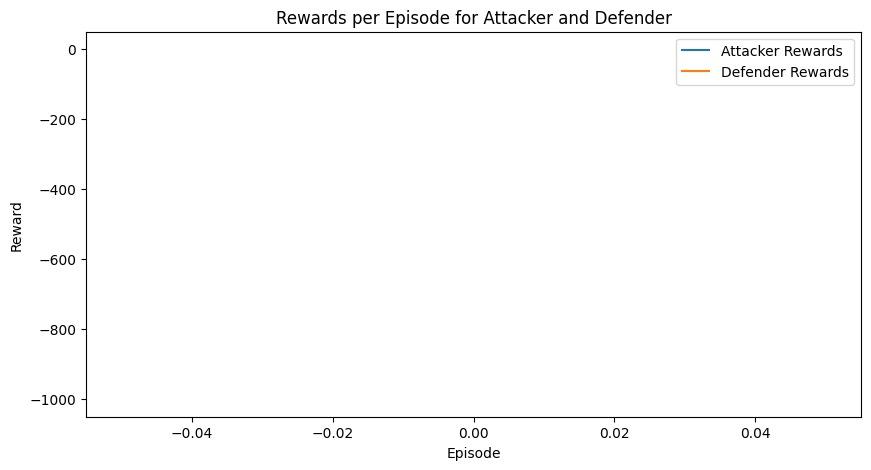

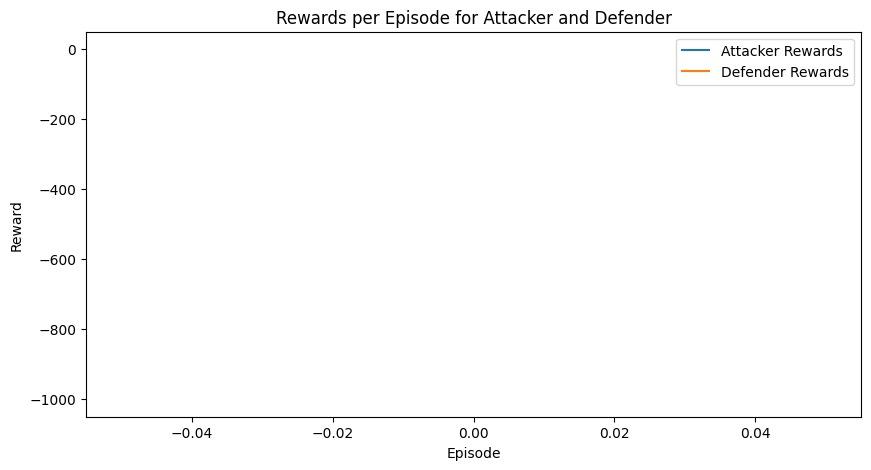

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 9, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
1 9 0
defender reward 4000
defender info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 2, 'successful_actions': 1, 'failed_actions': 0, 'unnecessary': 1}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: 0.0
Average Defender Reward: 1000.0
Average Episode Length: 1.5 steps
Average Reward Variability: 3125000.0
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Defender Exploration: 0.00
Defender Exploitat

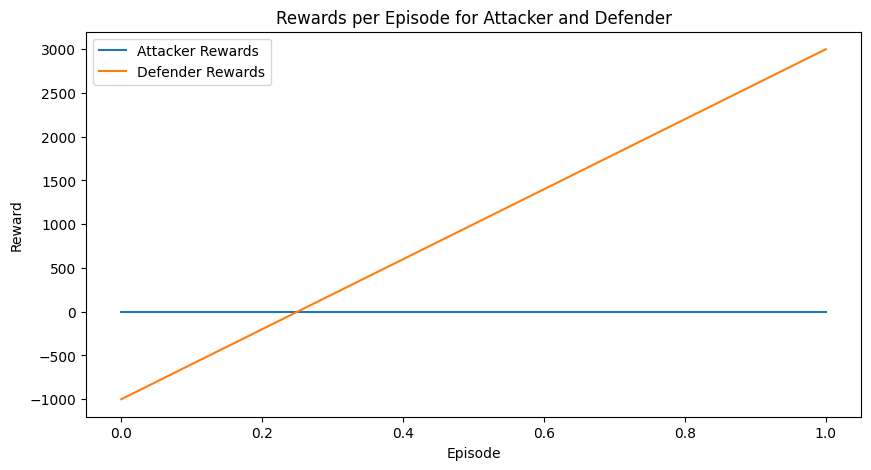

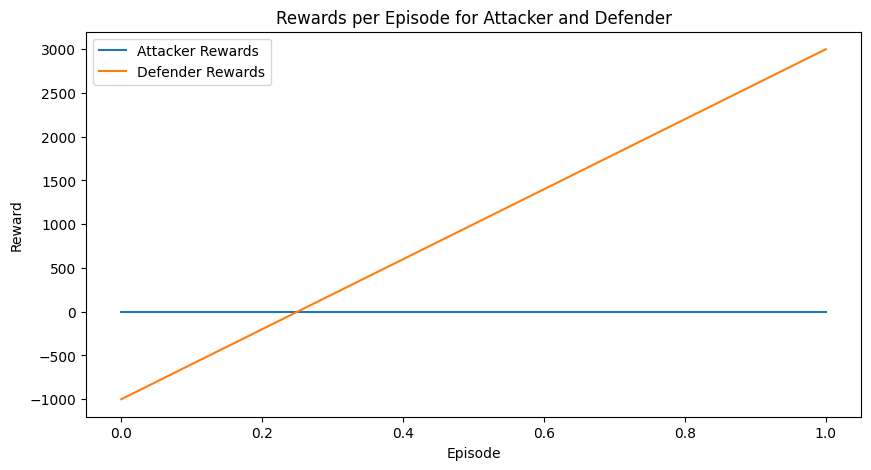

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 4, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 3, 'successful_actions': 1, 'failed_actions': 0, 'unnecessary': 2}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: 0.0
Average Defender Reward: 1333.3333333333333
Average Episode Length: 2.0 steps
Average Reward Variability: 3935185.185185185
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Defender Explo

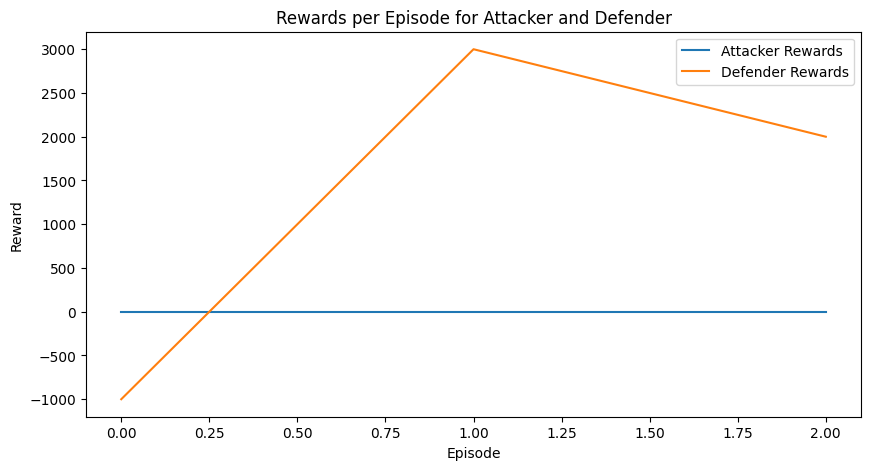

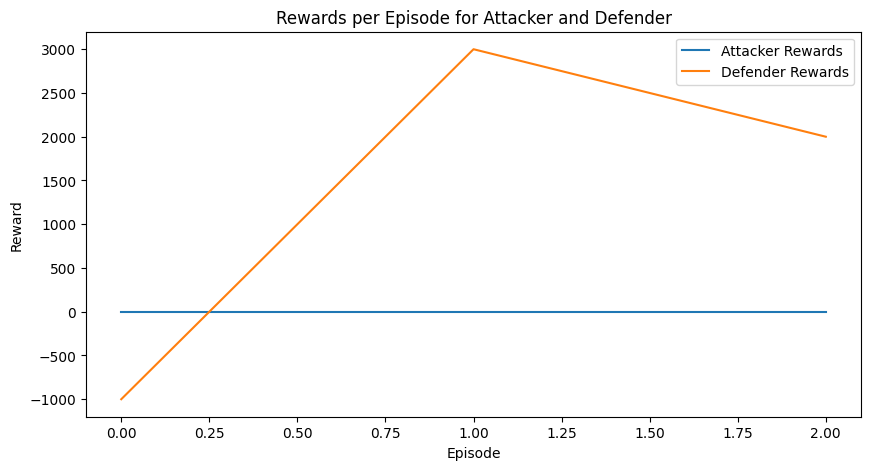

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
Executing defender action {'action_type': 3, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4, 'successful_actions': 1, 'failed_actions': 0, 'unnecessary': 3}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: 0.0
Average Defender Reward: 1250.0
Average Episode Length: 2.5 steps
Average Reward Variability: 4123263.888888889
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Defender Exploration: 0.00
Defe

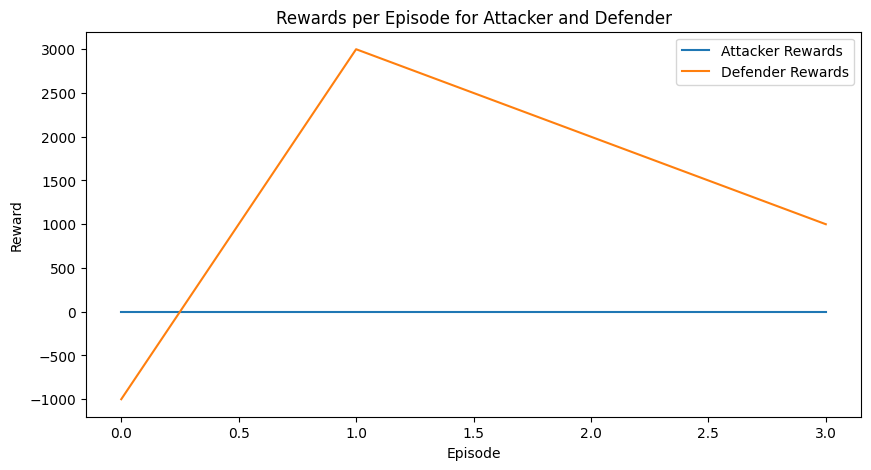

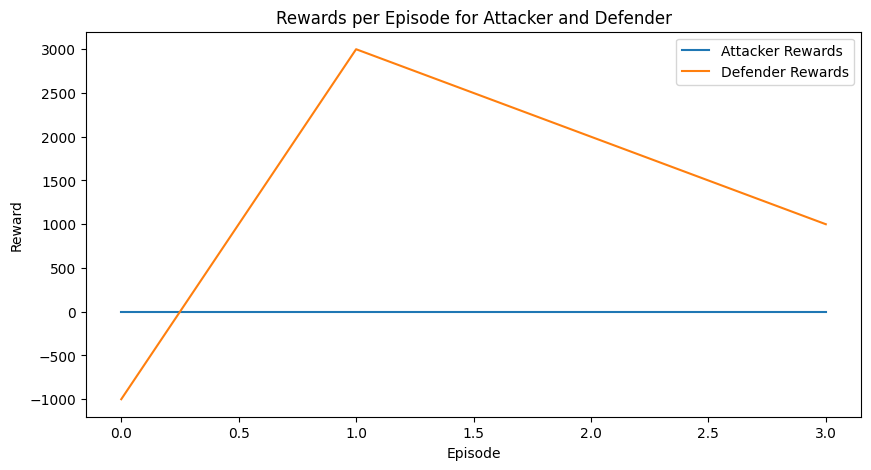

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 4, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 4, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 4, 'parameter': 0}
1 4 0
defender reward 4000
defender info {'action': 'block_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5, 'successful_actions': 2, 'failed_actions': 0, 'unnecessary': 3}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: 0.0
Average Defender Reward: 2000.0
Average Episode Length: 3.0 steps
Average Reward Variability: 4498611.111111111
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Defender Exploration: 0.00
Defender Exp

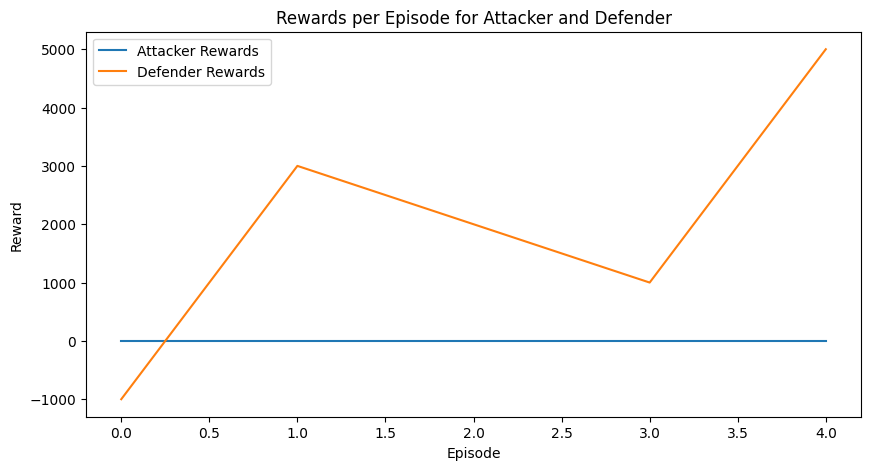

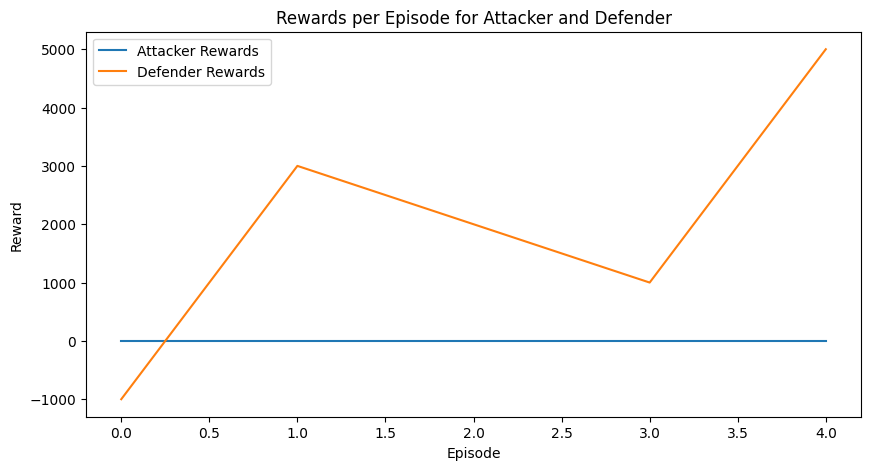

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 2, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
4 2 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6, 'successful_actions': 2, 'failed_actions': 0, 'unnecessary': 4}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: 0.0
Average Defender Reward: 2333.3333333333335
Average Episode Length: 3.5 steps
Average Reward Variability: 4674768.518518519
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Defender Explo

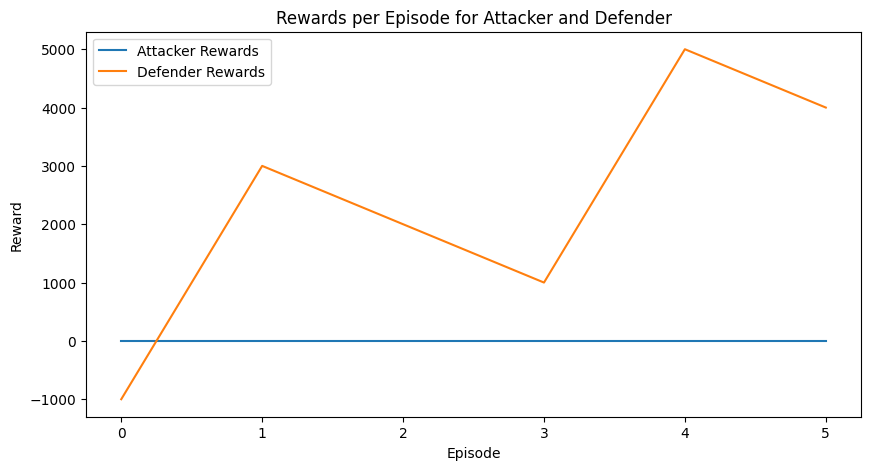

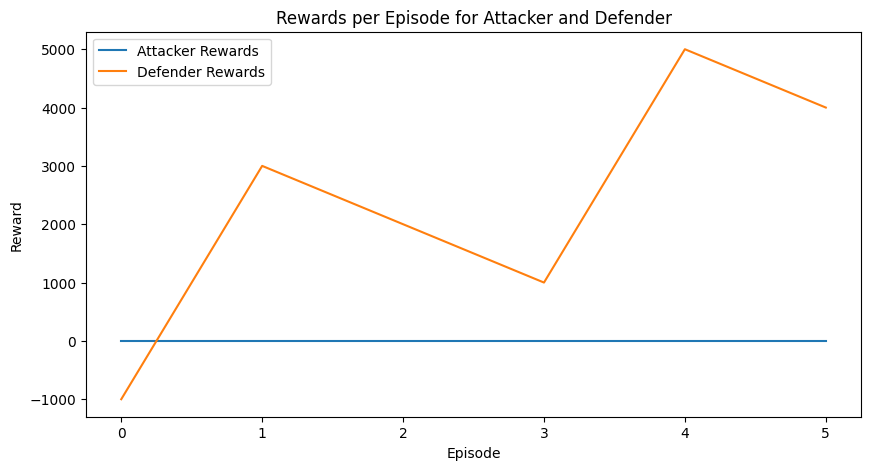

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 1, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 1, 'parameter': 0}
2 1 0
defender reward 4000
defender info {'action': 'allow_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7, 'successful_actions': 3, 'failed_actions': 0, 'unnecessary': 4}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: 0.0
Average Defender Reward: 3142.8571428571427
Average Episode Length: 4.0 steps
Average Reward Variability: 4881580.012957565
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Defender Exploration: 0.00

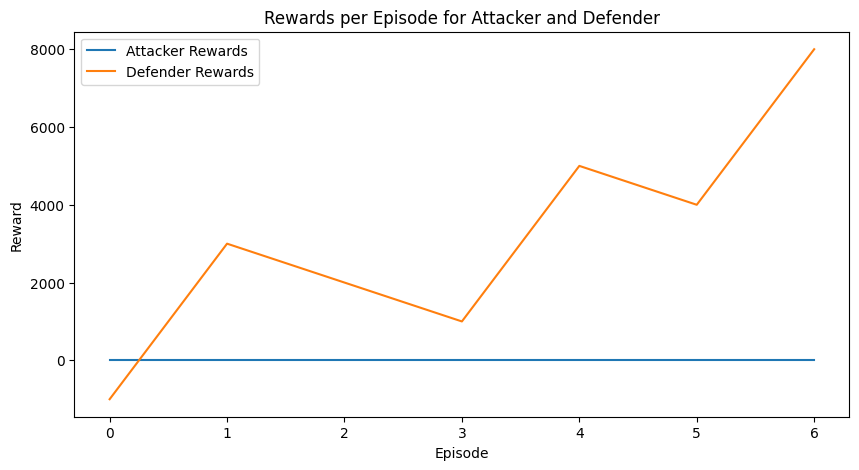

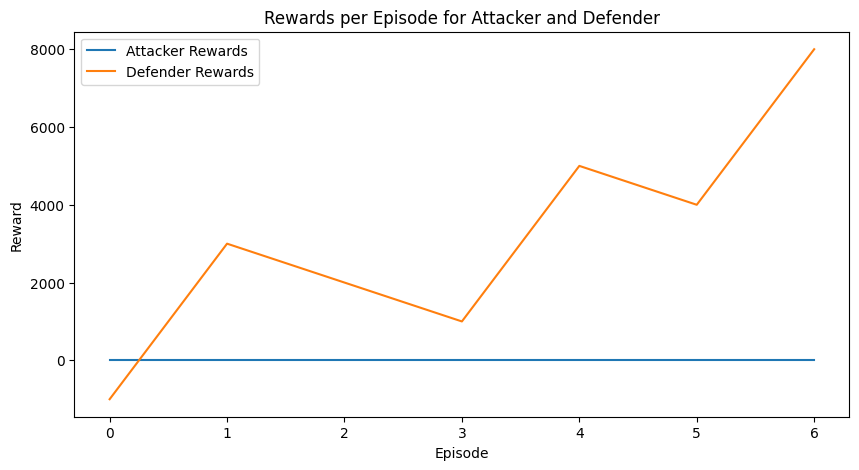

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 9, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 9, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 0}
0 9 0
defender reward -1000
defender info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8, 'successful_actions': 3, 'failed_actions': 0, 'unnecessary': 5}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: 0.0
Average Defender Reward: 3625.0
Average Episode Length: 4.5 steps
Average Reward Variability: 5003804.386337869
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploi

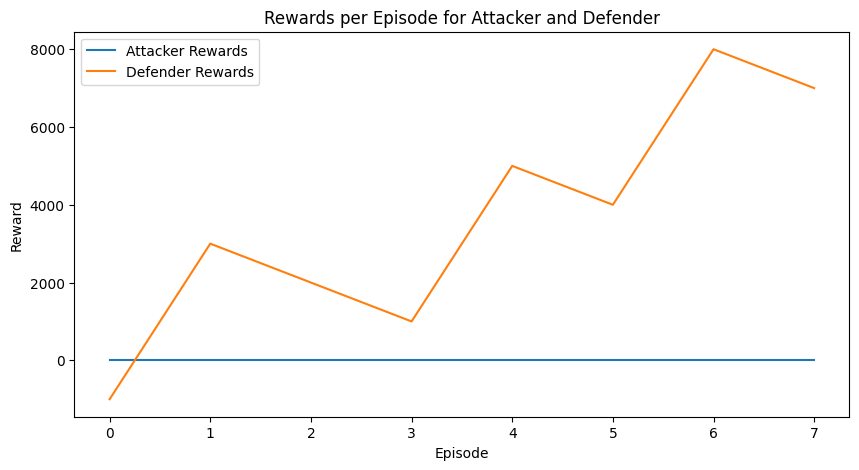

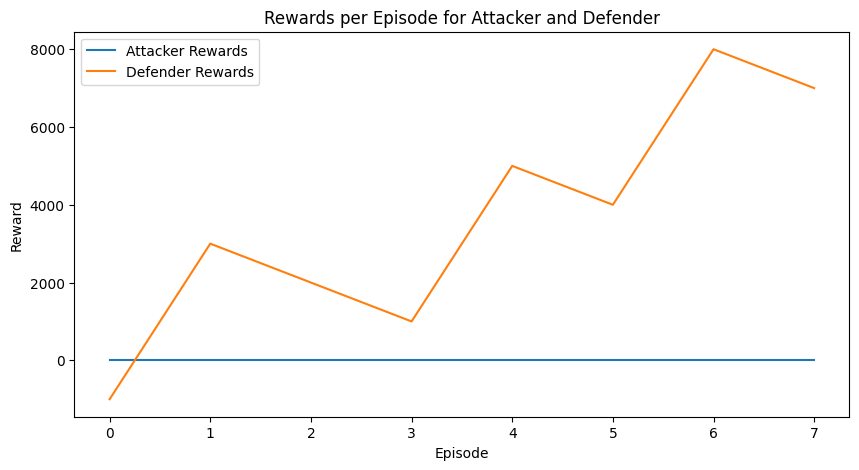

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 4, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9, 'successful_actions': 3, 'failed_actions': 0, 'unnecessary': 6}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: 0.0
Average Defender Reward: 3888.8888888888887
Average Episode Length: 5.0 steps
Average Reward Variability: 5065110.071806501
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Defender Explo

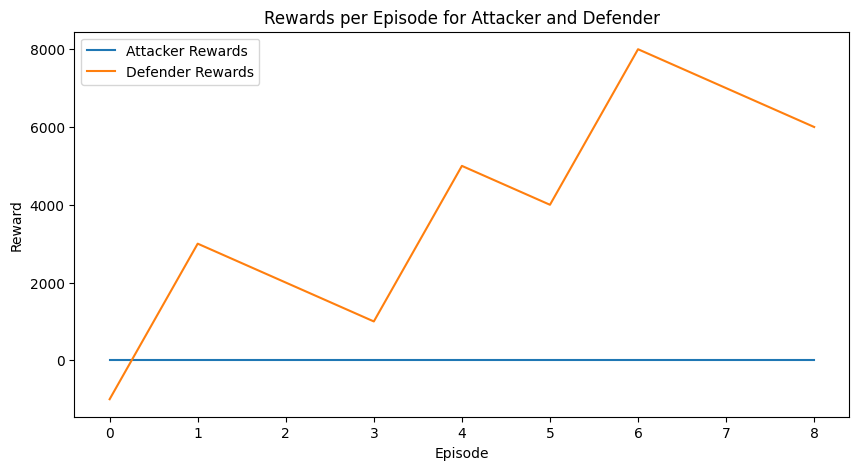

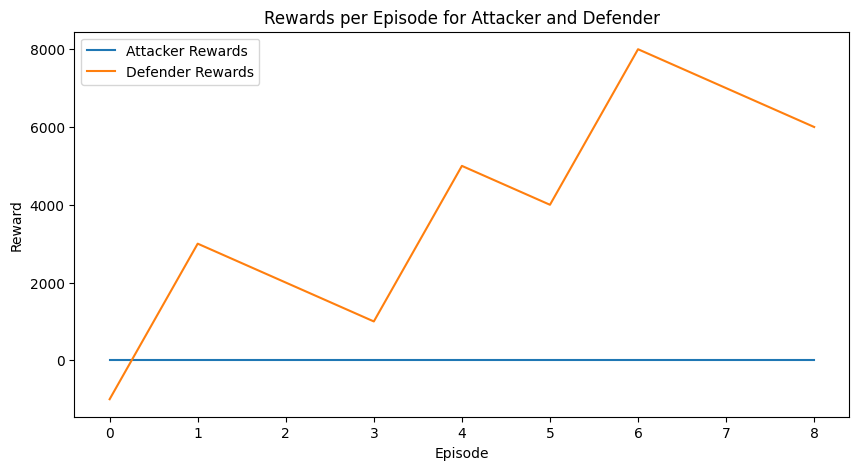

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
{'description': 'CyberBattle simulation', 'duration_in_ms': 2847.587823867798, 'step_count': 10, 'network_availability': 1.0, 'defender_info': {}}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 11, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
4 11 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service alrea

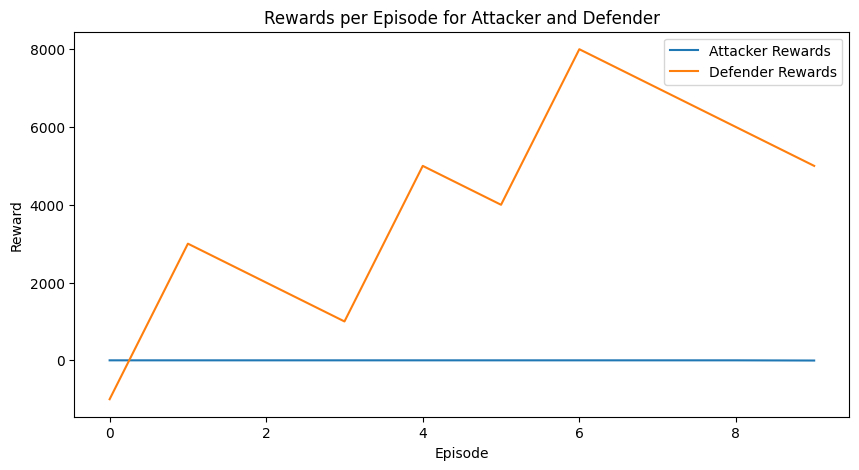

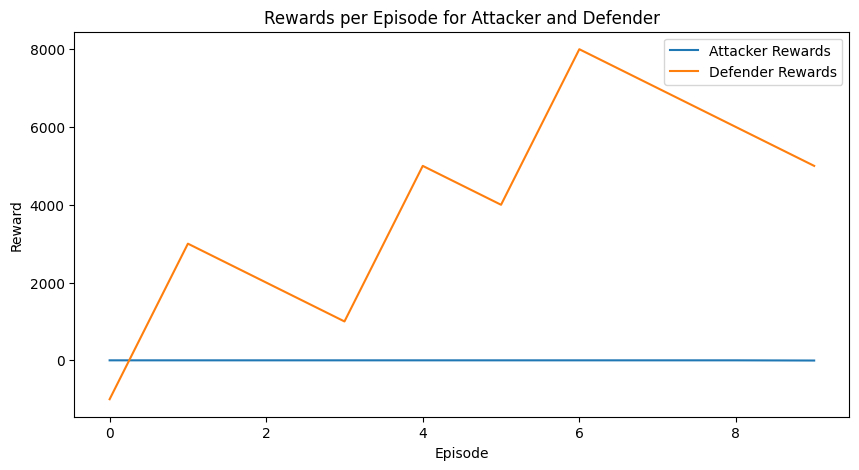

Episode 1: Attacker Reward = -5.0, Defender Reward = 5000
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 2, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 2, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 0}
0 2 0
defender reward -1000
defender info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 11, 'successful_actions': 3, 'failed_actions': 0, 'unnecessary': 8}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -0.45454545454545453
Average Defender Reward: 3545.4545454545455
Average Episode Length: 5.090909090909091 steps
Average Reward Variability: 4579981.305933

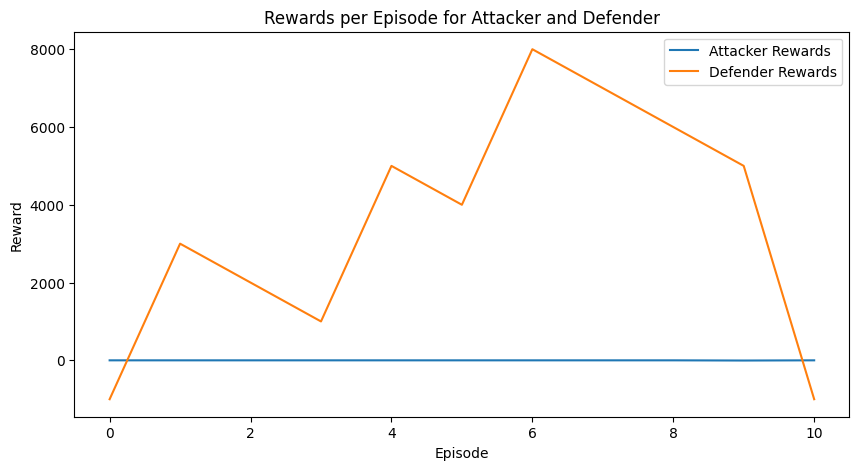

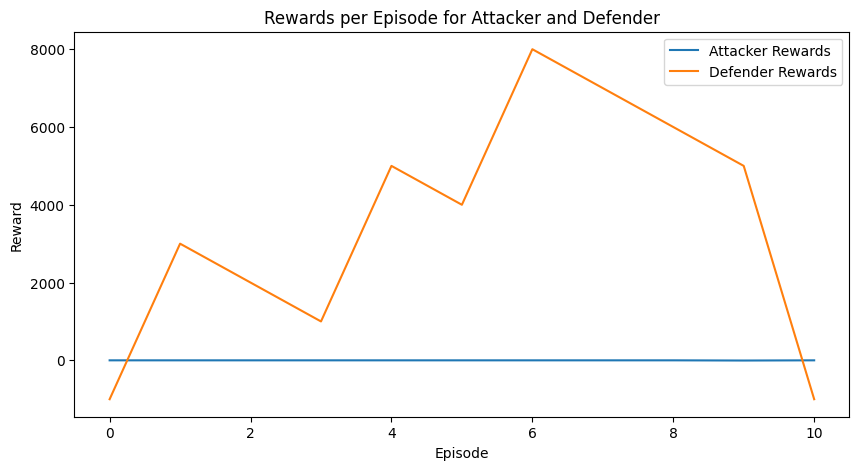

{'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Simulation Summary:
Average Attacker Reward: -0.4166666666666667
Average Defender Reward: 3166.25
Average Episode Length: 4.833333333333333 steps
Average Reward Variability: 4218941.717938897
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Attacker Exploration: 1.00
Attacker Exploitation: 0.00
Defender Exploration: 0.08
Defender Exploitation: 0.92

Action Distributions:
Attacker Actions:
Action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}: 1 times
Defender Actions:
Action {'action_type': 0, 'node_id': 2, 'parameter': 0}: 1 times
Action {'ac

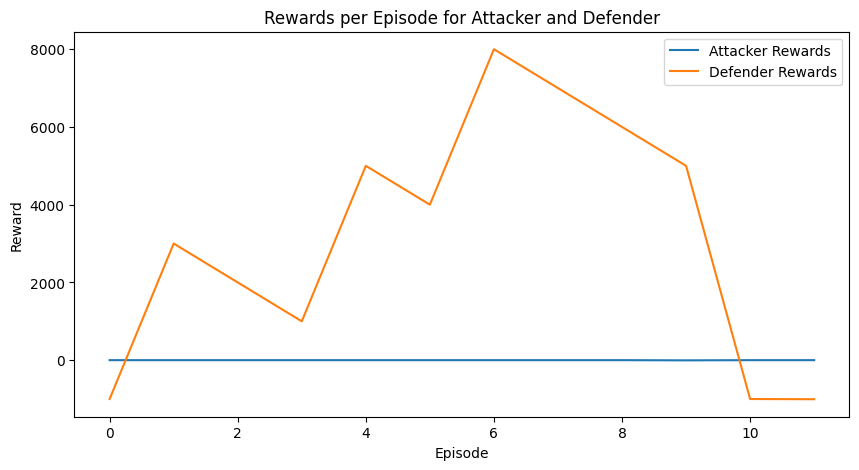

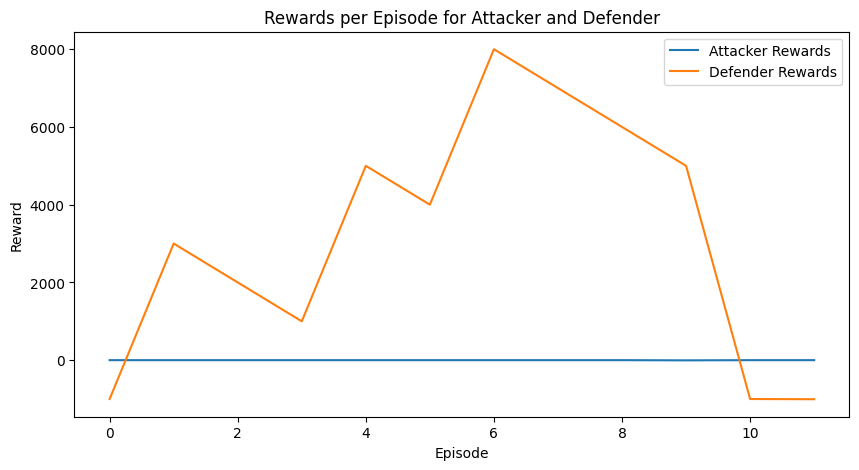

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 5, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 5, 'parameter': 0}
4 5 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 12, 'successful_actions': 3, 'failed_actions': 0, 'unnecessary': 9}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -0.38461538461538464
Average Defender Reward: 2768.4615384615386
Average Episode Length: 4.6923076923076925 steps
Average Reward Variability: 3911331.2439094093
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploratio

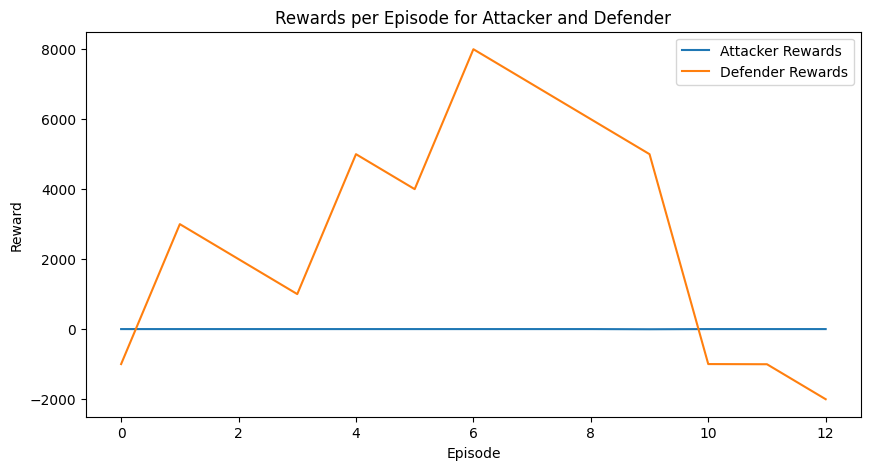

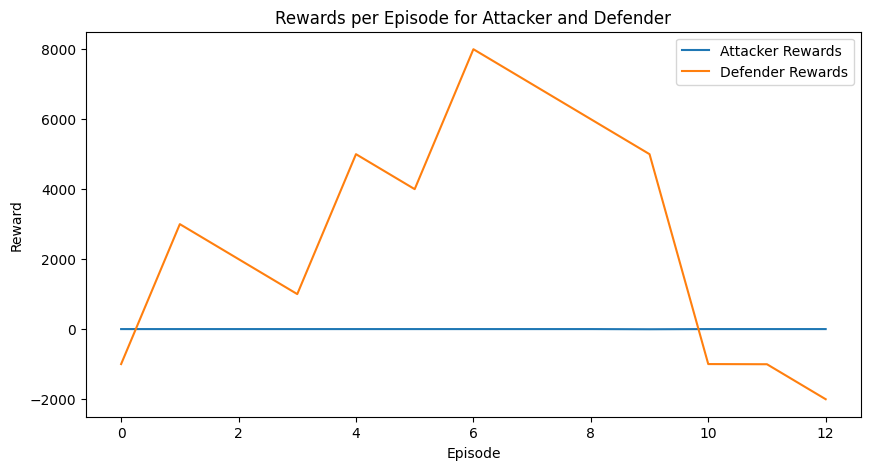

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 4, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
2 4 0
defender reward 4000
defender info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 13, 'successful_actions': 4, 'failed_actions': 0, 'unnecessary': 9}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -0.35714285714285715
Average Defender Reward: 2713.214285714286
Average Episode Length: 4.642857142857143 steps
Average Reward Variability: 3935611.489880166
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitati

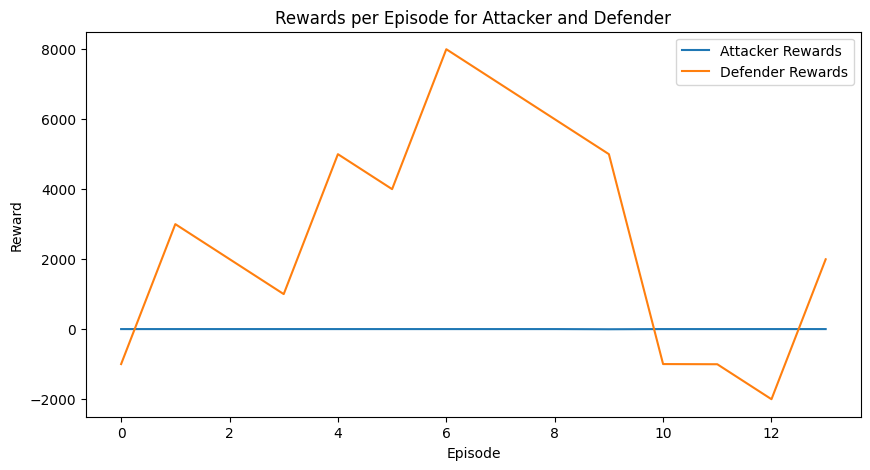

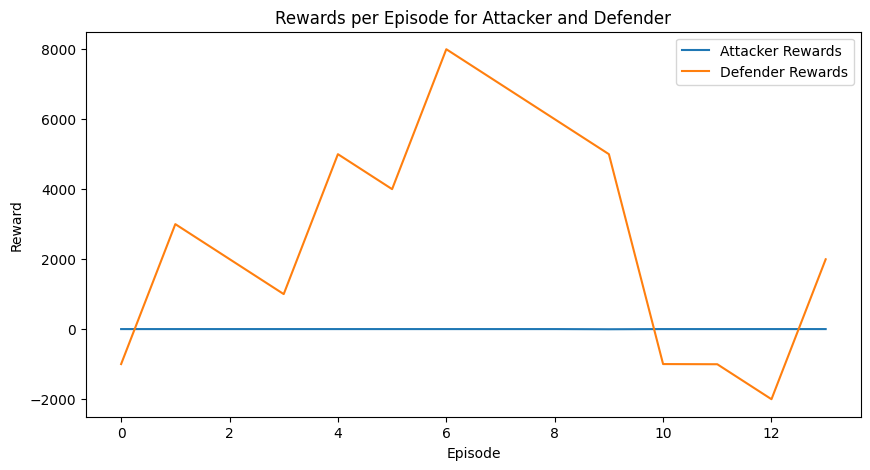

{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Simulation Summary:
Average Attacker Reward: -0.3333333333333333
Average Defender Reward: 2665.0
Average Episode Length: 4.666666666666667 steps
Average Reward Variability: 3902677.7905548215
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Attacker Exploration: 1.00
Attacker Exploitation: 0.00
Defender Exploration: 0.13
Defender Exploitation: 0.87

Action Distributions:
Attacker Actions:
Action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}: 1 times
Defender Actions:
Action {'action_type': 0, 'node_id': 2, 'parameter': 0}: 1 times
Action {'ac

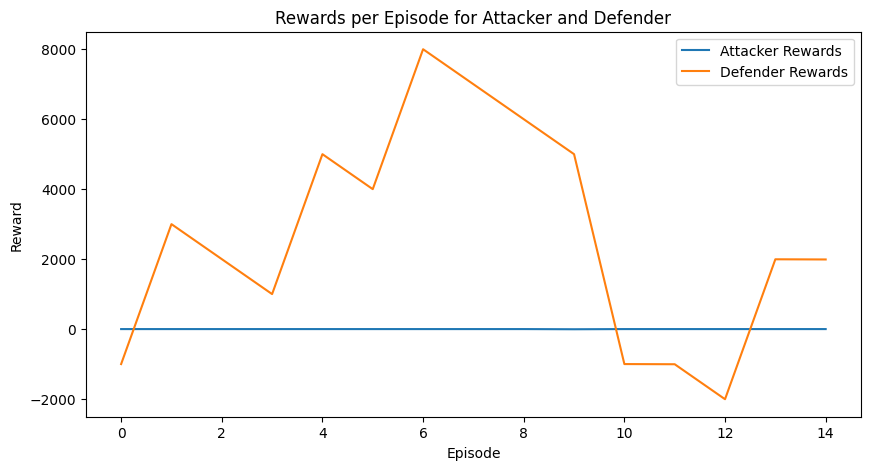

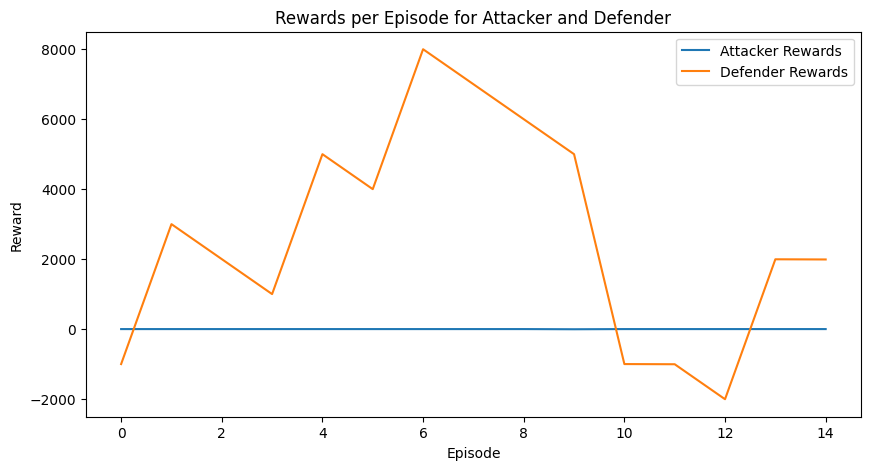

{'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Simulation Summary:
Average Attacker Reward: -0.3125
Average Defender Reward: 2622.5
Average Episode Length: 4.75 steps
Average Reward Variability: 3839420.5414923676
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Attacker Exploration: 1.00
Attacker Exploitation: 0.00
Defender Exploration: 0.19
Defender Exploitation: 0.81

Action Distributions:
Attacker Actions:
Action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}: 1 times
Defender Actions:
Action {'action_type': 0, 'node_id': 2, 'parameter': 0}: 1 times
Action {'action_type': 0, 'node_id':

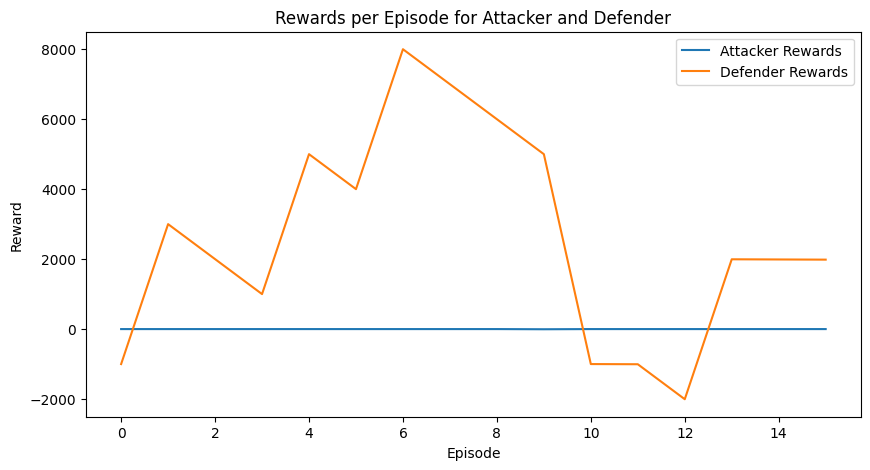

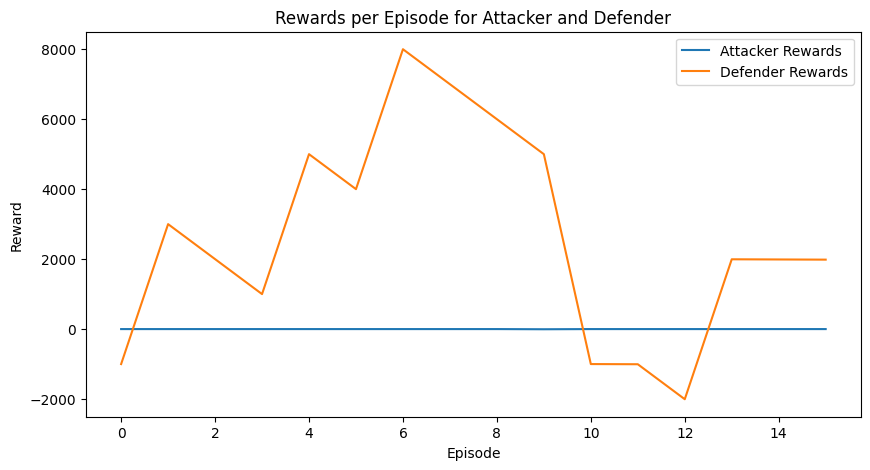

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 0, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
2 0 0
defender reward 4000
defender info {'action': 'allow_traffic', 'status': 'success', 'node_id': 'start', 'port_name': 0, 'performance_metrics': {'actions_taken': 14, 'successful_actions': 5, 'failed_actions': 0, 'unnecessary': 9}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -0.29411764705882354
Average Defender Reward: 2820.294117647059
Average Episode Length: 4.882352941176471 steps
Average Reward Variability: 3856285.719723909
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
At

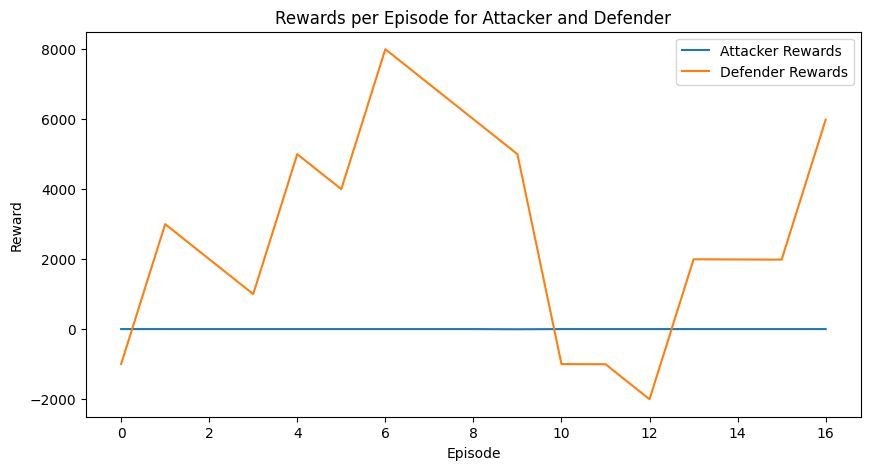

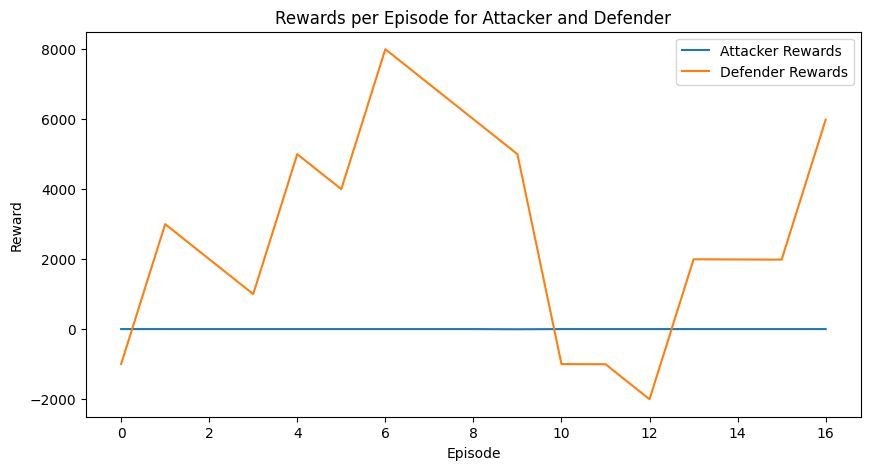

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 1, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 0}
4 1 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 15, 'successful_actions': 5, 'failed_actions': 0, 'unnecessary': 10}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -0.2777777777777778
Average Defender Reward: 2940.5555555555557
Average Episode Length: 5.055555555555555 steps
Average Reward Variability: 3863532.3247045255
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration

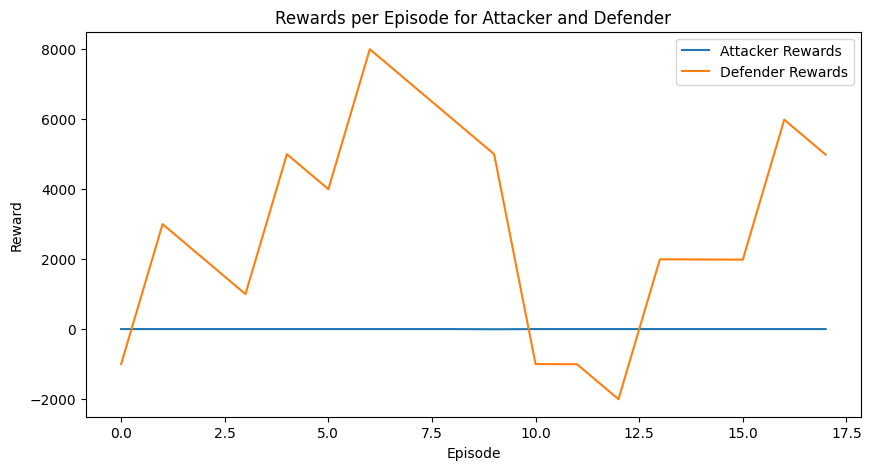

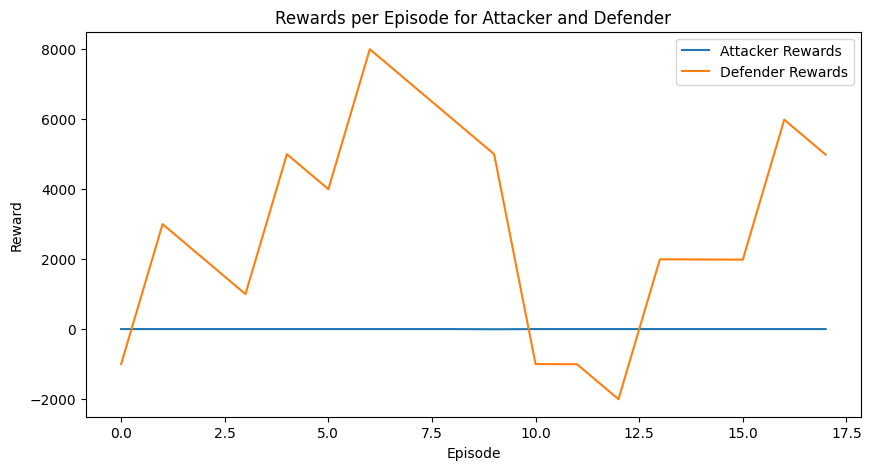

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 13, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 13, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 0}
4 13 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 16, 'successful_actions': 5, 'failed_actions': 0, 'unnecessary': 11}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -0.2631578947368421
Average Defender Reward: 2995.5263157894738
Average Episode Length: 5.2631578947368425 steps
Average Reward Variability: 3860396.737764261
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Explora

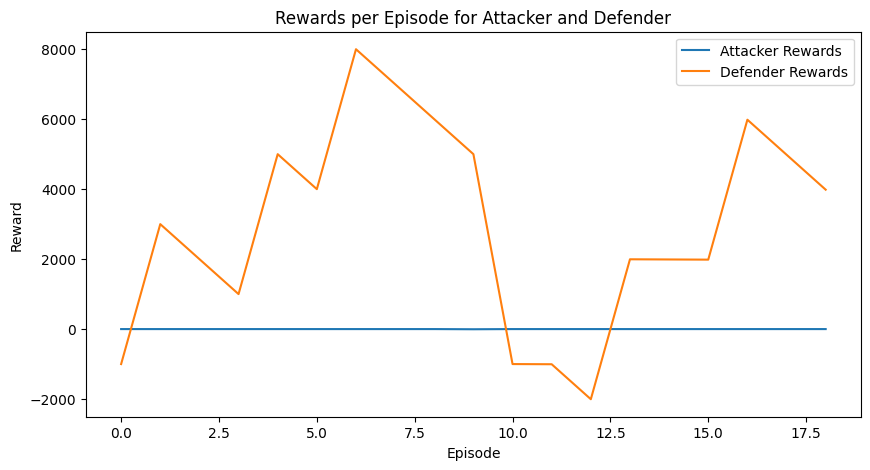

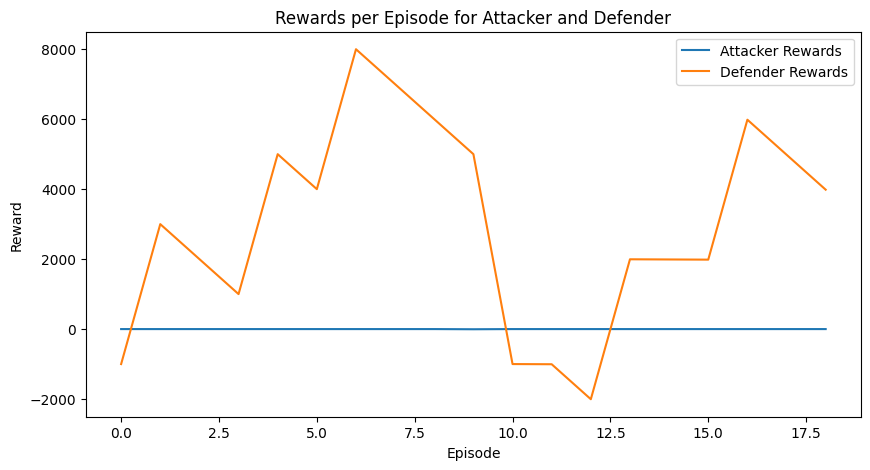

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 6, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 6, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 6, 'parameter': 0}
4 6 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 17, 'successful_actions': 5, 'failed_actions': 0, 'unnecessary': 12}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -0.25
Average Defender Reward: 2995.0
Average Episode Length: 5.5 steps
Average Reward Variability: 3847922.163376048
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Attacker Exploration: 

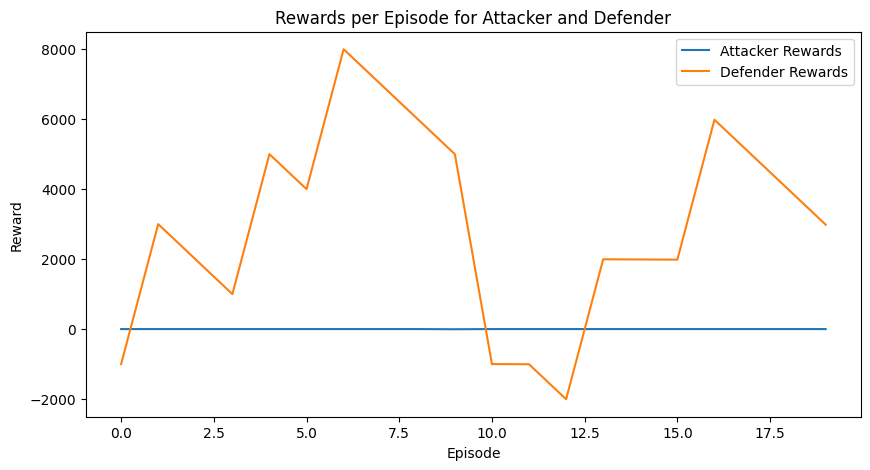

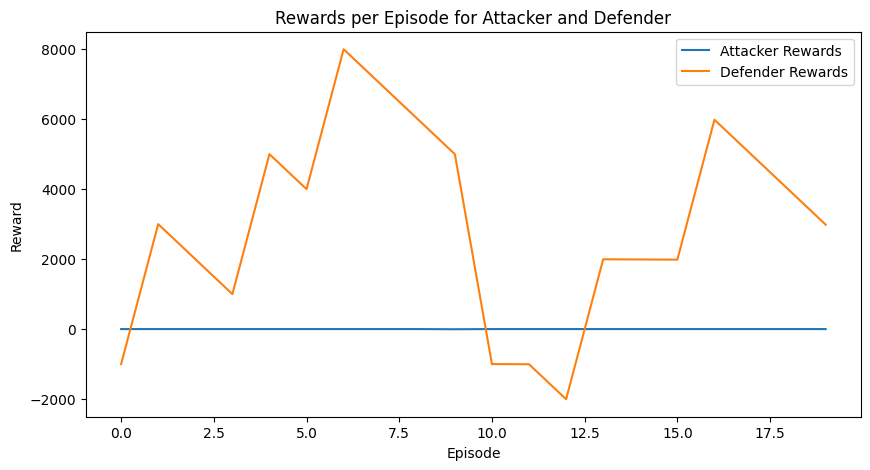

Episode 2: Attacker Reward = 0, Defender Reward = 2985.0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 4, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 18, 'successful_actions': 5, 'failed_actions': 0, 'unnecessary': 13}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -0.23809523809523808
Average Defender Reward: 2804.7619047619046
Average Episode Length: 5.285714285714286 steps
Average Reward Variability: 3664687.7746438556
Average Temporal Difference

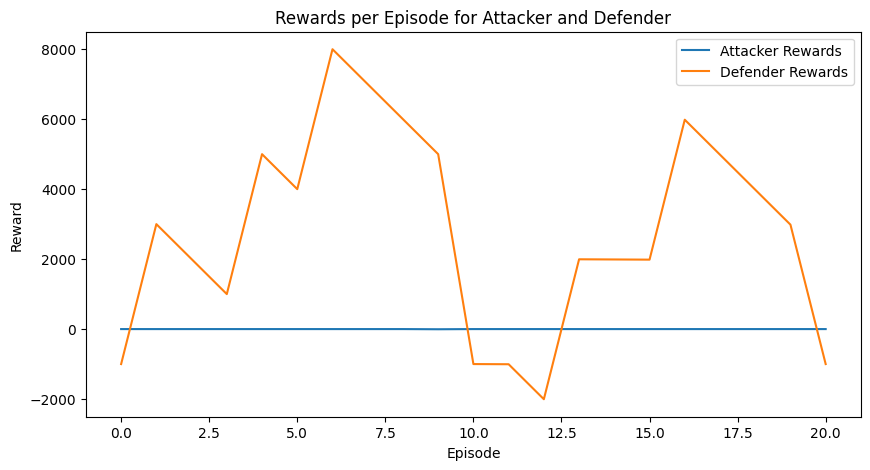

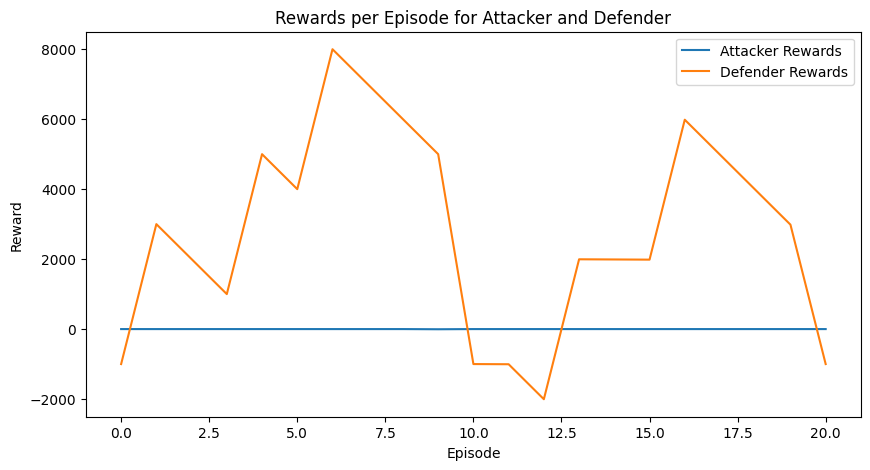

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 2, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 2, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 0}
1 2 0
defender reward 4000
defender info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 19, 'successful_actions': 6, 'failed_actions': 0, 'unnecessary': 13}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -0.22727272727272727
Average Defender Reward: 2813.6363636363635
Average Episode Length: 5.136363636363637 steps
Average Reward Variability: 3782201.9667054983
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploit

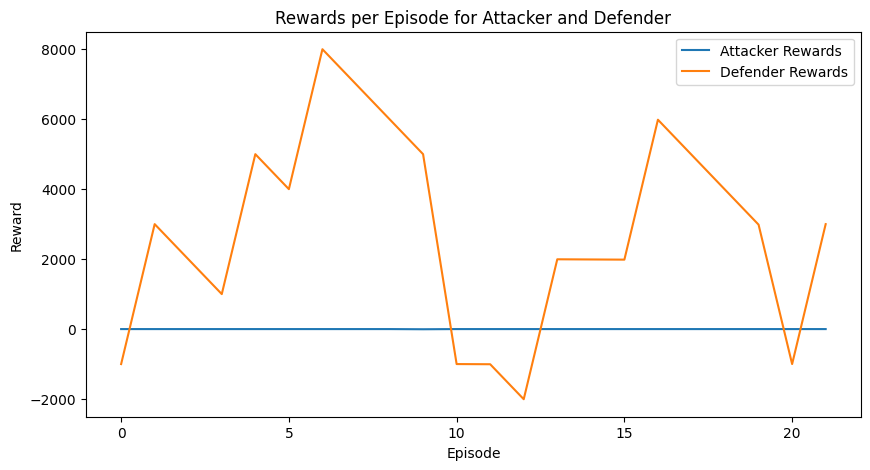

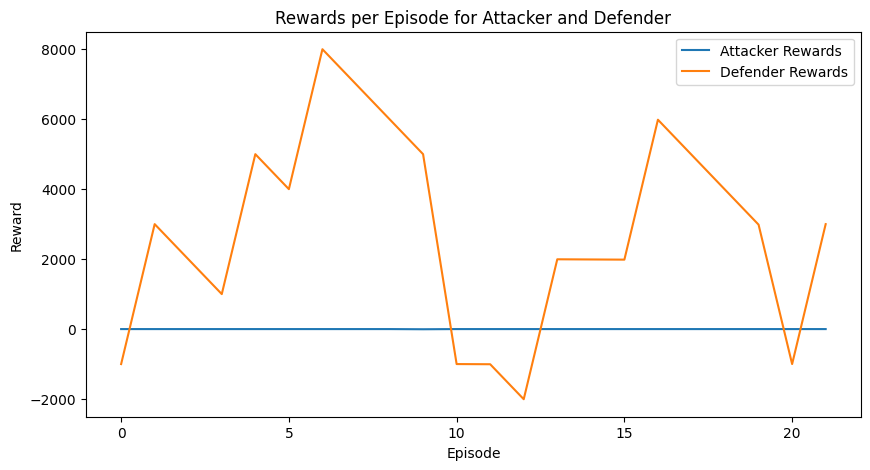

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
{'description': 'CyberBattle simulation', 'duration_in_ms': 701.7519474029541, 'step_count': 3, 'network_availability': 1.0, 'defender_info': {}}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 13, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 13, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 13, 'parameter': 0}
2 13 0
defender reward 4000
defender info {'action': 'allow_traffic', 'status': 'success', 'no

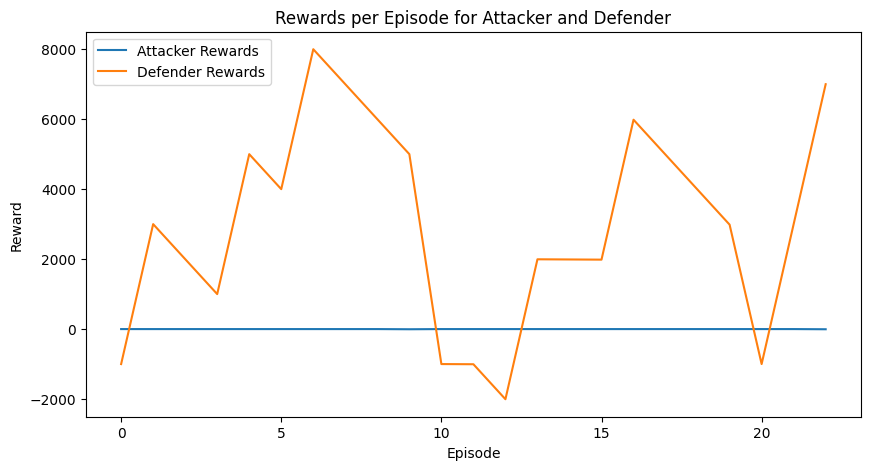

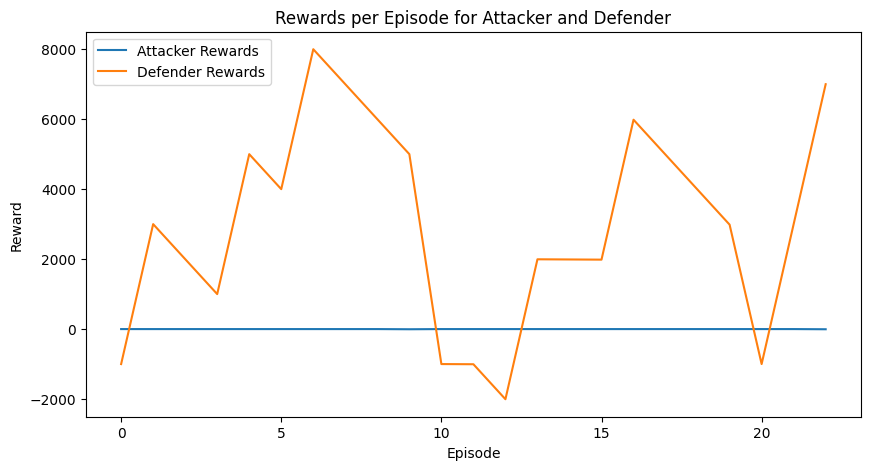

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
{'description': 'CyberBattle simulation', 'duration_in_ms': 990.0796413421631, 'step_count': 5, 'network_availability': 1.0, 'defender_info': {}}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 13, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 13, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 13, 'parameter': 0}
2 13 0
defender reward 4000
defender info {'action': 'allow_traffic', 'status': 'success', 'no

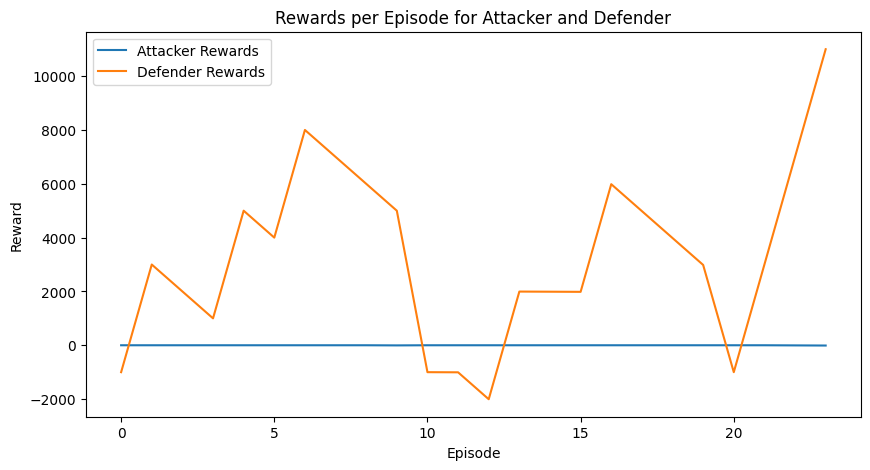

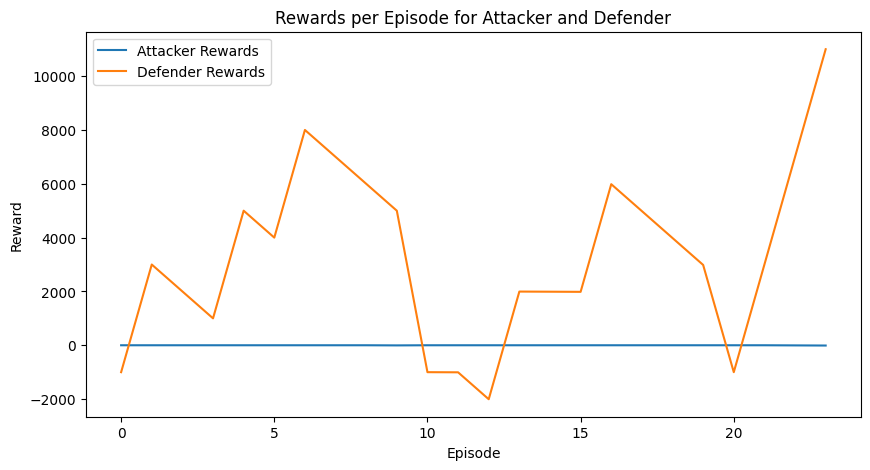

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 5, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 0}
2 5 0
defender reward 4000
defender info {'action': 'allow_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 22, 'successful_actions': 9, 'failed_actions': 0, 'unnecessary': 13}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -1.2
Average Defender Reward: 3796.0
Average Episode Length: 5.0 steps
Average Reward Variability: 3916480.0111713596
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Attacker Exploration: 1.00
Attack

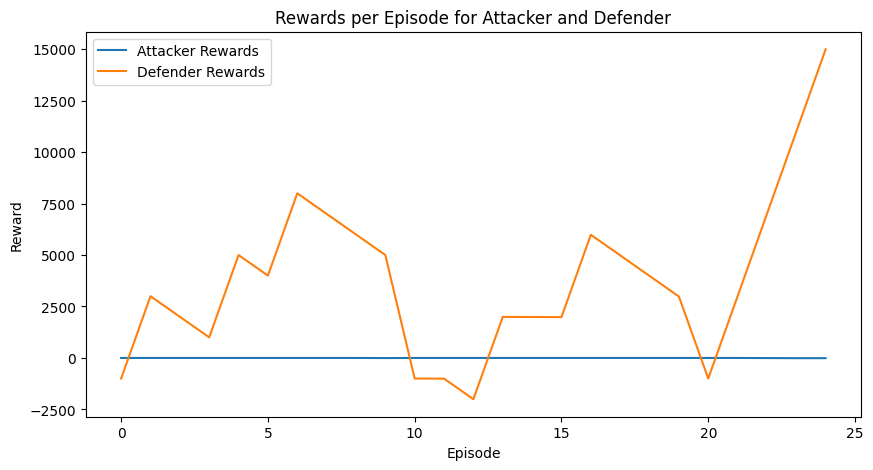

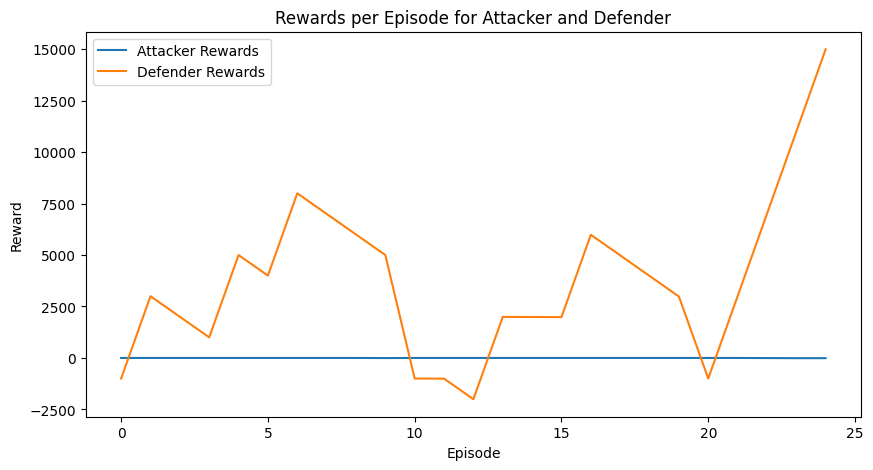

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
{'description': 'CyberBattle simulation', 'duration_in_ms': 1599.7653007507324, 'step_count': 8, 'network_availability': 1.0, 'defender_info': {}}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
Executing defender action {'action_type': 3, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service not runni

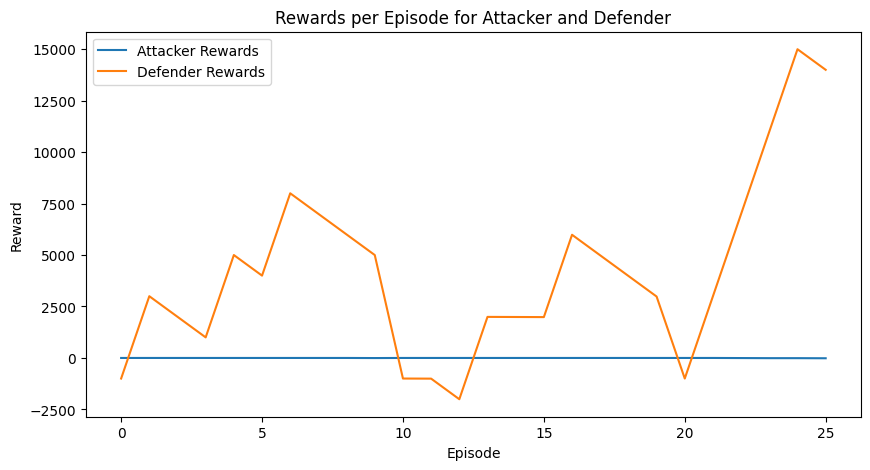

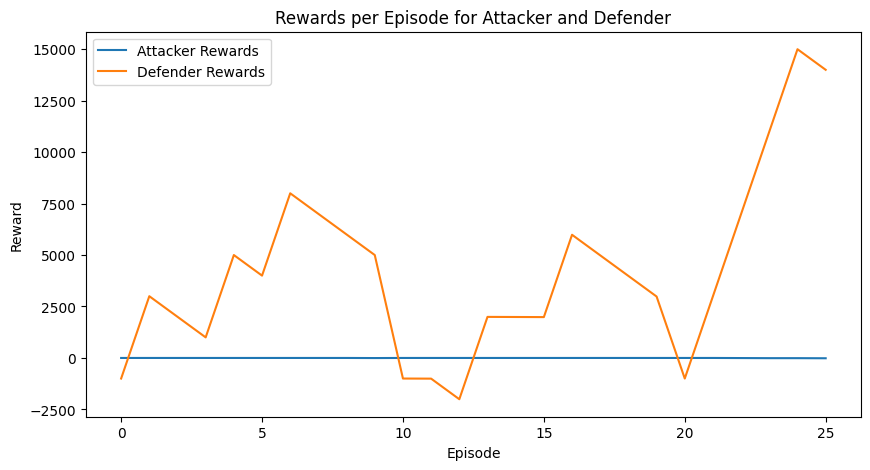

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 0, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 0, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 0}
0 0 0
defender reward 5000
defender info {'action': 'reimage_node', 'status': 'success', 'node_id': 'start', 'performance_metrics': {'actions_taken': 24, 'successful_actions': 10, 'failed_actions': 0, 'unnecessary': 14}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -2.2222222222222223
Average Defender Reward: 4737.037037037037
Average Episode Length: 5.111111111111111 steps
Average Reward Variability: 4012091.7228495665
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration vs. Exploitation:
Attacker Explorat

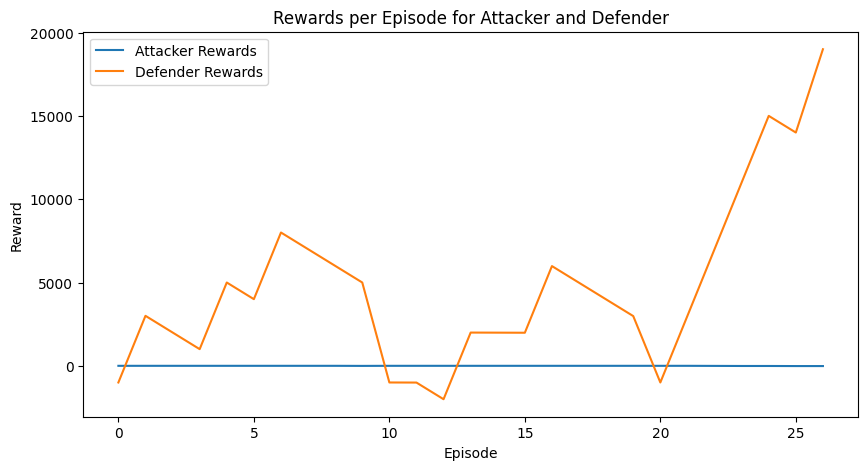

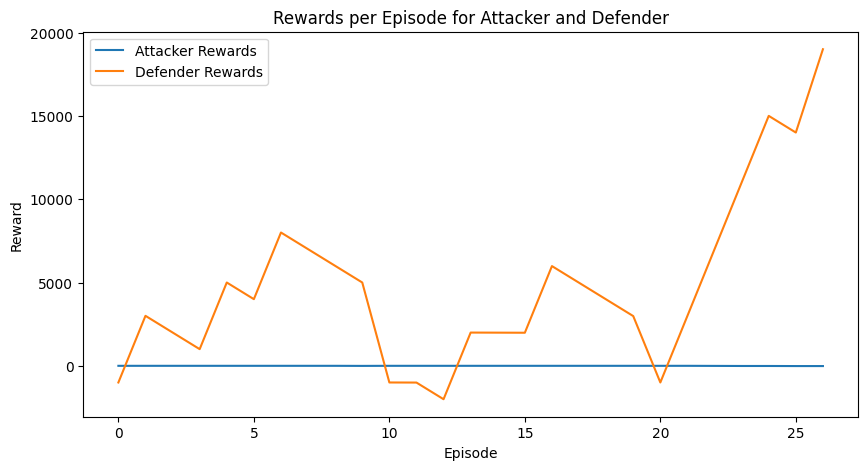

Episode 3: Attacker Reward = -15.0, Defender Reward = 19000
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 0, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
2 0 0
defender reward -5000
defender info {'action': 'allow_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 0, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 25, 'successful_actions': 10, 'failed_actions': 1, 'unnecessary': 14}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -2.142857142857143
Average Defender Reward: 4389.285714285715
Average Episode Length: 4.964285714285714 steps
Average Reward Variability: 3868802.7327477965
Average Temp

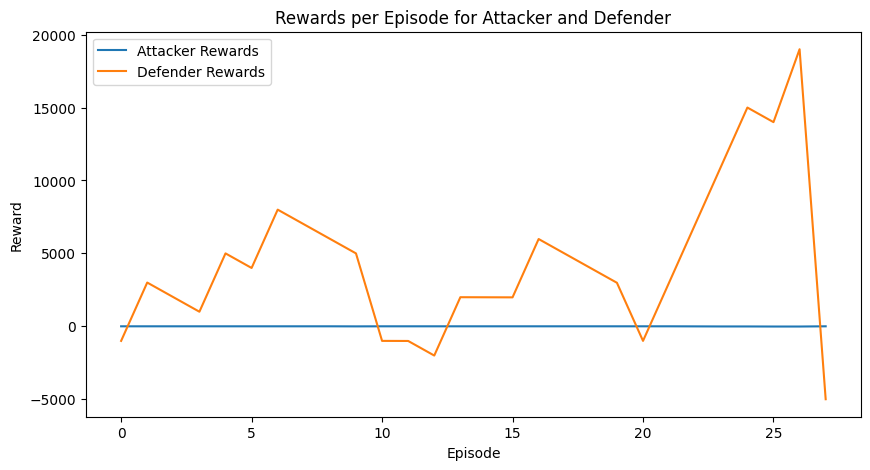

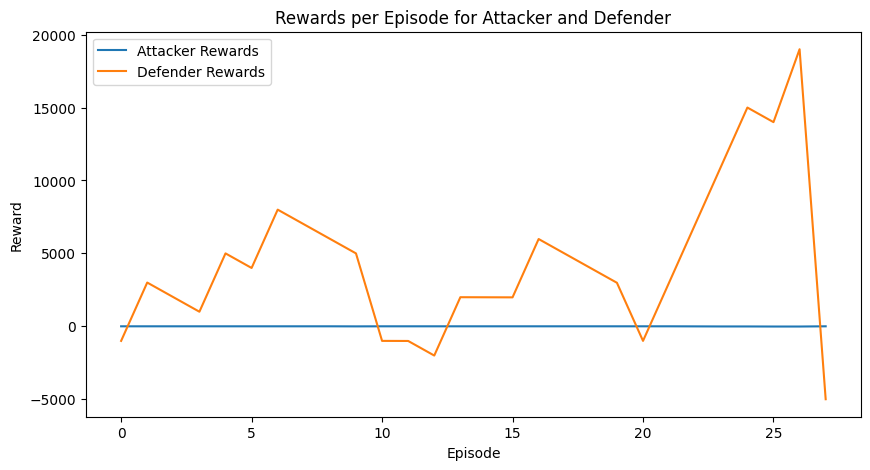

Episode 4: Attacker Reward = 0, Defender Reward = -5000
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 11, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 11, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 11, 'parameter': 0}
0 11 0
defender reward -1000
defender info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '10_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 26, 'successful_actions': 10, 'failed_actions': 1, 'unnecessary': 15}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -2.0689655172413794
Average Defender Reward: 4203.448275862069
Average Episode Length: 4.827586206896552 steps
Average Reward Variability: 3735395.7

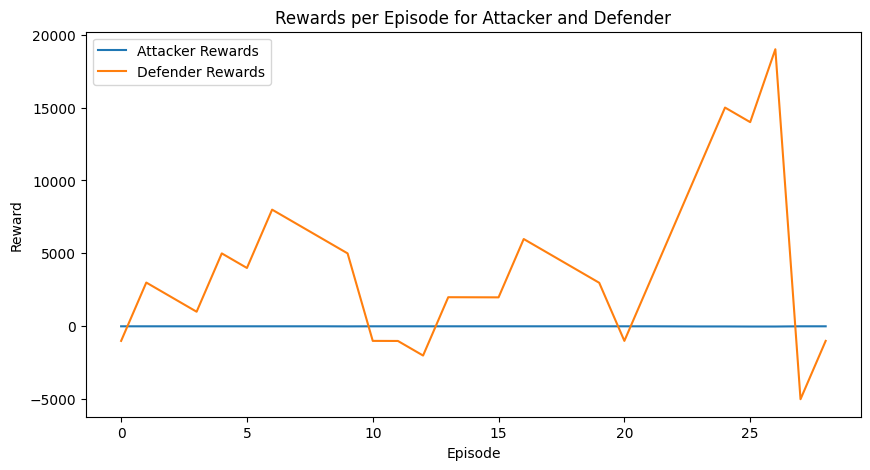

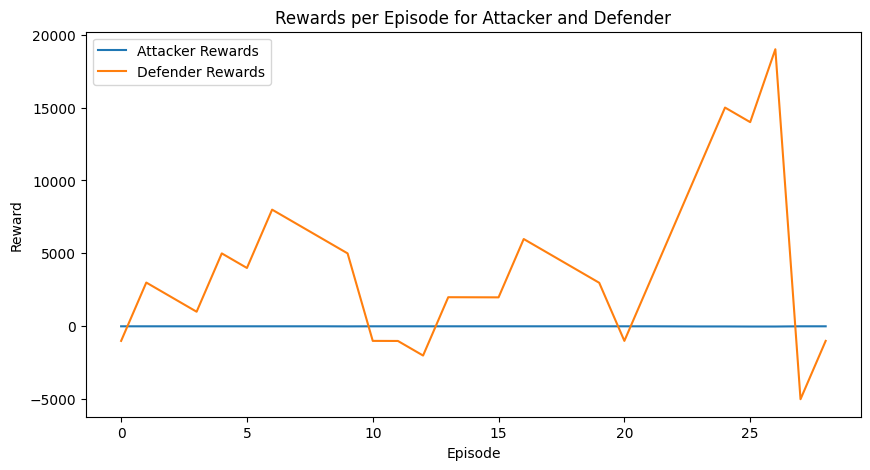

Episode 5: Attacker Reward = 0, Defender Reward = -1000
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
{'description': 'CyberBattle simulation', 'duration_in_ms': 1.8281936645507812, 'step_count': 1, 'network_availability': 1.0, 'defender_info': {}}
{'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Simulation Summary:
Average Attacker Reward: -2.1666666666666665
Average Defend

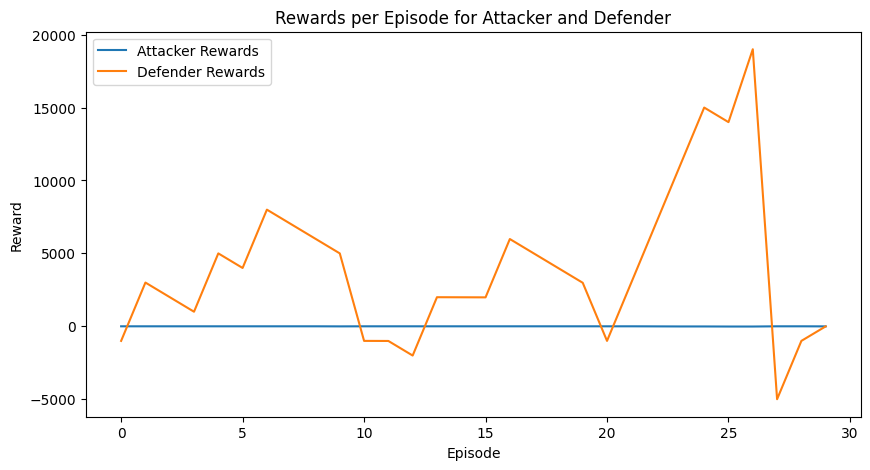

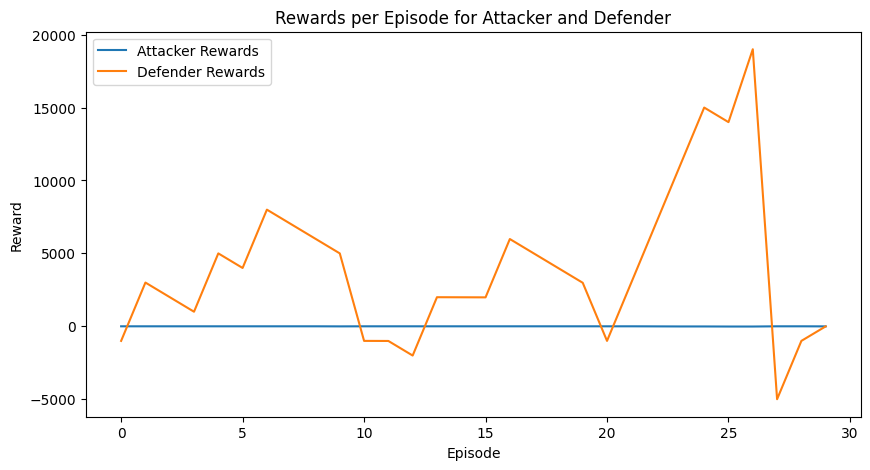

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 8, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 8, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 0}
4 8 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 27, 'successful_actions': 10, 'failed_actions': 1, 'unnecessary': 16}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -2.2580645161290325
Average Defender Reward: 3899.6774193548385
Average Episode Length: 4.612903225806452 steps
Average Reward Variability: 3501499.42169335
Average Temporal Difference: nan
Average Infected Nodes per Episode: nan

Exploration 

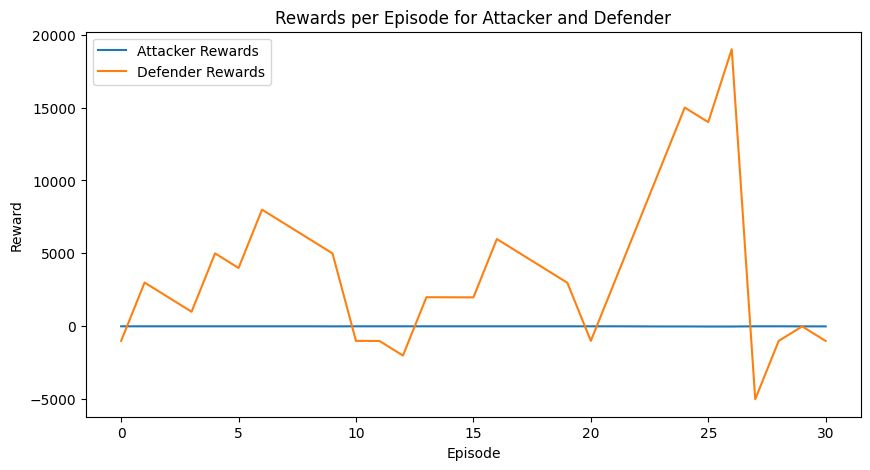

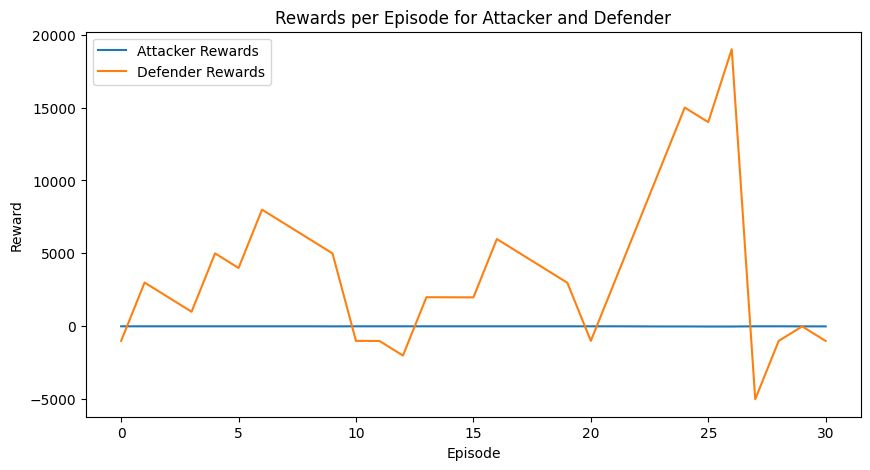

Episode 6: Attacker Reward = -5.0, Defender Reward = -1005.0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 9, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
1 9 0
defender reward 4000
defender info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 28, 'successful_actions': 11, 'failed_actions': 1, 'unnecessary': 16}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -2.1875
Average Defender Reward: 3902.8125
Average Episode Length: 4.5 steps
Average Reward Variability: 3392077.5647654333
Average Temporal Difference: nan
Average Infected Nodes per Episode: 

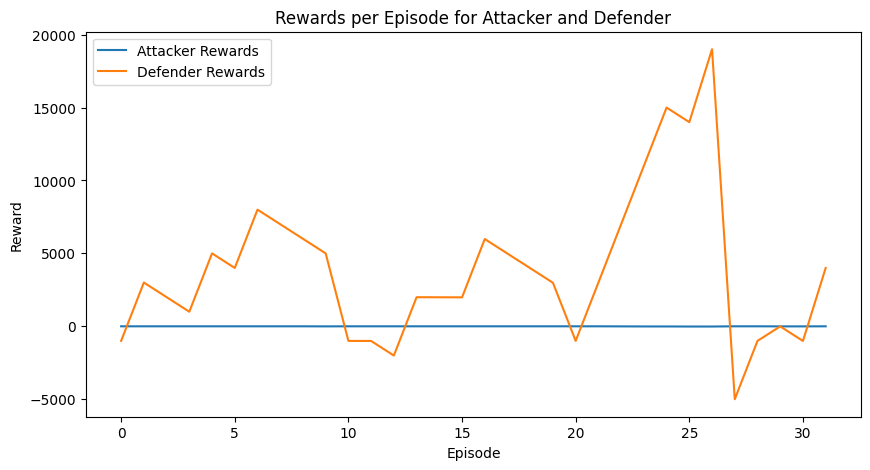

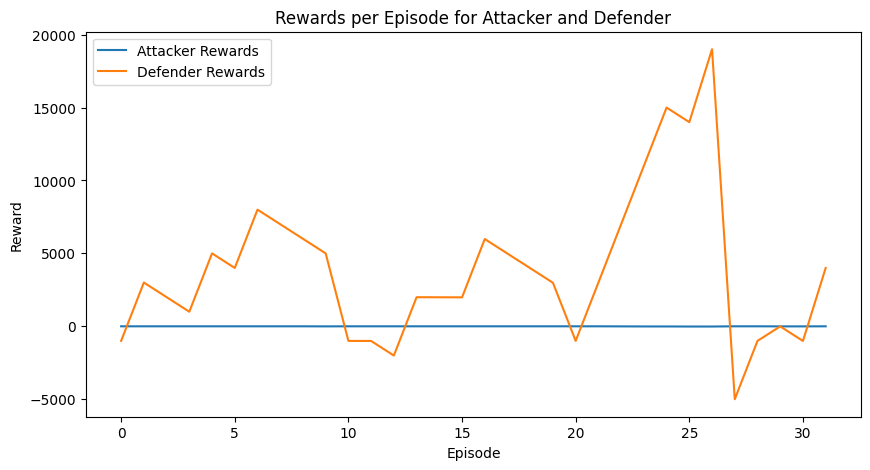

Episode 7: Attacker Reward = 0, Defender Reward = 4000
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 1, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 1, 'parameter': 0}
1 1 0
defender reward 4000
defender info {'action': 'block_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 29, 'successful_actions': 12, 'failed_actions': 1, 'unnecessary': 16}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -2.121212121212121
Average Defender Reward: 3905.757575757576
Average Episode Length: 4.393939393939394 steps
Average Reward Variability: 3289287.335530117
Average Temporal Difference: nan
Average Inf

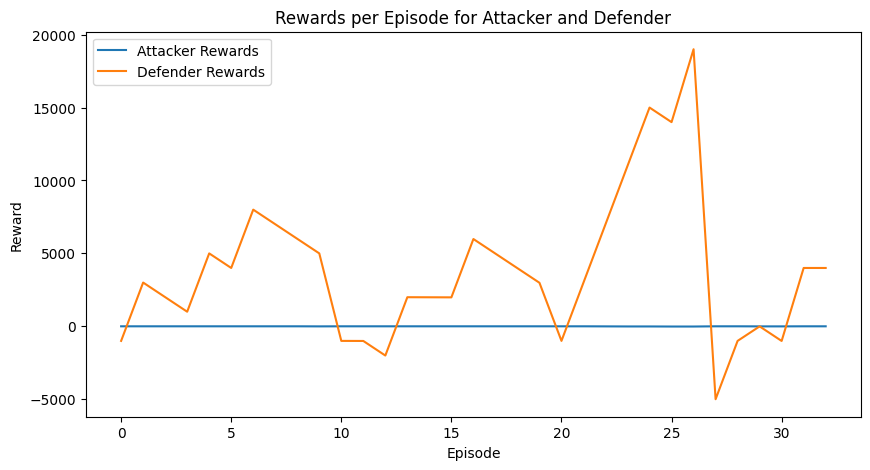

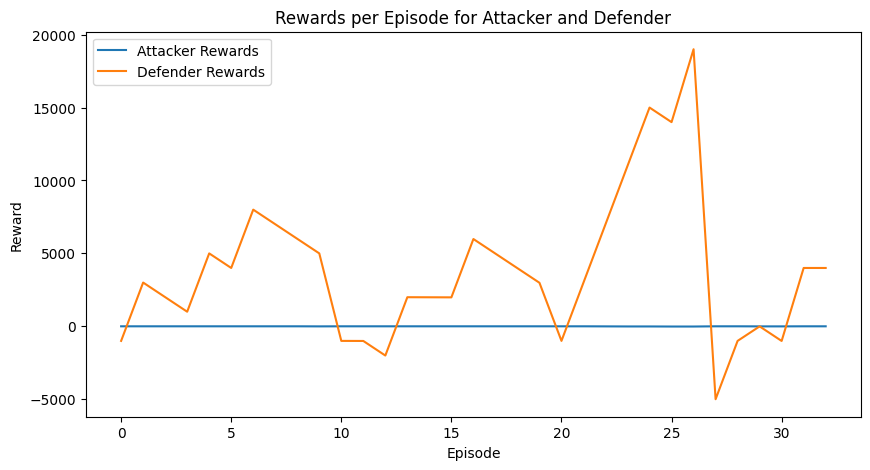

Episode 8: Attacker Reward = 0, Defender Reward = 4000
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 5, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 5, 'parameter': 0}
1 5 0
defender reward 4000
defender info {'action': 'block_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 30, 'successful_actions': 13, 'failed_actions': 1, 'unnecessary': 16}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -2.0588235294117645
Average Defender Reward: 3908.529411764706
Average Episode Length: 4.294117647058823 steps
Average Reward Variability: 3192543.5903674667
Average Temporal Difference: nan
Average 

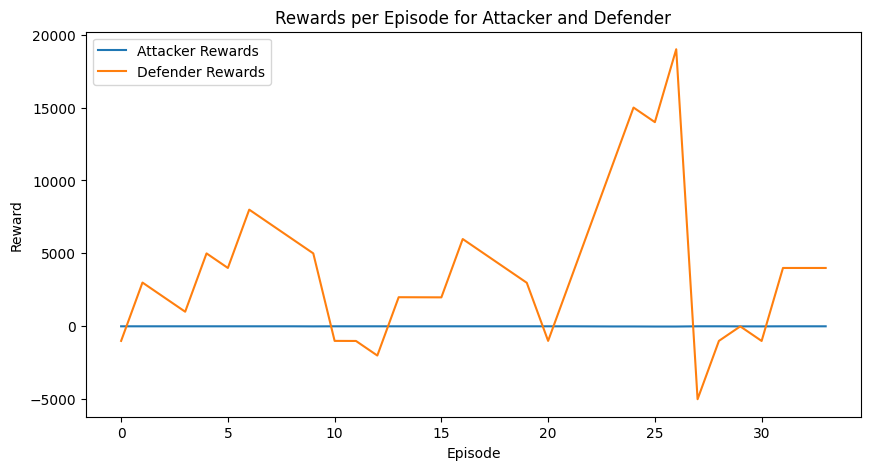

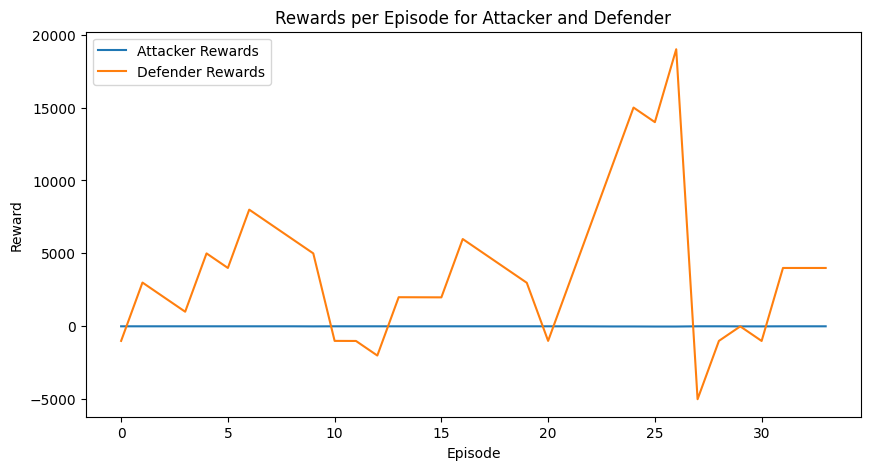

Episode 9: Attacker Reward = 0, Defender Reward = 4000
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 7, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 7, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 0}
4 7 0
defender reward -1000
defender info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 31, 'successful_actions': 13, 'failed_actions': 1, 'unnecessary': 17}, 'network_availability': 1.0}
Simulation Summary:
Average Attacker Reward: -2.0
Average Defender Reward: 3768.285714285714
Average Episode Length: 4.2 steps
Average Reward Variability: 3101328.0592141105
Average Temporal Difference: nan
Average Infected Nodes per

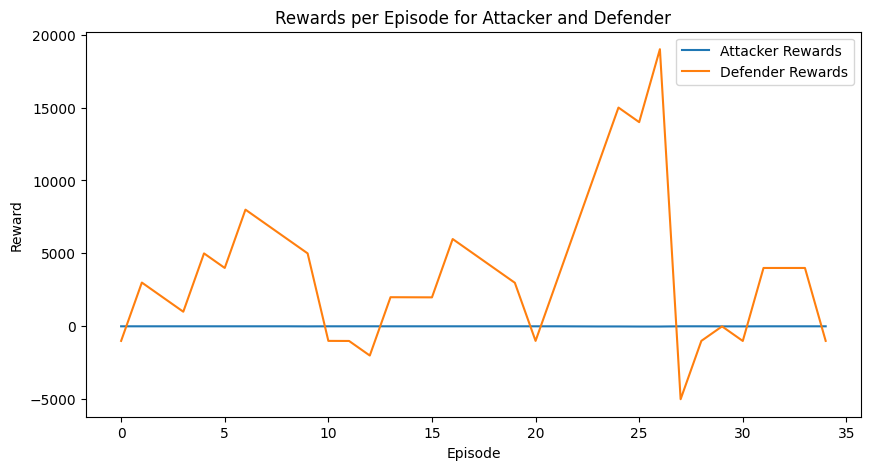

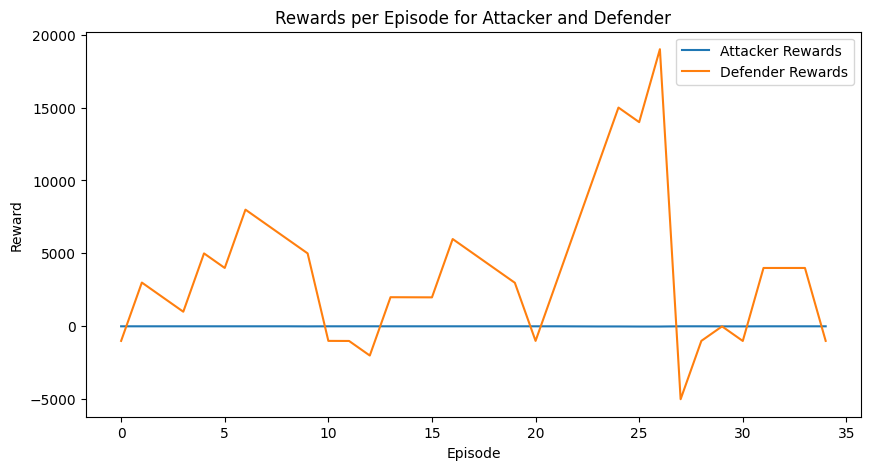

Episode 10: Attacker Reward = 0, Defender Reward = -1000


In [23]:
import numpy as np
import matplotlib.pyplot as plt
random.seed(120394016)
number_of_episodes = 10
max_steps_per_episode = 10
attacker_epsilon = 0.1
defender_epsilon = 0.1

attacker_rewards_per_episode = []
defender_rewards_per_episode = []
win_rates = {'attacker': [], 'defender': []}
actions_taken_count = {'attacker': [], 'defender': []}
exploration_vs_exploitation = {'exploration': [], 'exploitation': []}
episode_lengths = []
state_visitation_frequencies = {}  
reward_variability = []
defender_successful_actions = []
defender_failed_actions = []
defender_actions_taken = []
tracker = SimulationTracker() 
wrapped_env = wrap_environment(gym_environment)
win_counts = {'attacker': 0, 'defender': 0}
random.seed(120394016)
for episode in range(number_of_episodes):
    observation = wrapped_env.reset()
    attacker_total_reward = 0
    defender_total_reward = 0
    steps_this_episode=0
    episode_rewards = []  #track rewards for this episode
    for step in range(max_steps_per_episode):
        steps_this_episode +=1
        #attacker's Turn
        exploration = np.random.random() < attacker_epsilon
        if exploration:
            _, attacker_action, _ = attacker_learner.explore(wrapped_env)
        else:
            _, attacker_action, _ = attacker_learner.exploit(wrapped_env, observation)
        #print(attacker_action)
        if attacker_action is not None:
            observation, attacker_reward, done, _ = gym_environment.step(attacker_action)
            attacker_total_reward += attacker_reward
            print(_)
            actions_taken_count['attacker'].append(attacker_action)  #track action
            episode_rewards.append(attacker_reward)  #track reward variability
            tracker.log_action('attacker', attacker_action, exploration)
            #actions_taken_count['attacker'][attacker_action] = actions_taken_count['attacker'].get(attacker_action, 0) + 1


        #defender's turn
        exploration = np.random.random() < defender_epsilon
        if exploration:
            _, defender_action, _ = defender_learner.explore(wrapped_env)
        else:
            _, defender_action, _ = defender_learner.exploit(wrapped_env, observation)

        if defender_action is not None:
            observation, defender_reward, done, _ = gym_environment.step(defender_action)
            #action= _['defender_info']['action']
            defender_total_reward += defender_reward
            actions_taken_count['defender'].append(defender_action)  # Track action
            episode_rewards.append(defender_reward)  # Track reward variability
            tracker.log_action('defender', defender_action, exploration)
            #actions_taken_count['defender'][defender_action] = actions_taken_count['defender'].get(defender_action, 0) + 1
        #logging
        # After each episode
        tracker.log_episode(attacker_total_reward, defender_total_reward, steps_this_episode, episode_rewards)
        tracker.print_summary()
        tracker._plot_rewards()

        if done:
            break
            
    defender_info = _['defender_info']  
    if defender_info:  
        defender_actions_taken.append(defender_info['performance_metrics']['actions_taken'])
        defender_successful_actions.append(defender_info['performance_metrics']['successful_actions'])
        defender_failed_actions.append(defender_info['performance_metrics']['failed_actions'])

    attacker_rewards_per_episode.append(attacker_total_reward)
    defender_rewards_per_episode.append(defender_total_reward)
    episode_lengths.append(steps_this_episode)
    reward_variability.append(np.var(episode_rewards))
    print(f"Episode {episode + 1}: Attacker Reward = {attacker_total_reward}, Defender Reward = {defender_total_reward}")

wrapped_env.close()

Cumulative Rewards Over Episodes

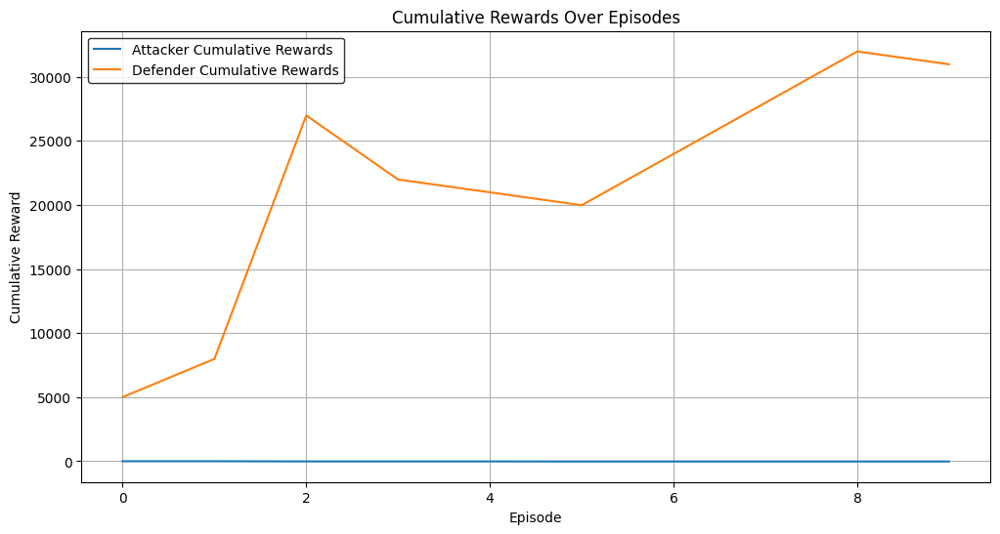

In [24]:
cumulative_attacker_rewards = np.cumsum(attacker_rewards_per_episode)
cumulative_defender_rewards = np.cumsum(defender_rewards_per_episode)

plt.figure(figsize=(12, 6))
plt.plot(cumulative_attacker_rewards, label='Attacker Cumulative Rewards')
plt.plot(cumulative_defender_rewards, label='Defender Cumulative Rewards')
plt.title('Cumulative Rewards Over Episodes')
plt.xlabel('Episode')
plt.ylabel('Cumulative Reward')
plt.legend(frameon=True, facecolor='white', edgecolor='black')
plt.grid(True)
plt.show()


In [25]:
defender_rewards_per_episode

[5000, 2985.0, 19000, -5000, -1000, -1005.0, 4000, 4000, 4000, -1000]

In [26]:
pip install matplotlib seaborn

Note: you may need to restart the kernel to use updated packages.


<Figure size 1400x700 with 0 Axes>

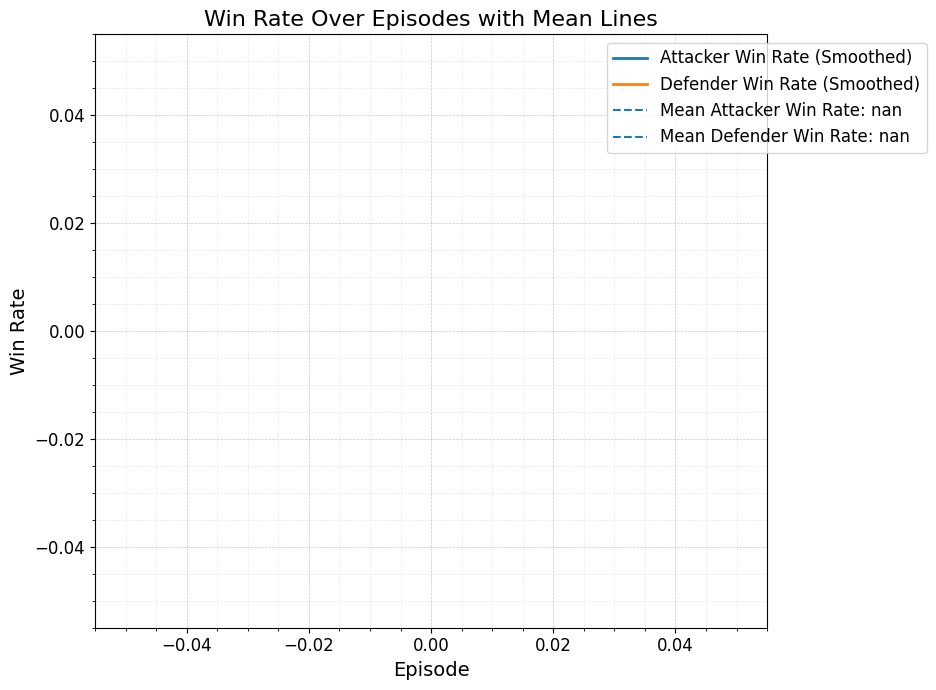

In [27]:


def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points


attacker_win_rate_smoothed = smooth_curve(win_rates['attacker'])
defender_win_rate_smoothed = smooth_curve(win_rates['defender'])

plt.figure(figsize=(14, 7))

#plt.style.use('seaborn-darkgrid')
#palette = plt.get_cmap('Set1')

mean_attacker_win_rate = np.mean(attacker_win_rate_smoothed)
mean_defender_win_rate = np.mean(defender_win_rate_smoothed)

plt.figure(figsize=(14, 7))
#plt.style.use('seaborn-darkgrid')
#palette = plt.get_cmap('Set1')

plt.plot(attacker_win_rate_smoothed, label='Attacker Win Rate (Smoothed)', linewidth=2)
plt.plot(defender_win_rate_smoothed, label='Defender Win Rate (Smoothed)', linewidth=2)

plt.axhline(y=mean_attacker_win_rate, linestyle='--', linewidth=1.5, label=f'Mean Attacker Win Rate: {mean_attacker_win_rate:.2f}')
plt.axhline(y=mean_defender_win_rate, linestyle='--', linewidth=1.5, label=f'Mean Defender Win Rate: {mean_defender_win_rate:.2f}')

plt.title('Win Rate Over Episodes with Mean Lines', fontsize=16)
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Win Rate', fontsize=14)
plt.legend(loc='upper right', fontsize=12, bbox_to_anchor=(1.25, 1))
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.grid(True, which='major', linestyle='--', linewidth=0.5, alpha=0.7)
plt.minorticks_on()
plt.grid(True, which='minor', linestyle=':', linewidth=0.5, alpha=0.5)

plt.text(0, mean_attacker_win_rate + 0.02, f"Mean Attacker: {mean_attacker_win_rate:.2f}", fontsize=10)
plt.text(0, mean_defender_win_rate + 0.02, f"Mean Defender: {mean_defender_win_rate:.2f}", fontsize=10)

plt.tight_layout(rect=[0, 0, 0.75, 1]) 
plt.show()

In [28]:
pip install --upgrade matplotlib


Note: you may need to restart the kernel to use updated packages.


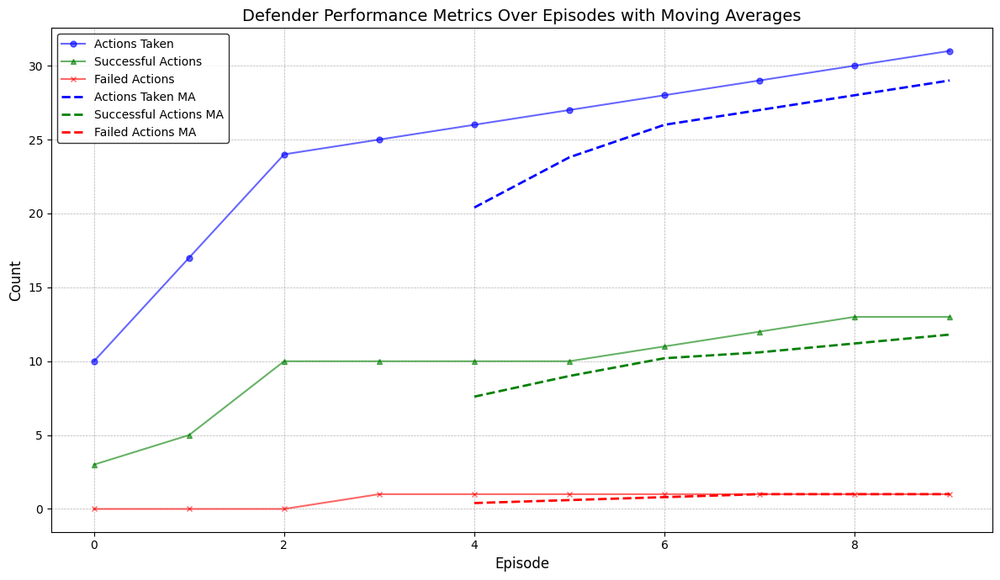

In [29]:
plt.figure(figsize=(12, 7))

#moving averages
window_size = 5
defender_actions_taken_ma = np.convolve(defender_actions_taken, np.ones(window_size) / window_size, 'valid')
defender_successful_actions_ma = np.convolve(defender_successful_actions, np.ones(window_size) / window_size, 'valid')
defender_failed_actions_ma = np.convolve(defender_failed_actions, np.ones(window_size) / window_size, 'valid')

plt.plot(defender_actions_taken, 'o-', color='blue', alpha=0.6, label='Actions Taken', markersize=5)
plt.plot(defender_successful_actions, '^-', color='green', alpha=0.6, label='Successful Actions', markersize=5)
plt.plot(defender_failed_actions, 'x-', color='red', alpha=0.6, label='Failed Actions', markersize=5)

#moving averages
plt.plot(np.arange(window_size - 1, len(defender_actions_taken_ma) + window_size - 1), defender_actions_taken_ma,
         color='blue', linestyle='--', linewidth=2, label='Actions Taken MA')
plt.plot(np.arange(window_size - 1, len(defender_successful_actions_ma) + window_size - 1), defender_successful_actions_ma,
         color='green', linestyle='--', linewidth=2, label='Successful Actions MA')
plt.plot(np.arange(window_size - 1, len(defender_failed_actions_ma) + window_size - 1), defender_failed_actions_ma,
         color='red', linestyle='--', linewidth=2, label='Failed Actions MA')

plt.title('Defender Performance Metrics Over Episodes with Moving Averages', fontsize=14)
plt.xlabel('Episode', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(frameon=True, facecolor='white', edgecolor='black',loc='upper left')

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()

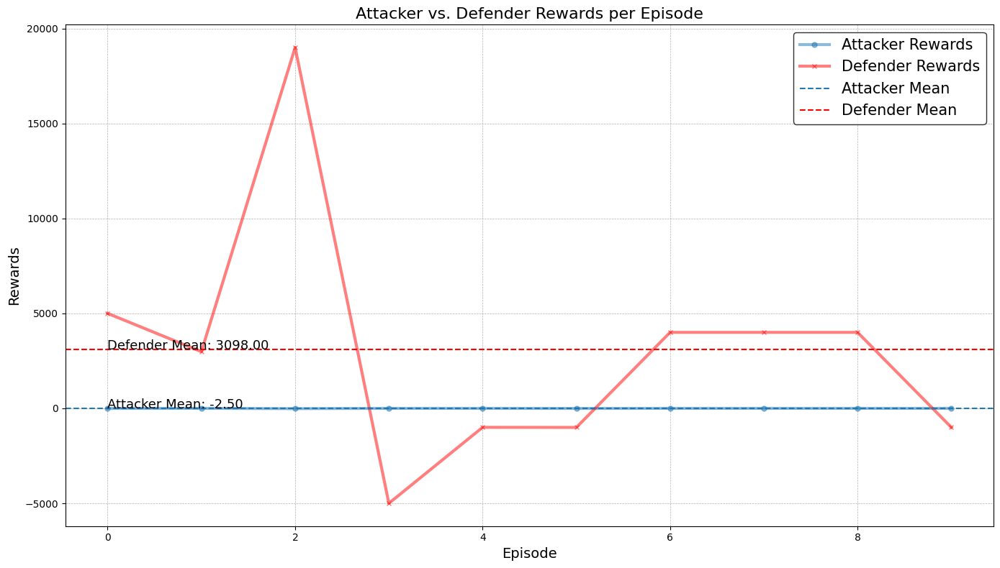

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
#function to calculate moving averages and confidence intervals
def moving_average_and_ci(data, window_size):
    ma = np.convolve(data, np.ones(window_size) / window_size, mode='valid')
    ci = 1.96 * stats.sem(data)  # Assuming a normal distribution for simplicity
    return ma, ci

window_size = 3
attacker_ma, attacker_ci = moving_average_and_ci(attacker_rewards_per_episode, window_size)
defender_ma, defender_ci = moving_average_and_ci(defender_rewards_per_episode, window_size)

plt.figure(figsize=(14, 8))

#original rewards with semi-transparent markers for visibility
plt.plot(attacker_rewards_per_episode, 'o-', color='#1f77b4', alpha=0.5, label='Attacker Rewards', markersize=5,linewidth=3)
plt.plot(defender_rewards_per_episode, 'x-', color='red', alpha=0.5, label='Defender Rewards', markersize=5,linewidth=3)

#moving averages with solid lines for trend visualization
#plt.plot(np.arange(window_size - 1, len(attacker_ma) + window_size - 1), attacker_ma, color='#1f77b4', linewidth=2, label='Attacker MA')
#plt.plot(np.arange(window_size - 1, len(defender_ma) + window_size - 1), defender_ma, color='red', linewidth=2, label='Defender MA')

#confidence intervals as shaded areas around the moving averages
#plt.fill_between(np.arange(window_size - 1, len(attacker_ma) + window_size - 1), (attacker_ma - attacker_ci), (attacker_ma + attacker_ci), color='#1f77b4', alpha=0.2, label='Attacker CI')
#plt.fill_between(np.arange(window_size - 1, len(defender_ma) + window_size - 1), (defender_ma - defender_ci), (defender_ma + defender_ci), color='red', alpha=0.2, label='Defender CI')

#mean lines for overall performance indicator
plt.axhline(np.mean(attacker_rewards_per_episode), color='#1f77b4', linestyle='--', label='Attacker Mean')
plt.axhline(np.mean(defender_rewards_per_episode), color='red', linestyle='--', label='Defender Mean')

plt.text(0, np.mean(attacker_rewards_per_episode) + 5, f'Attacker Mean: {np.mean(attacker_rewards_per_episode):.2f}', color='black', fontsize=13)
plt.text(0, np.mean(defender_rewards_per_episode) + 5, f'Defender Mean: {np.mean(defender_rewards_per_episode):.2f}', color='black', fontsize=13)

plt.title('Attacker vs. Defender Rewards per Episode', fontsize=16)
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Rewards', fontsize=14)
plt.legend(loc='upper right', fontsize=15,frameon=True, facecolor='white', edgecolor='black')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()

In [31]:
attacker_rewards_per_episode

[-5.0, 0, -15.0, 0, 0, -5.0, 0, 0, 0, 0]

In [32]:
defender_rewards_per_episode

[5000, 2985.0, 19000, -5000, -1000, -1005.0, 4000, 4000, 4000, -1000]

In [33]:
actions_taken_count

{'attacker': [{'remote_vulnerability': array([0, 0, 0], dtype=int32)},
  {'remote_vulnerability': array([0, 0, 0], dtype=int32)},
  {'remote_vulnerability': array([0, 0, 0], dtype=int32)},
  {'remote_vulnerability': array([0, 0, 0], dtype=int32)},
  {'remote_vulnerability': array([0, 0, 1], dtype=int32)}],
 'defender': [{'action_type': 0, 'node_id': 5, 'parameter': 0},
  {'action_type': 1, 'node_id': 9, 'parameter': 0},
  {'action_type': 4, 'node_id': 4, 'parameter': 0},
  {'action_type': 3, 'node_id': 1, 'parameter': 0},
  {'action_type': 1, 'node_id': 4, 'parameter': 0},
  {'action_type': 4, 'node_id': 2, 'parameter': 0},
  {'action_type': 2, 'node_id': 1, 'parameter': 0},
  {'action_type': 0, 'node_id': 9, 'parameter': 0},
  {'action_type': 4, 'node_id': 4, 'parameter': 0},
  {'action_type': 4, 'node_id': 11, 'parameter': 0},
  {'action_type': 0, 'node_id': 2, 'parameter': 0},
  {'remote_vulnerability': array([0, 0, 0], dtype=int32)},
  {'action_type': 4, 'node_id': 5, 'parameter': 

# Untrained Defender

In [34]:
import gym

gym_env = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    )
)

defender_name = "DefenderName" 
defender_agent = UntrainedDefenderWrapper(gym_env,defender_name)

gym_environment = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    ),
    defender_agent=defender_agent
)



Generated nodes:
[('start', {'data': NodeInfo(services=[], vulnerabilities={'ScanExplorerRecentFiles': VulnerabilityInfo(description='Scan Windows Explorer recent files for possible references to other machines', type=<VulnerabilityType.LOCAL: 1>, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f17cdbcb0d0>, precondition=<cyberbattle.simulation.model.Precondition object at 0x7f185f375880>, rates=Rates(probingDetectionRate=0.0, exploitDetectionRate=0.0, successRate=1.0), URL='', cost=1.0, reward_string='Found a reference to a remote Linux node in bash history')}, value=0, properties=[], firewall=FirewallConfiguration(outgoing=[FirewallRule(port='RDP', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='SSH', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTPS', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTP', permission=<RulePermission.ALLOW: 0>, reason='')], incoming=[FirewallRule(port='RDP', permis

In [35]:
defender_learner=defender_agent

Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 3, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 3, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 1, 'node_id': 3, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 10_WindowsNode (Numerical ID: 11) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype

/home/gmod1/miniconda3/envs/cybersim/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/gmod1/miniconda3/envs/cybersim/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


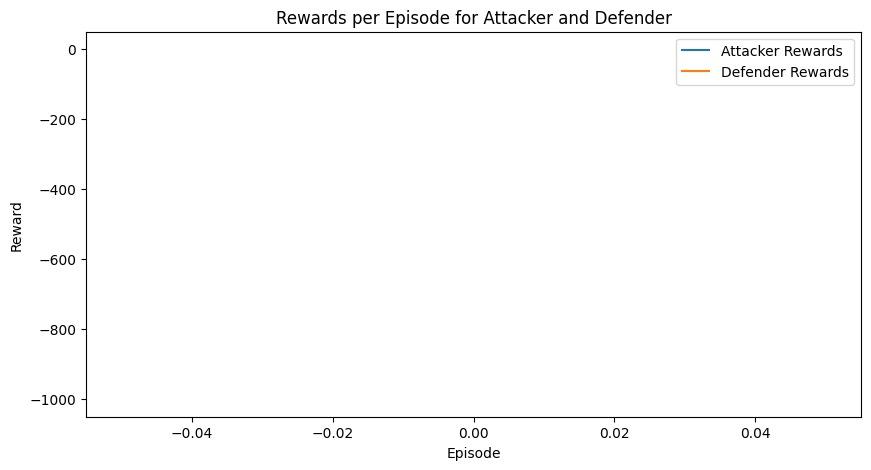

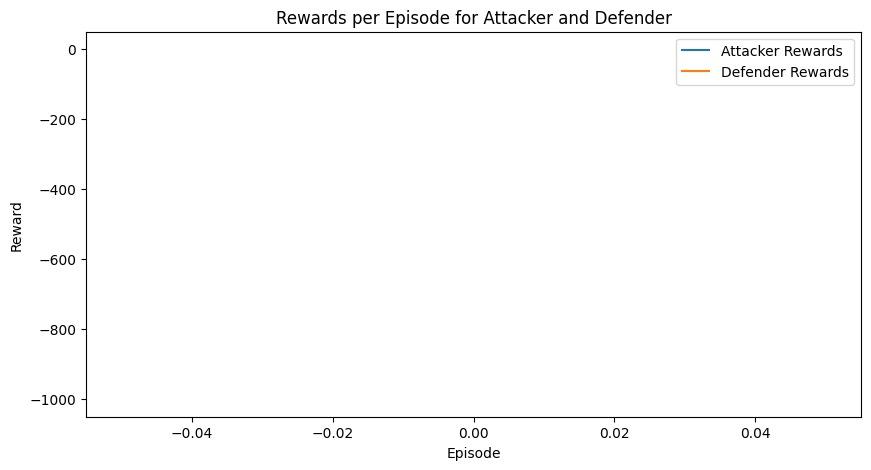

Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 13, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 13, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 4, 'node_id': 13, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 4_WindowsNode (Numerical ID: 5) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtyp

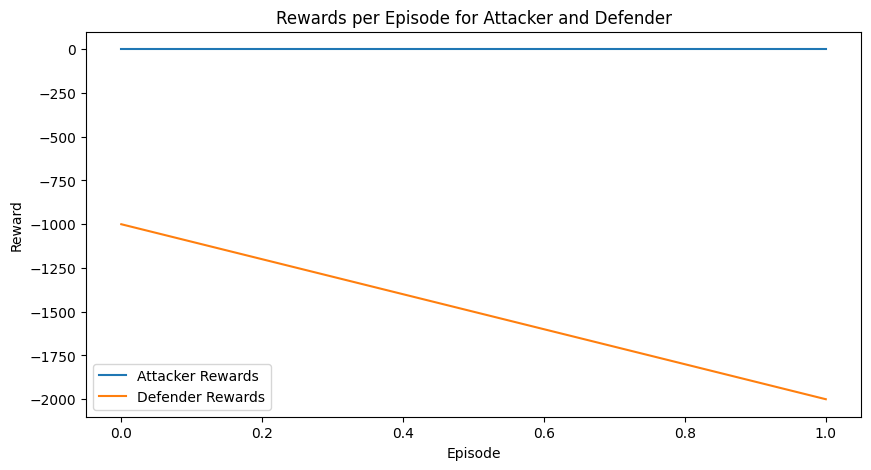

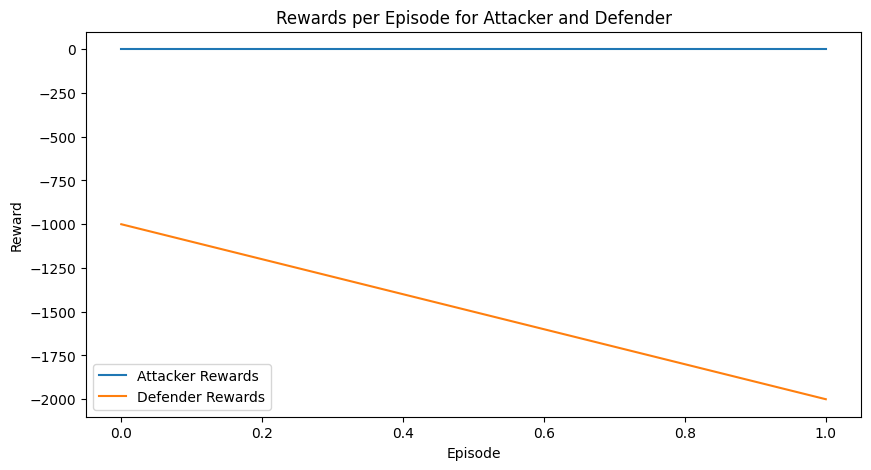

Choosing action based on the current state
Step called with action: {'action_type': 3, 'node_id': 2, 'parameter': 0}
Executing defender action {'action_type': 3, 'node_id': 2, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 3, 'node_id': 2, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 8_WindowsNode (Numerical ID: 9) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

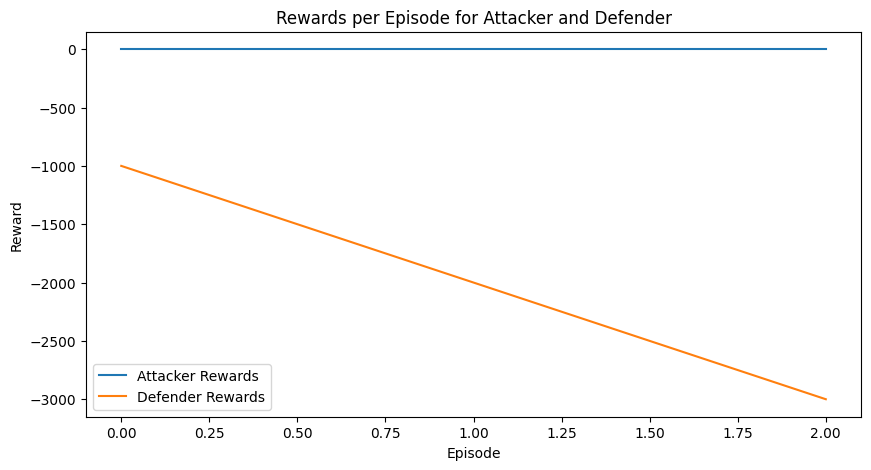

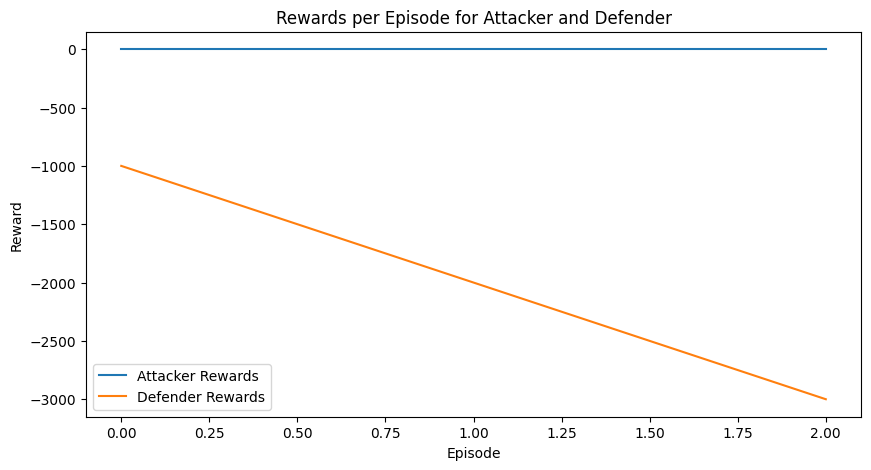

Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 6, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 6, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 1, 'node_id': 6, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 5_LinuxNode (Numerical ID: 6) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

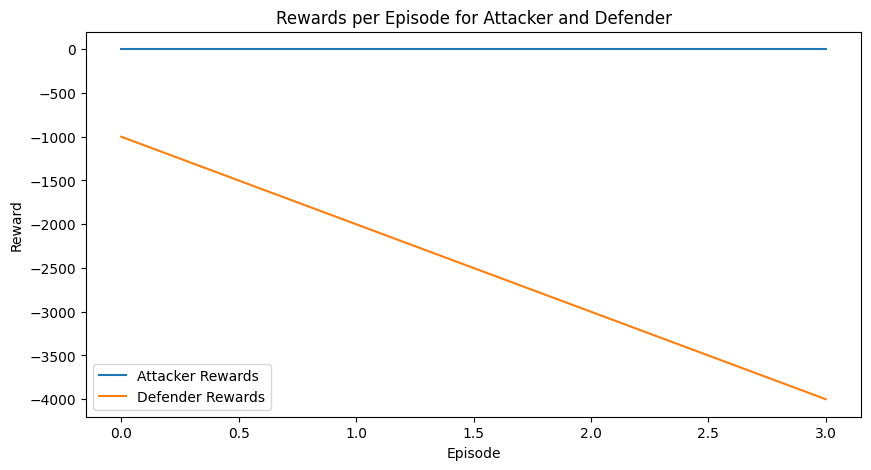

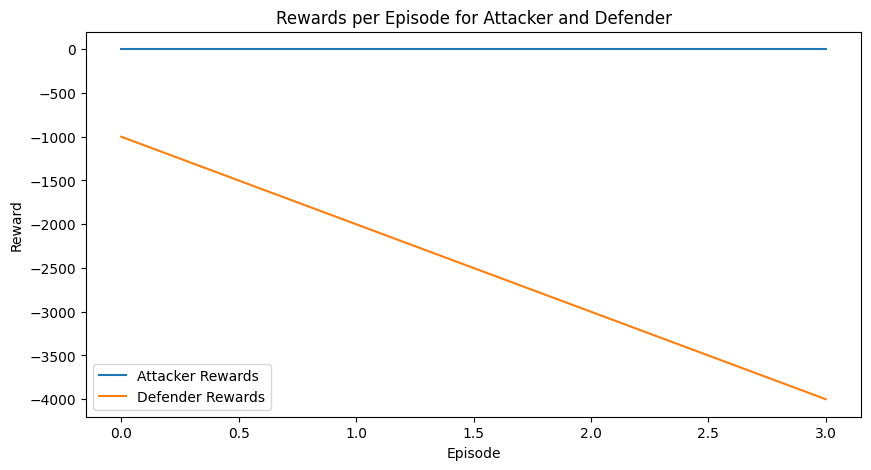

Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 7, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 2, 'node_id': 7, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 5_LinuxNode (Numerical ID: 6) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

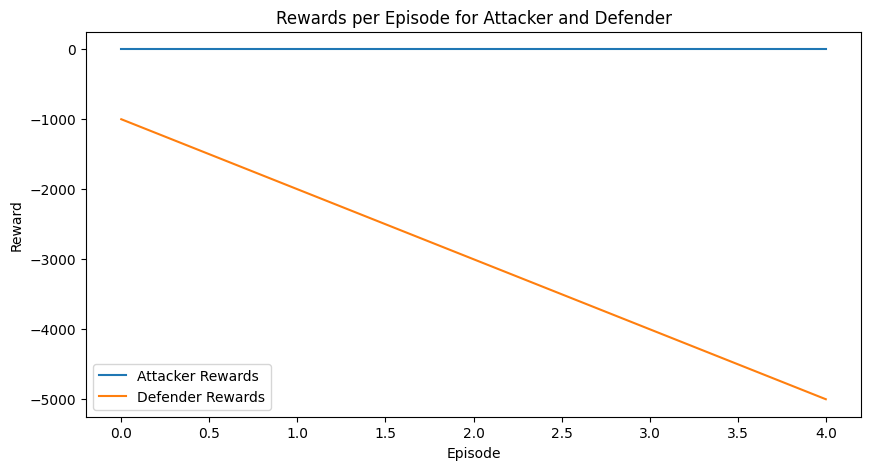

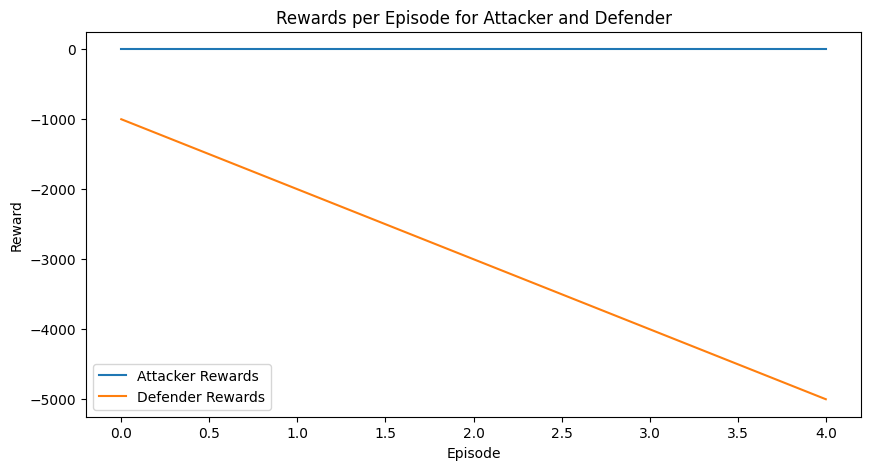

Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 6, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 6, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 0, 'node_id': 6, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 11_LinuxNode (Numerical ID: 12) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

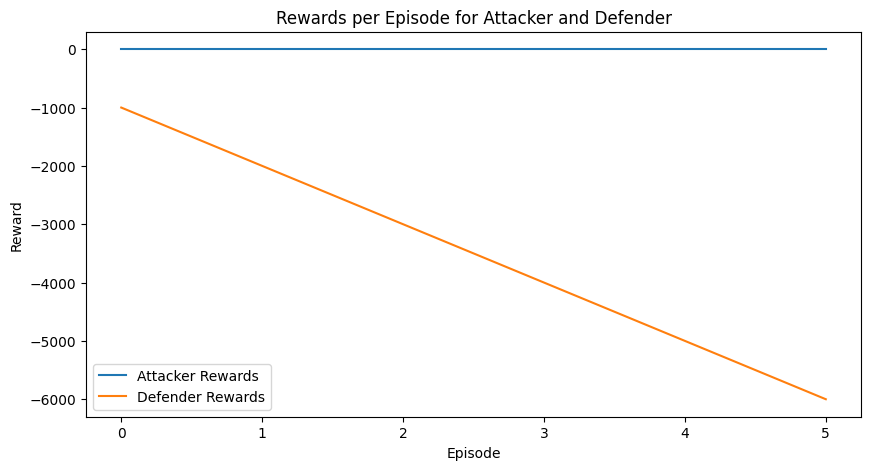

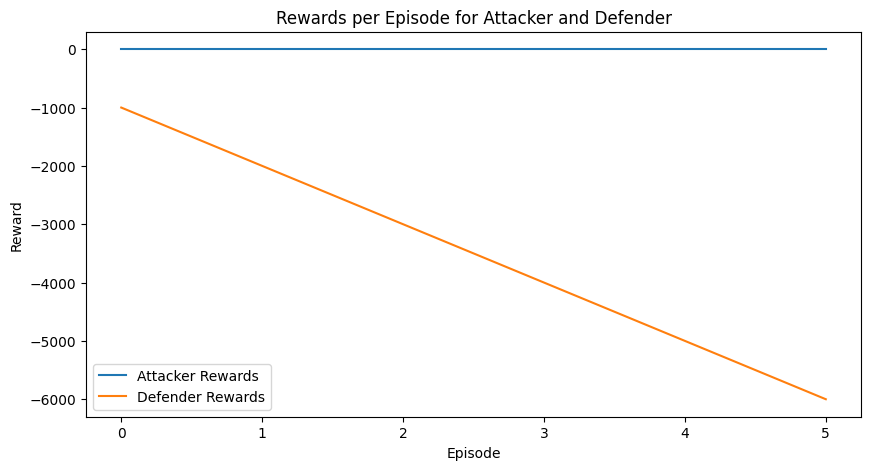

Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 2, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 4, 'node_id': 2, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 1_LinuxNode (Numerical ID: 2) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

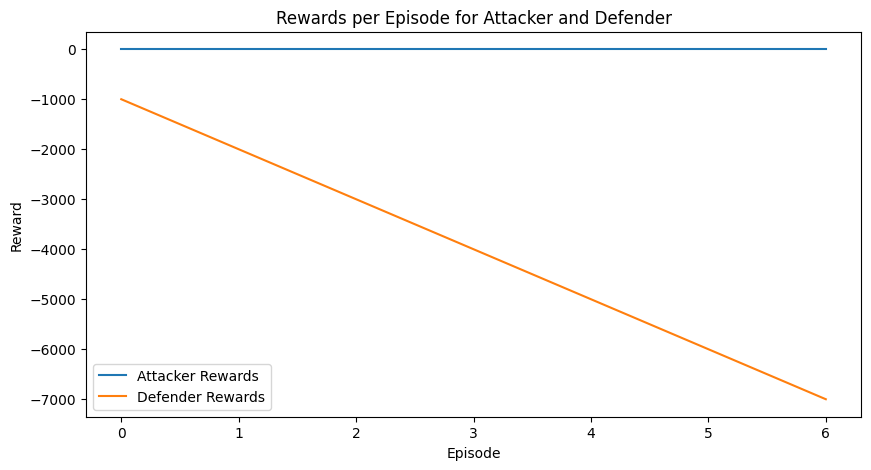

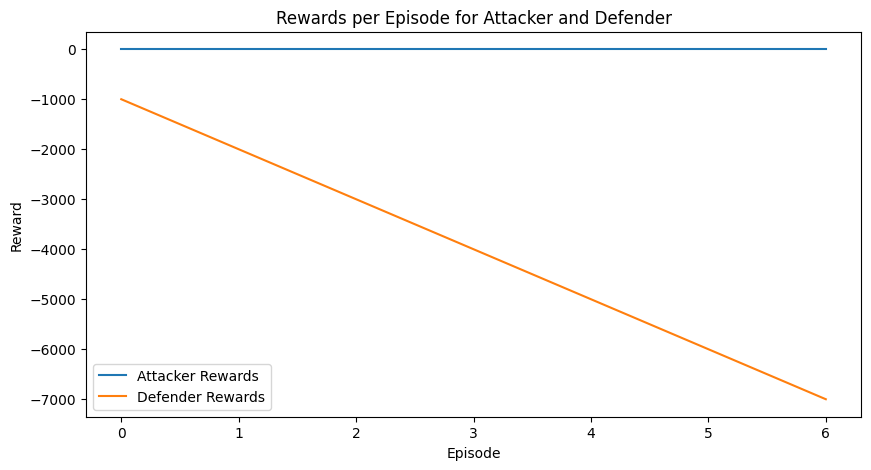

Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 5, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 1, 'node_id': 5, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 10_WindowsNode (Numerical ID: 11) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype

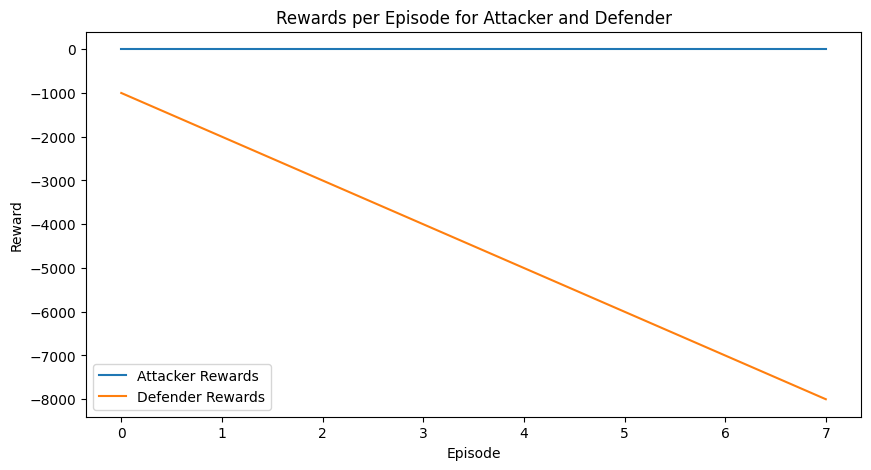

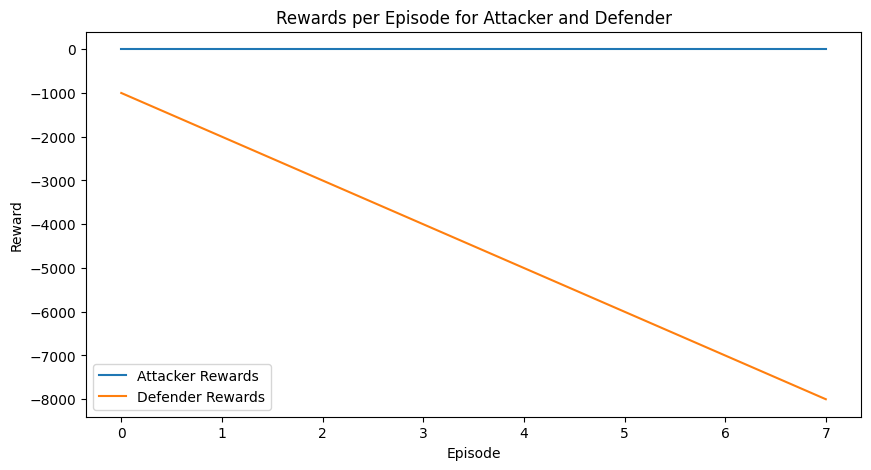

Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 0, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 2, 'node_id': 0, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 7_LinuxNode (Numerical ID: 8) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

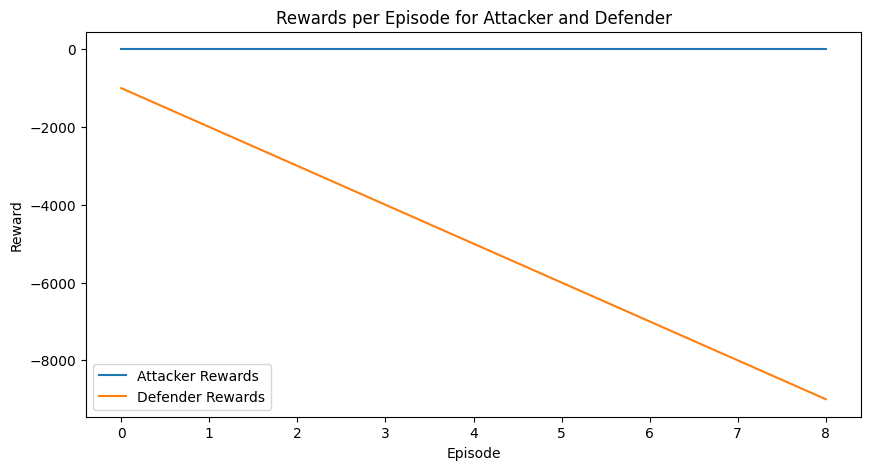

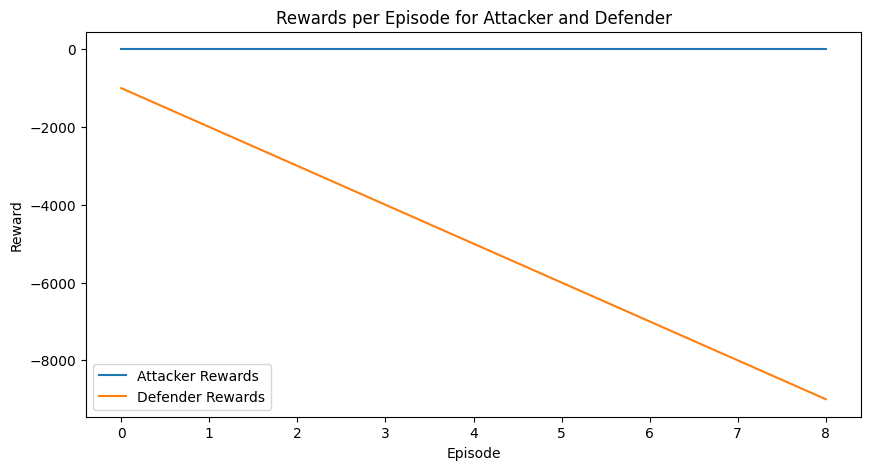

Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 4, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 2, 'node_id': 4, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 11_LinuxNode (Numerical ID: 12) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

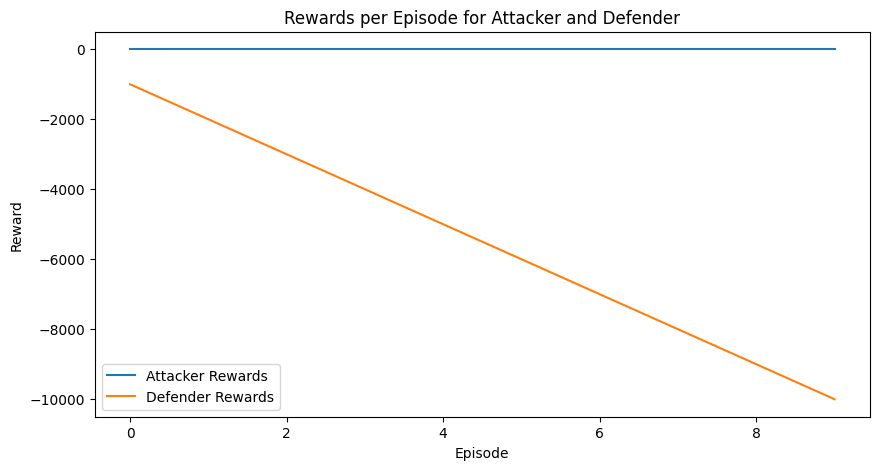

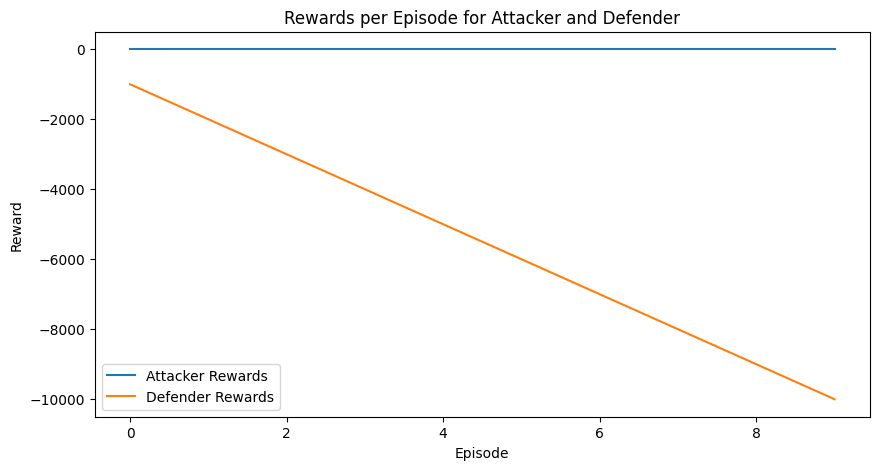

Episode 1: Attacker Reward = 0, Defender Reward = -10000
Choosing action based on the current state
Step called with action: {'action_type': 3, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 3, 'node_id': 5, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 3, 'node_id': 5, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 13_LinuxNode (Numerical ID: 1) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': a

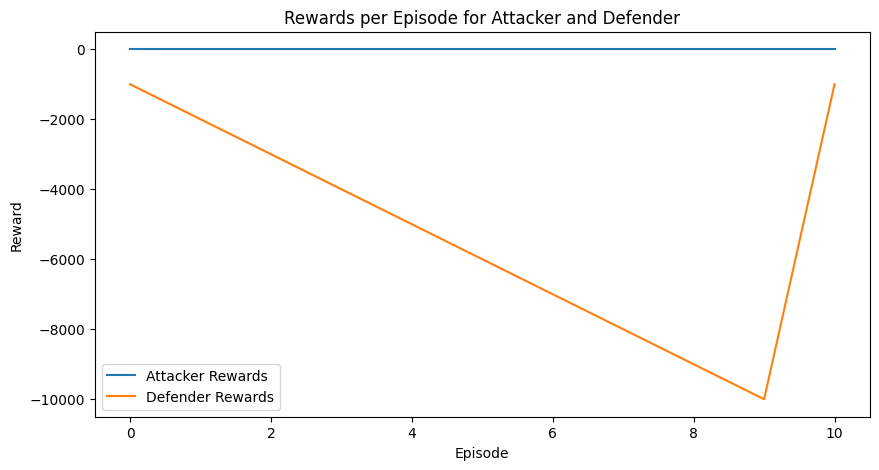

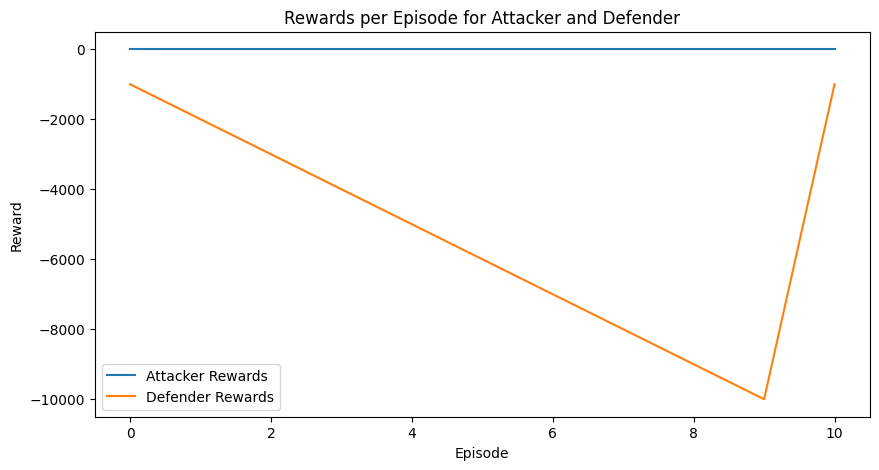

Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 2, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 4, 'node_id': 2, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 3_LinuxNode (Numerical ID: 4) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

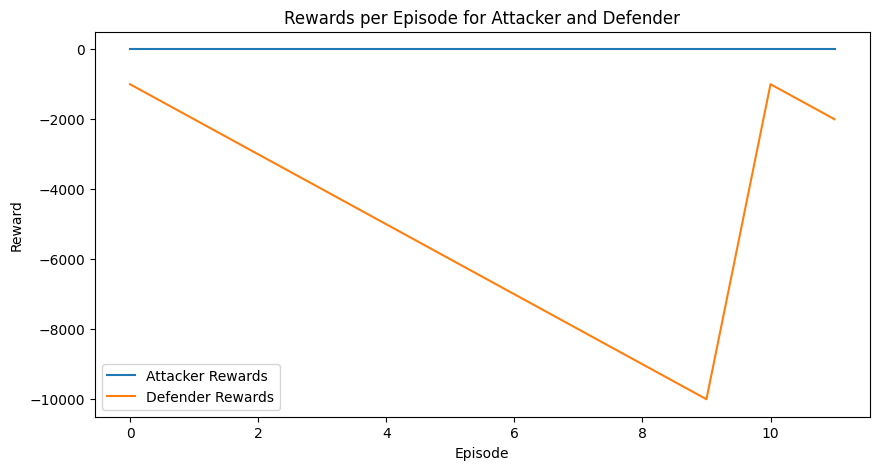

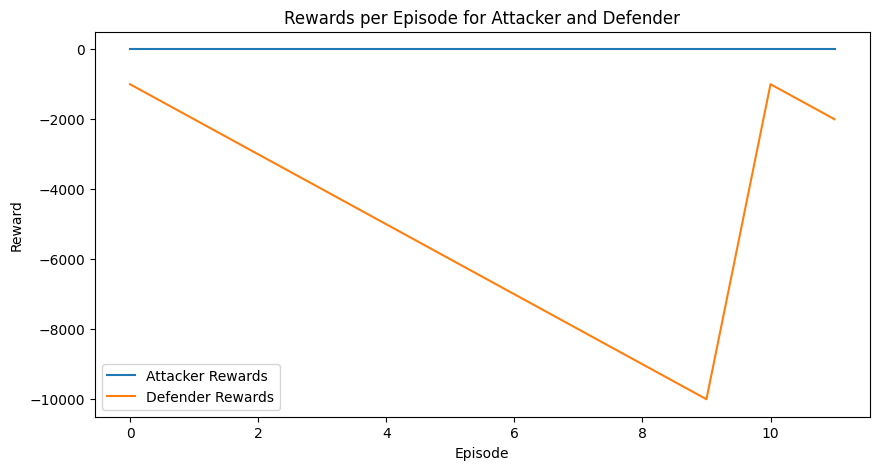

Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 5, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 2, 'node_id': 5, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 12_WindowsNode (Numerical ID: 13) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype

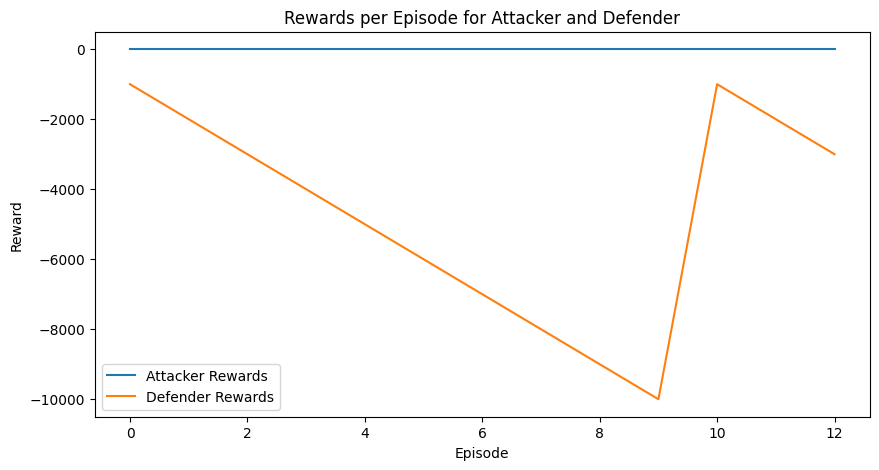

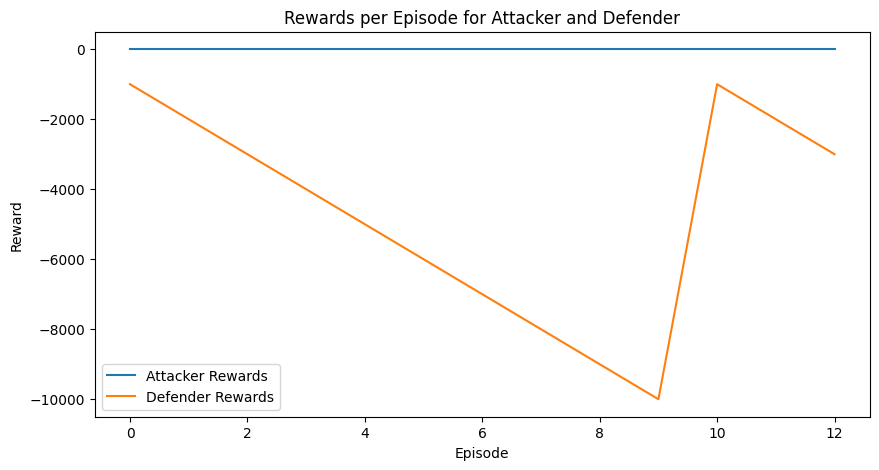

Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 4, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 4, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 1, 'node_id': 4, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 11_LinuxNode (Numerical ID: 12) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

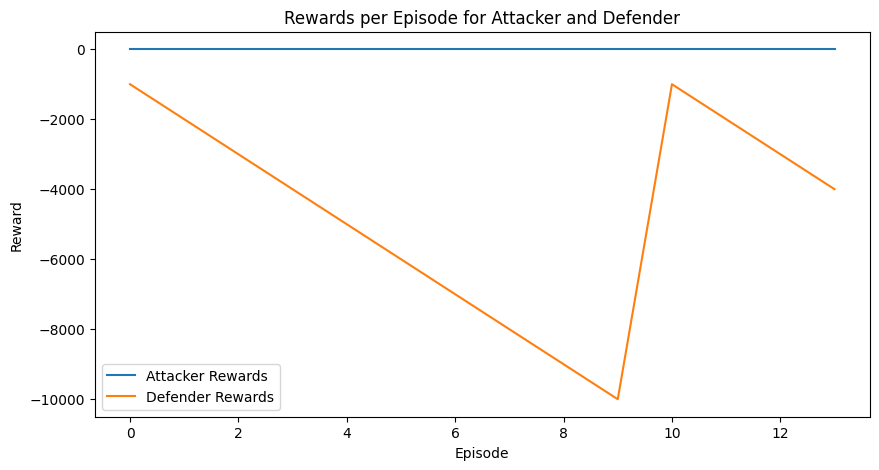

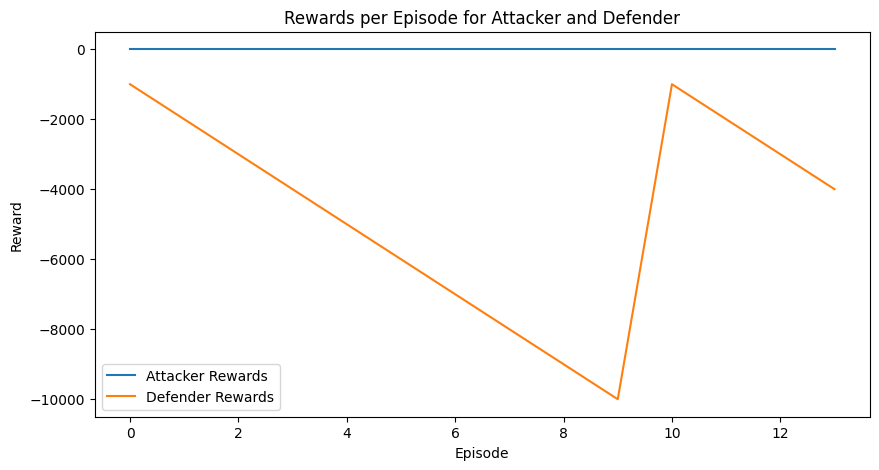

Choosing action based on the current state
Step called with action: {'action_type': 3, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 3, 'node_id': 5, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 3, 'node_id': 5, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 2_WindowsNode (Numerical ID: 3) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

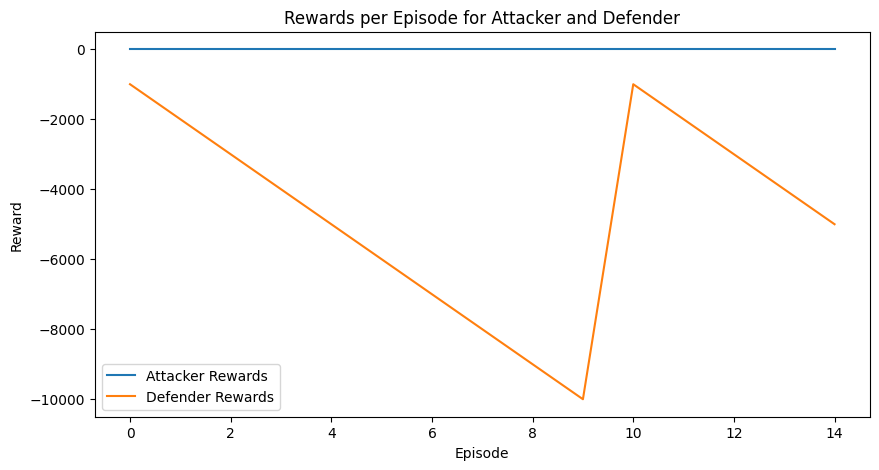

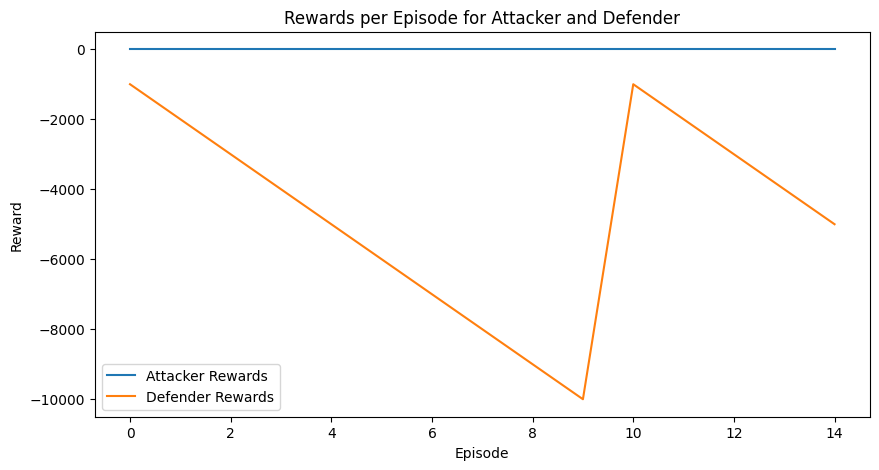

Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 0, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 0, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 0, 'node_id': 0, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 8_WindowsNode (Numerical ID: 9) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

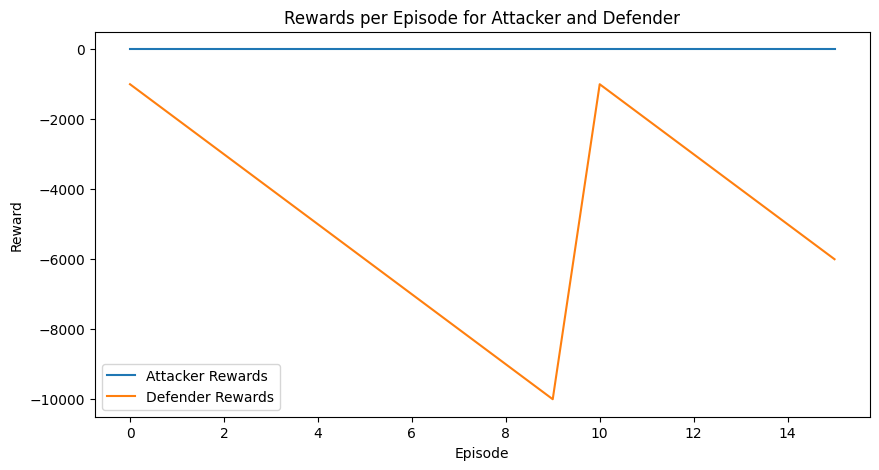

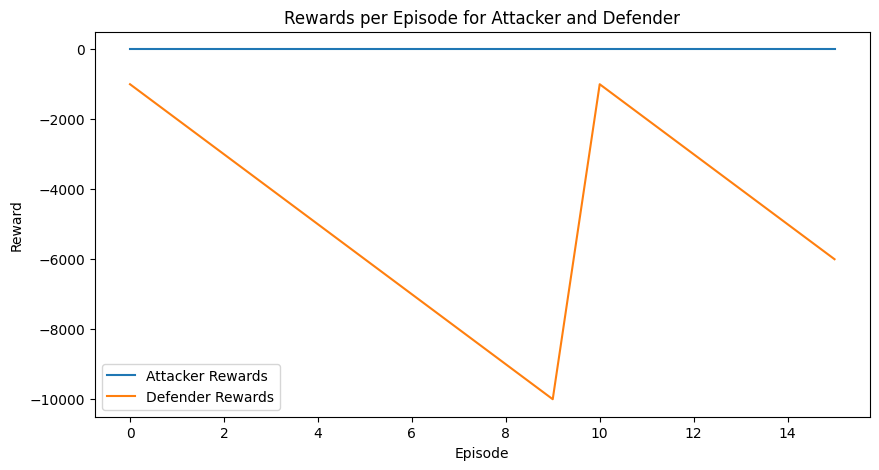

Choosing action based on the current state
Step called with action: {'action_type': 3, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 3, 'node_id': 5, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 3, 'node_id': 5, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 3_LinuxNode (Numerical ID: 4) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

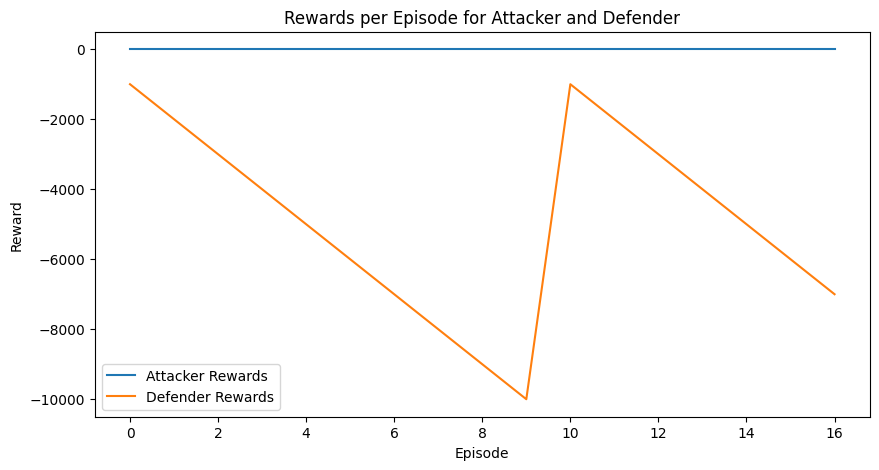

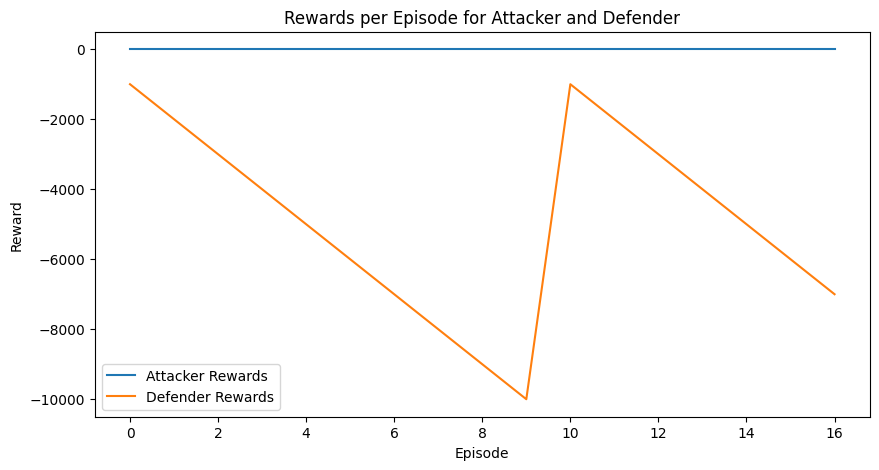

Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 7, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 7, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 0, 'node_id': 7, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 1_LinuxNode (Numerical ID: 2) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

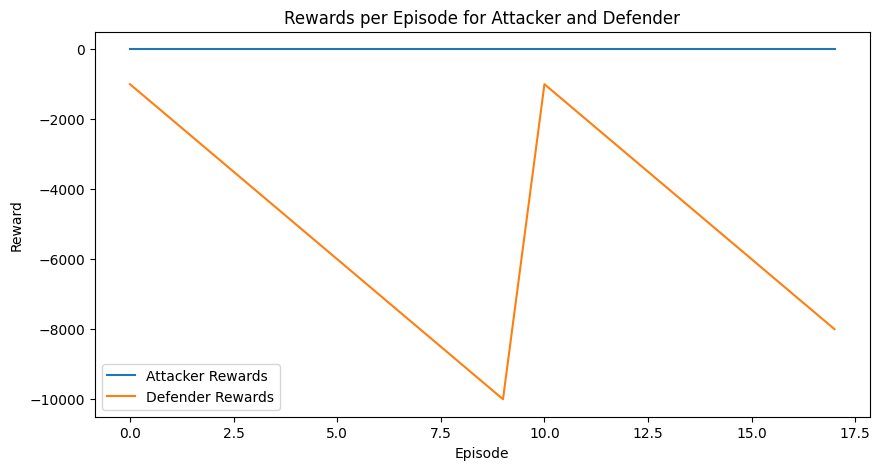

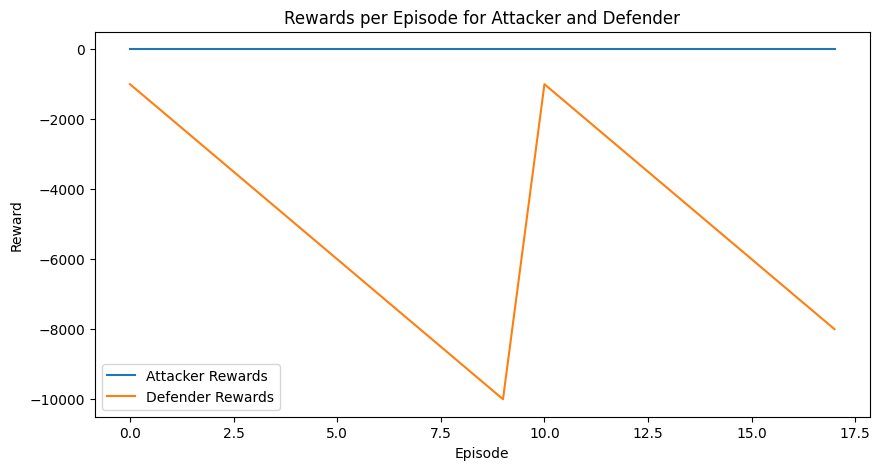

Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 5, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 5, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 0, 'node_id': 5, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 2_WindowsNode (Numerical ID: 3) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

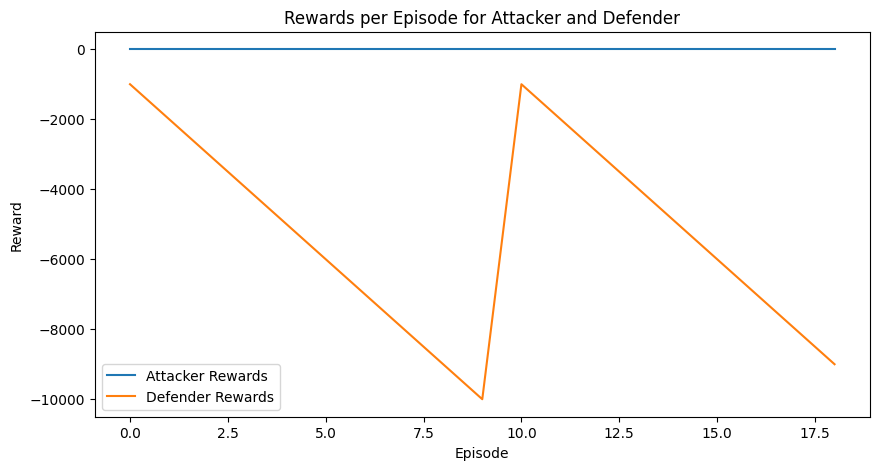

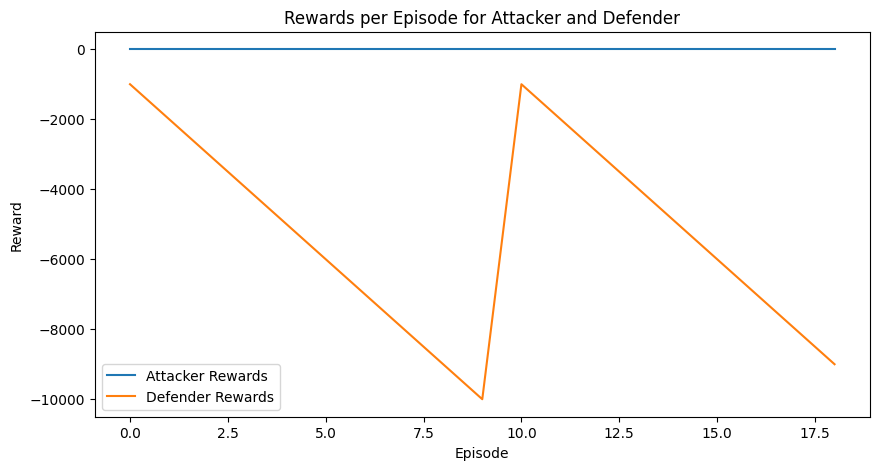

Choosing action based on the current state
Step called with action: {'action_type': 3, 'node_id': 0, 'parameter': 0}
Executing defender action {'action_type': 3, 'node_id': 0, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 3, 'node_id': 0, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 8_WindowsNode (Numerical ID: 9) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

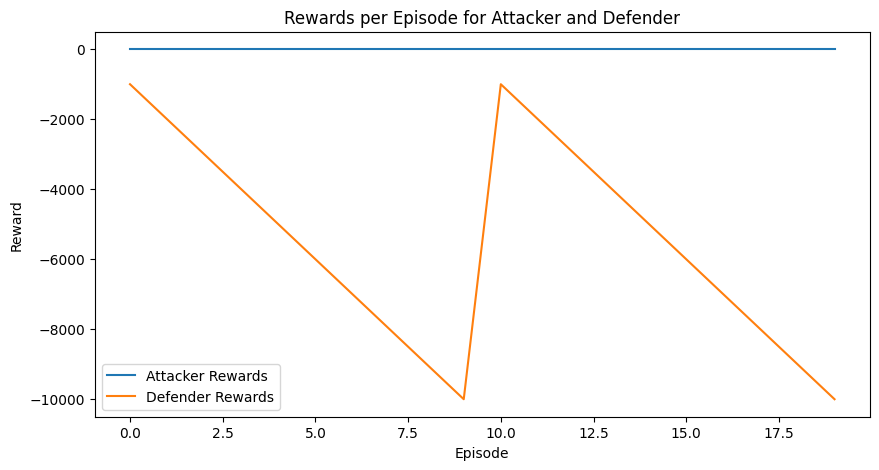

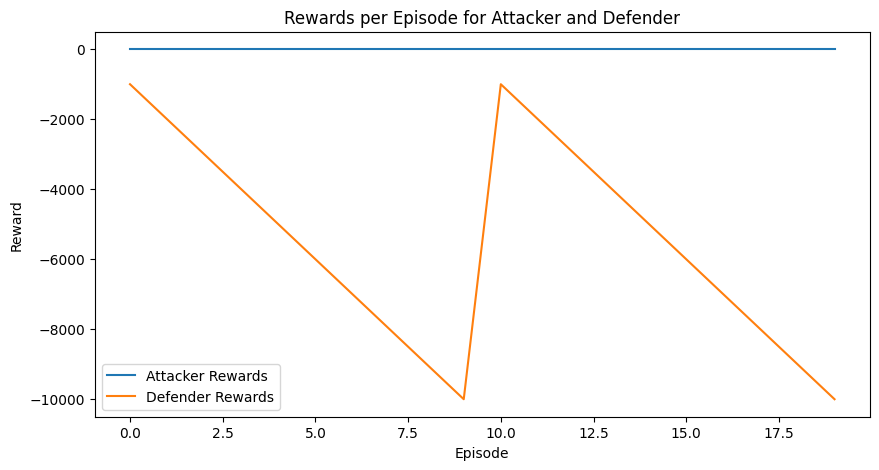

Episode 2: Attacker Reward = 0, Defender Reward = -10000
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 9, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 9, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 4, 'node_id': 9, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 8_WindowsNode (Numerical ID: 9) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': 

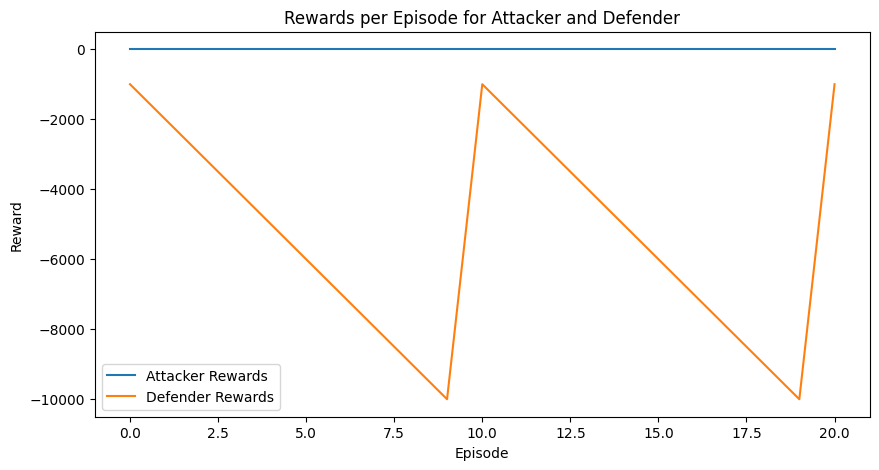

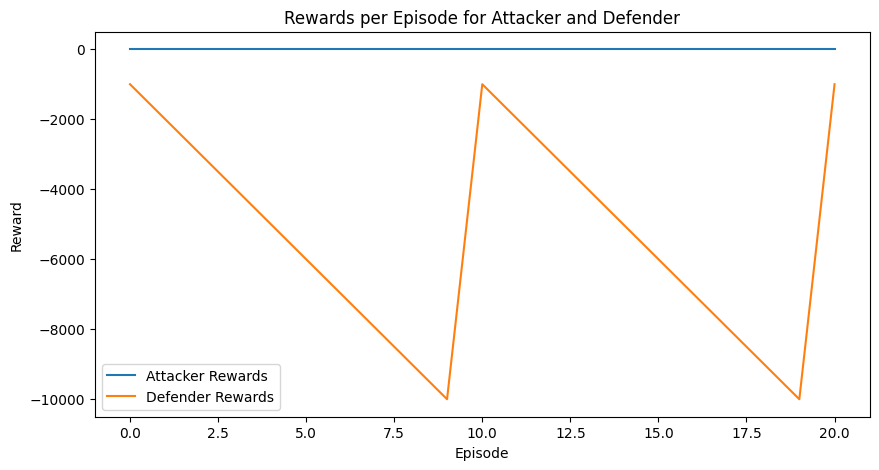

Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 0, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 0, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 4, 'node_id': 0, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 2_WindowsNode (Numerical ID: 3) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

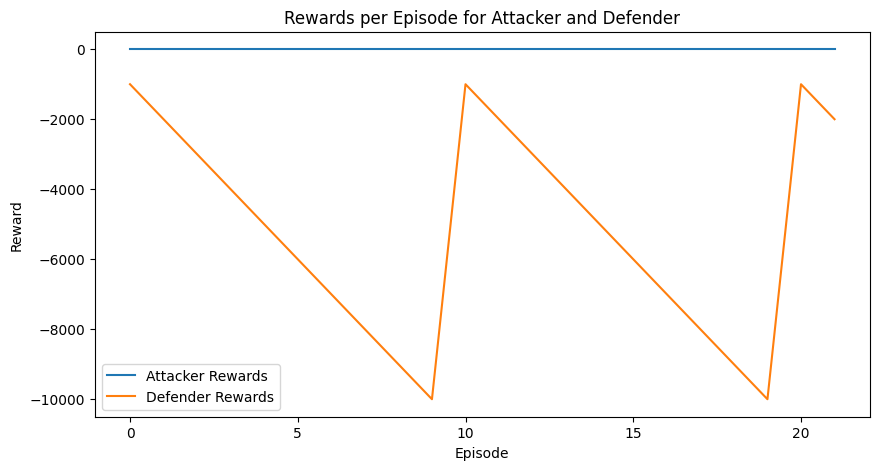

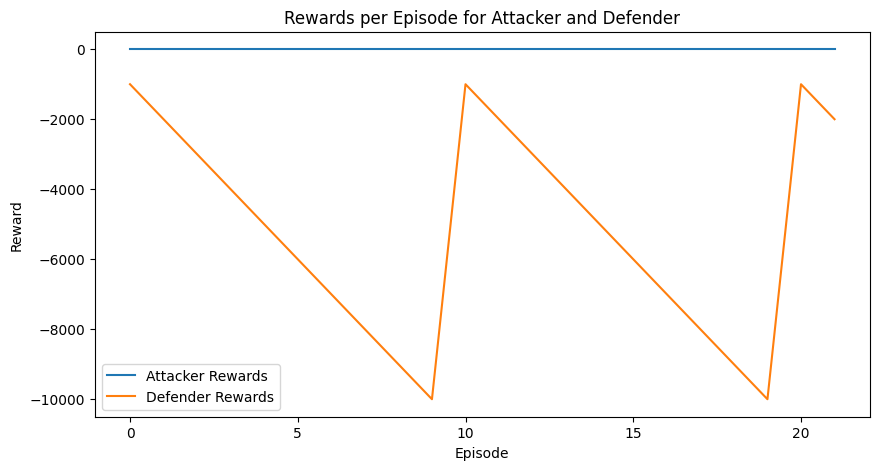

Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 11, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 11, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 0, 'node_id': 11, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 3_LinuxNode (Numerical ID: 4) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=

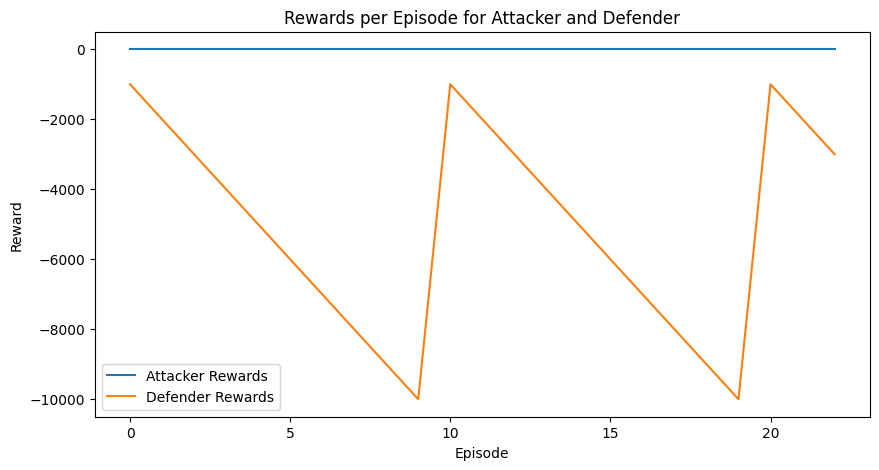

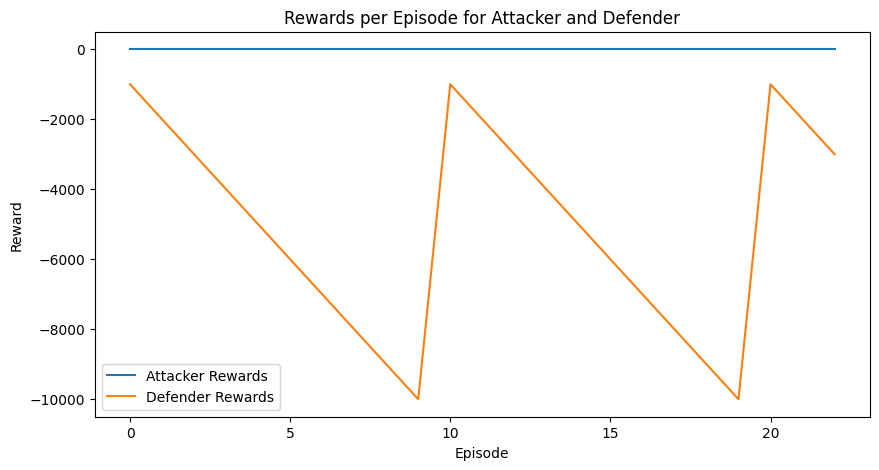

Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 1, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 1, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 1, 'node_id': 1, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 9_LinuxNode (Numerical ID: 10) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=in

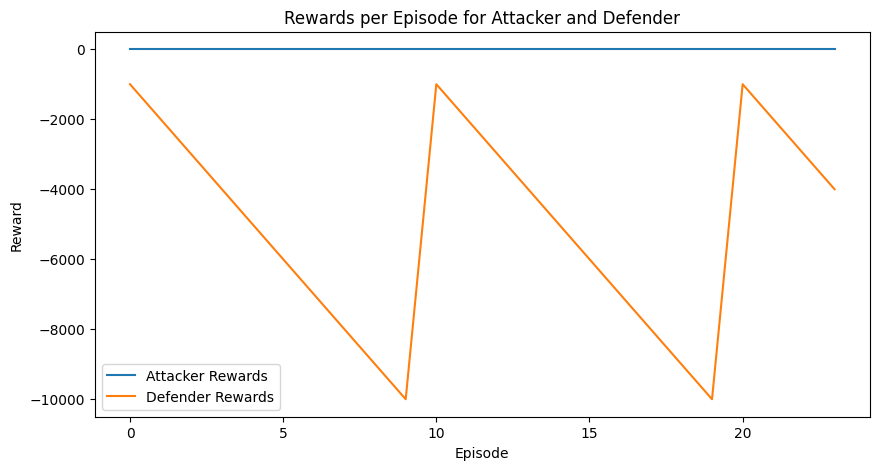

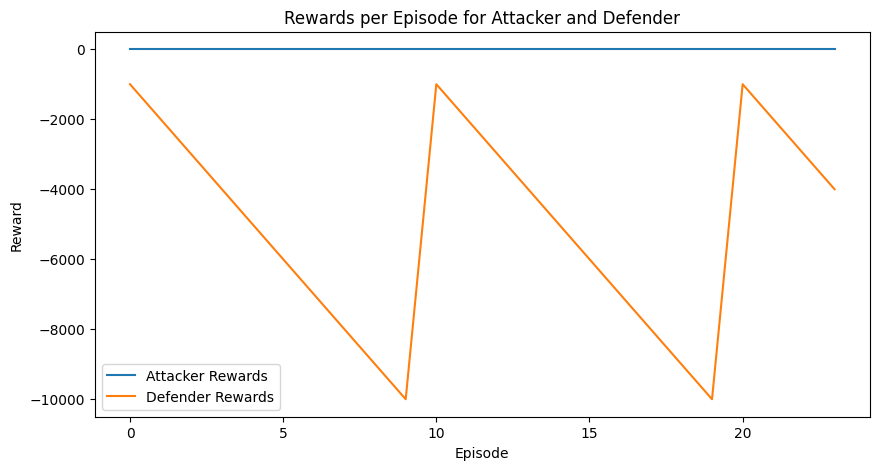

Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 7, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 1, 'node_id': 7, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 5_LinuxNode (Numerical ID: 6) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

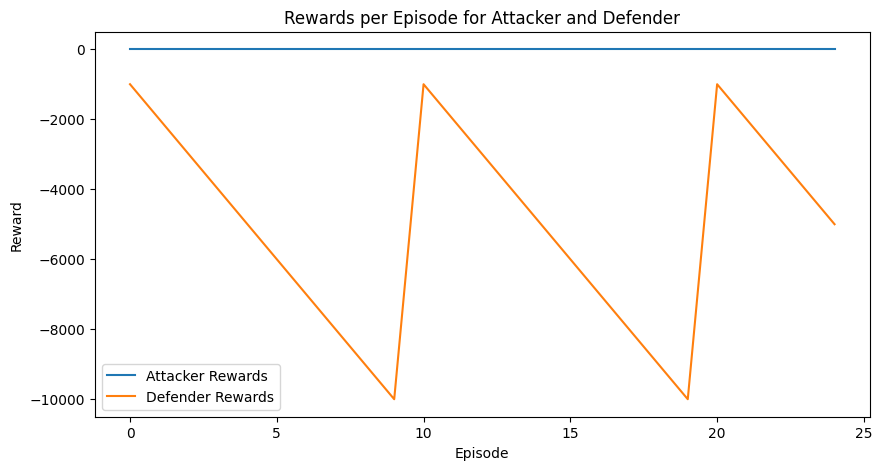

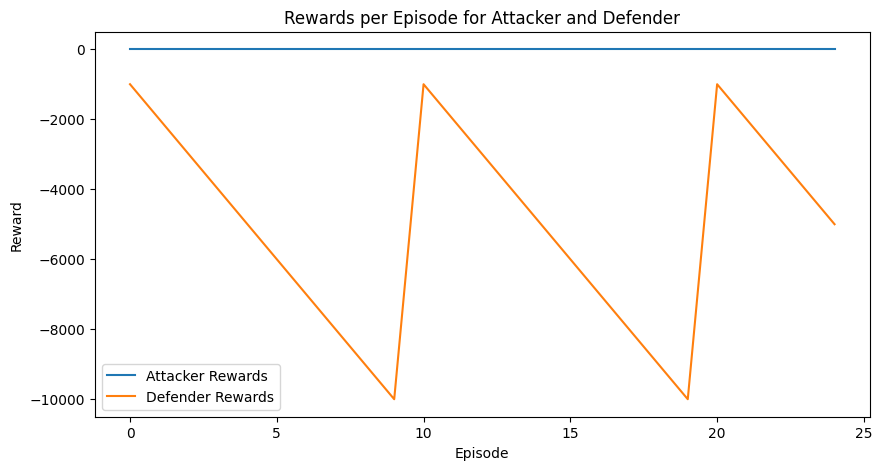

Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 1, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 1, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 2, 'node_id': 1, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 3_LinuxNode (Numerical ID: 4) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

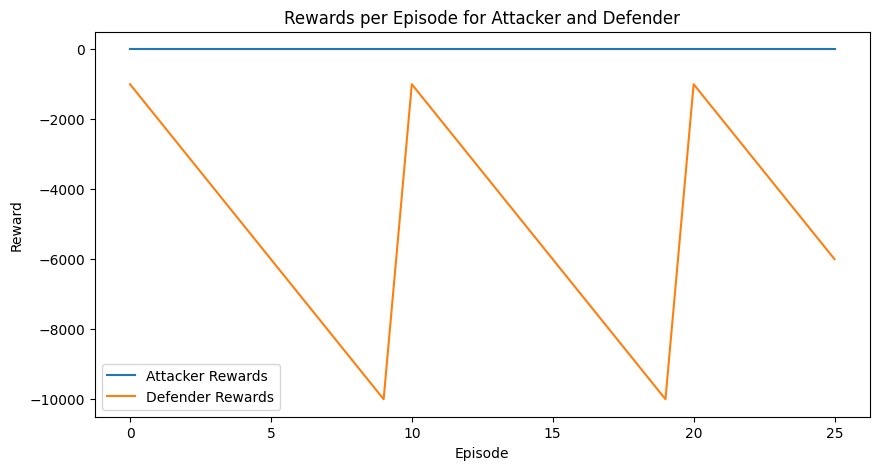

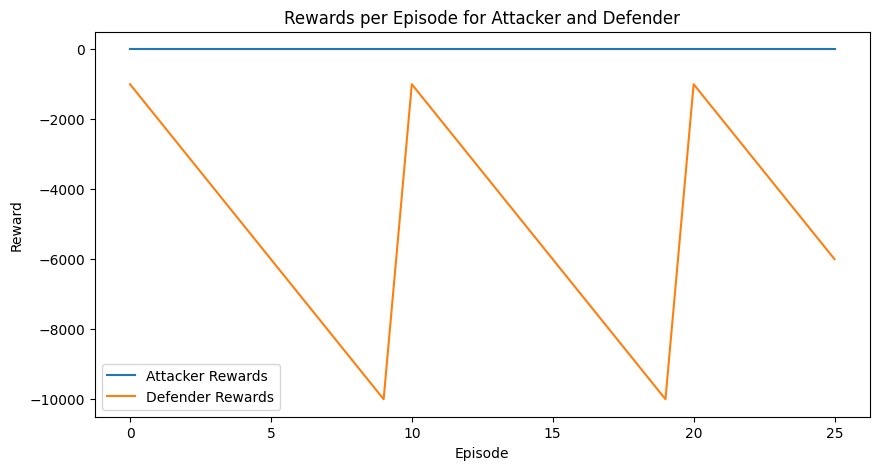

Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 3, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 3, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 1, 'node_id': 3, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 2_WindowsNode (Numerical ID: 3) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

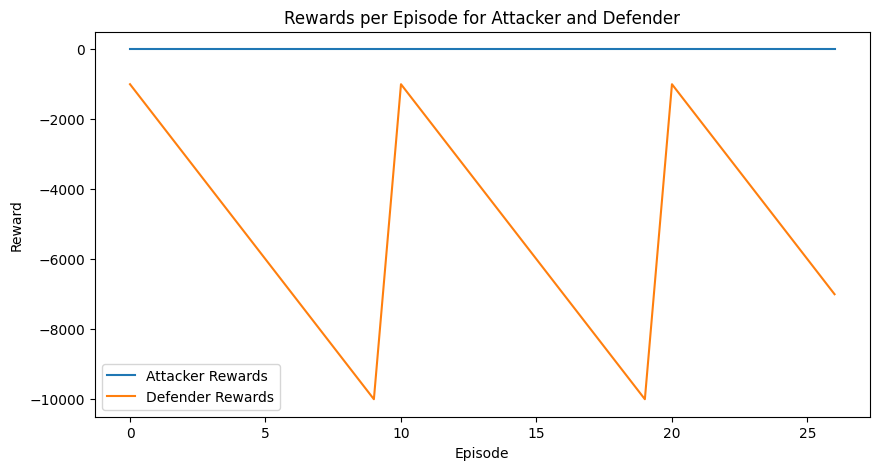

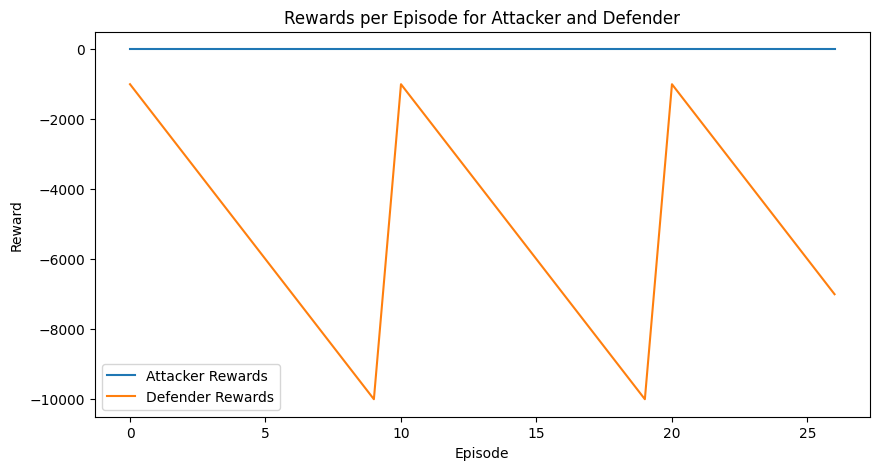

Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 13, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 13, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 0, 'node_id': 13, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 6_WindowsNode (Numerical ID: 7) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtyp

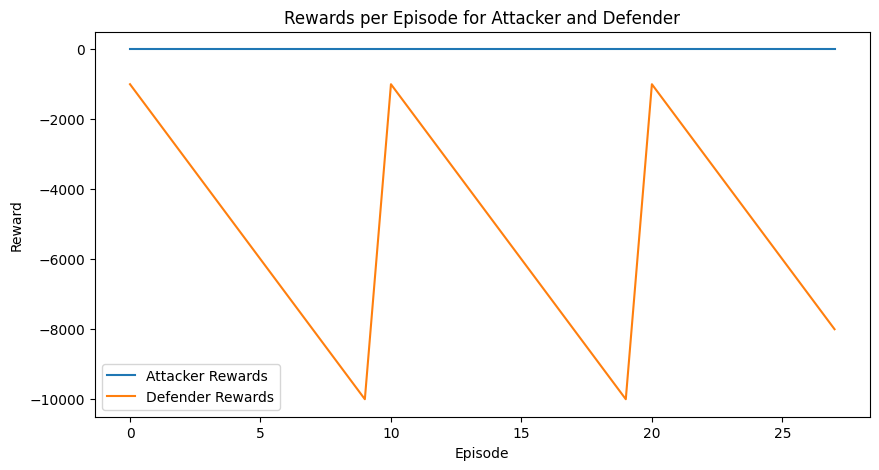

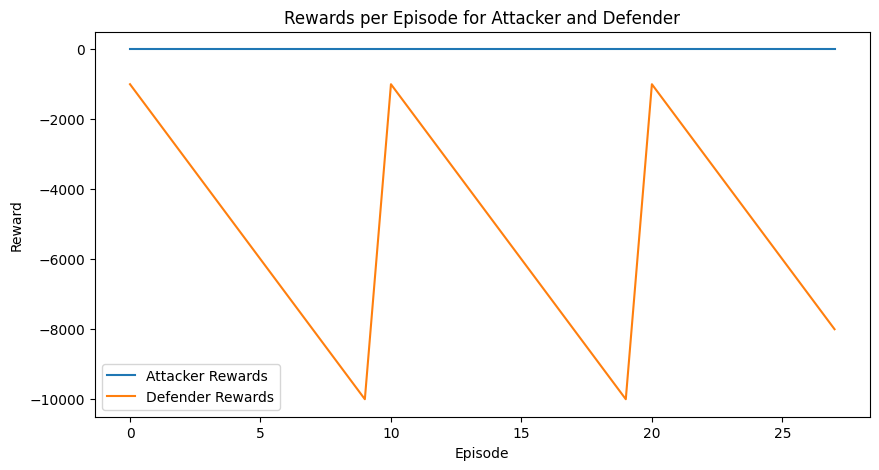

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
{'description': 'CyberBattle simulation', 'duration_in_ms': 2420.1197624206543, 'step_count': 10, 'network_availability': 1.0, 'defender_info': {}}
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 10, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 10, 'parameter':

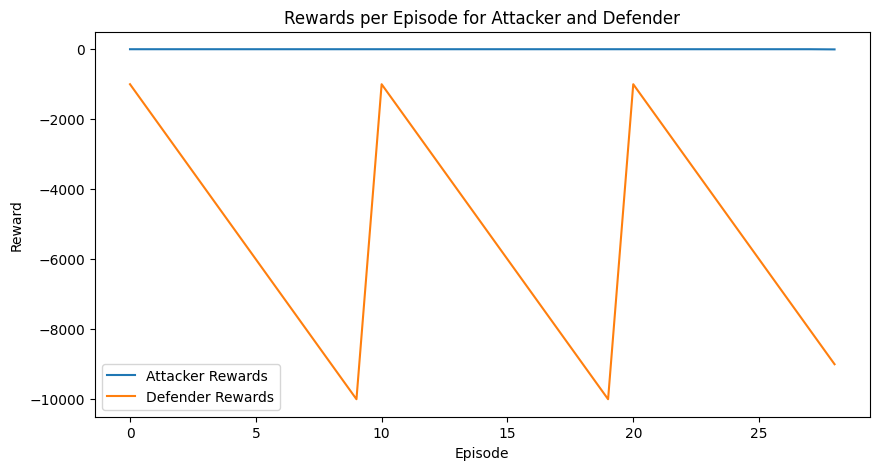

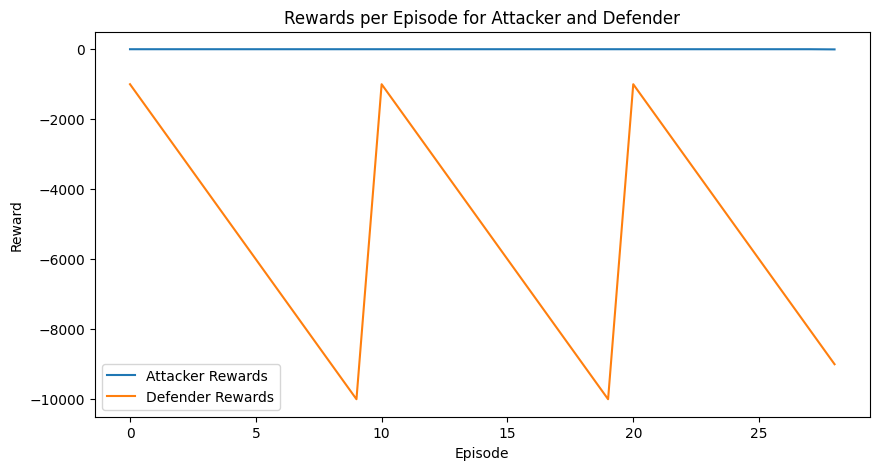

Choosing action based on the current state
Step called with action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
Executing defender action {'action_type': 3, 'node_id': 7, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 3, 'node_id': 7, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 11_LinuxNode (Numerical ID: 12) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

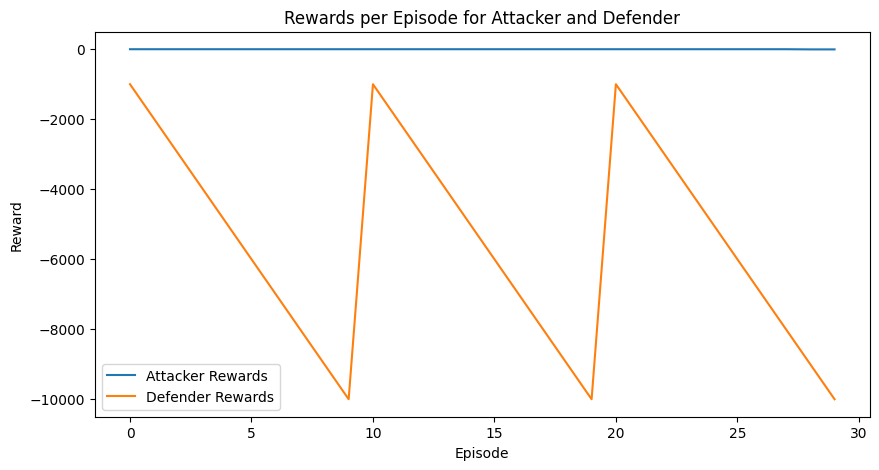

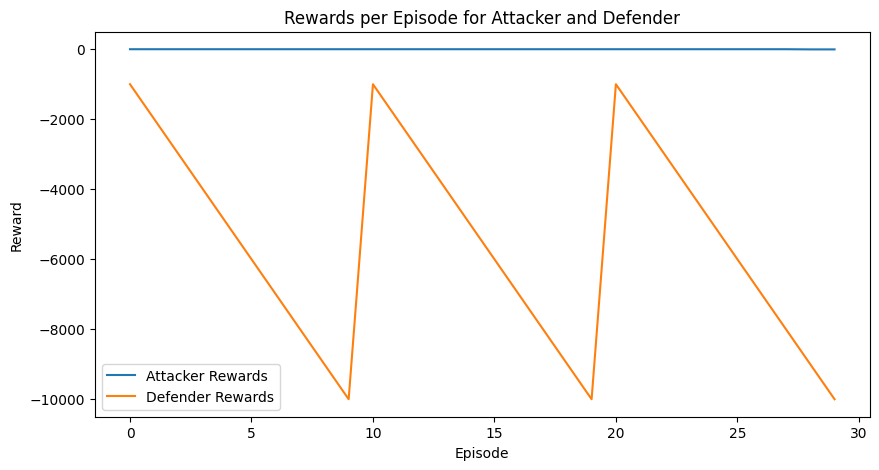

Episode 3: Attacker Reward = -5.0, Defender Reward = -10000
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 12, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 12, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 4, 'node_id': 12, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 13_LinuxNode (Numerical ID: 1) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Servi

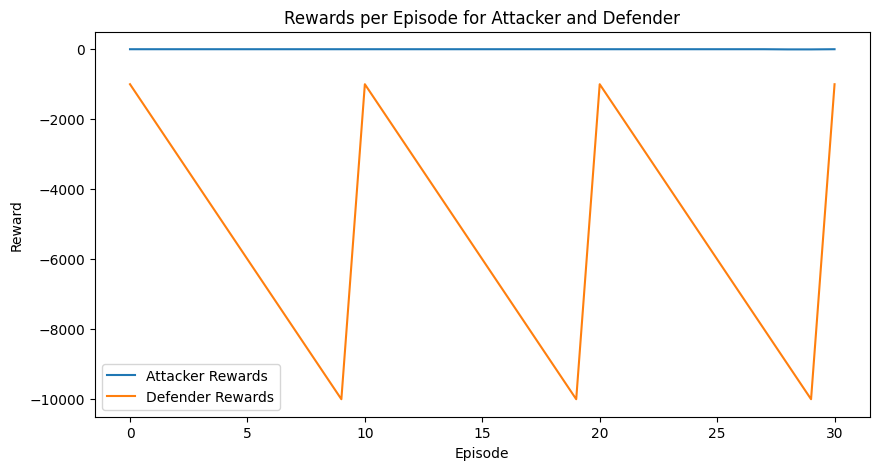

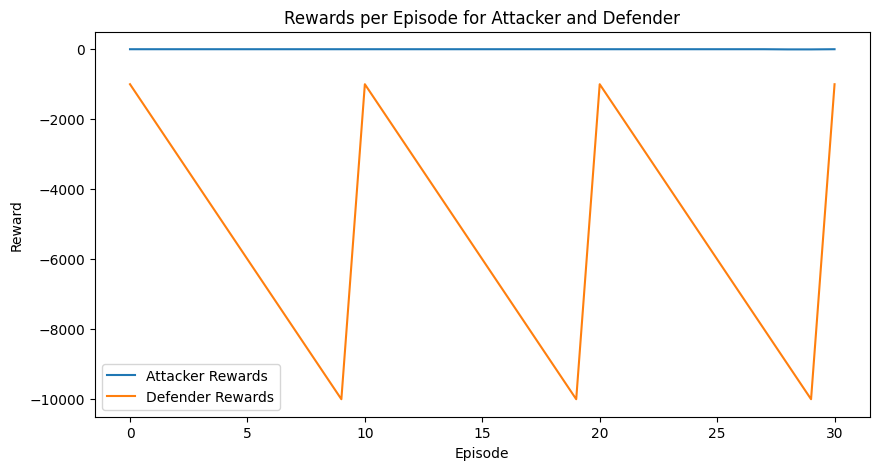

Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 1, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 1, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 1, 'node_id': 1, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 5_LinuxNode (Numerical ID: 6) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int

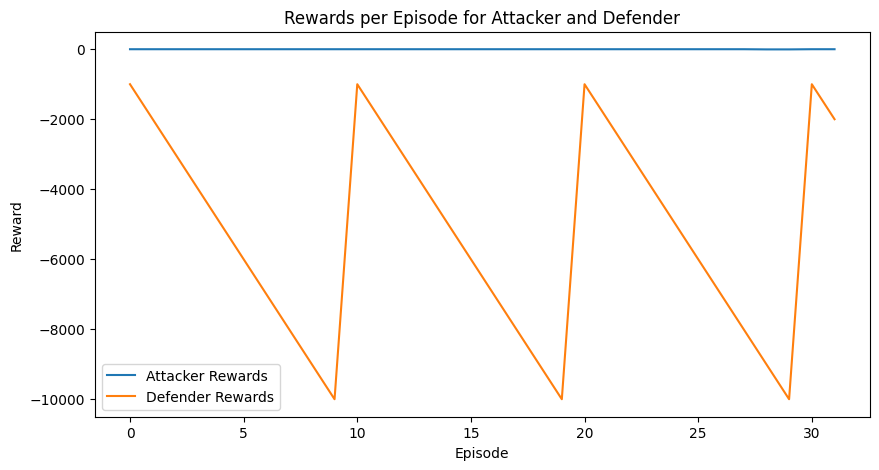

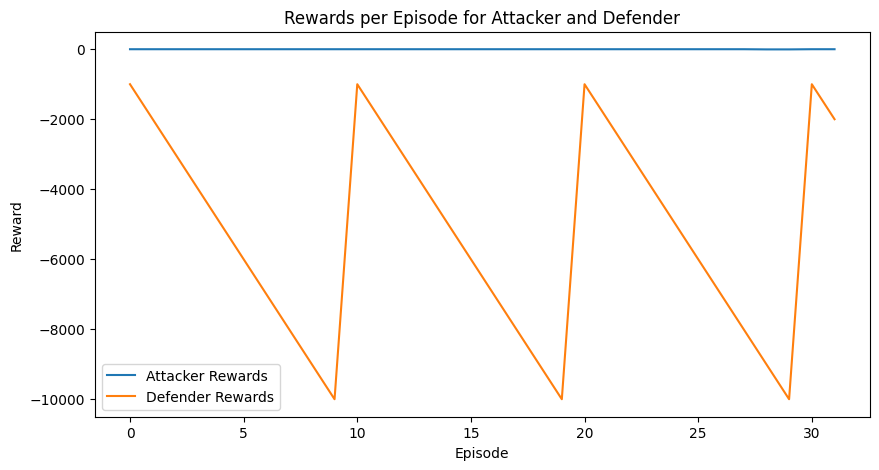

Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 4, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 4, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 0, 'node_id': 4, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 4_WindowsNode (Numerical ID: 5) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=i

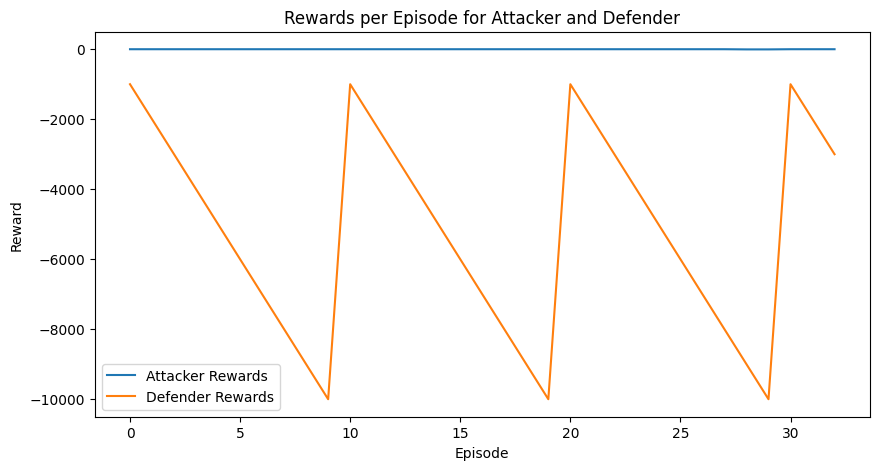

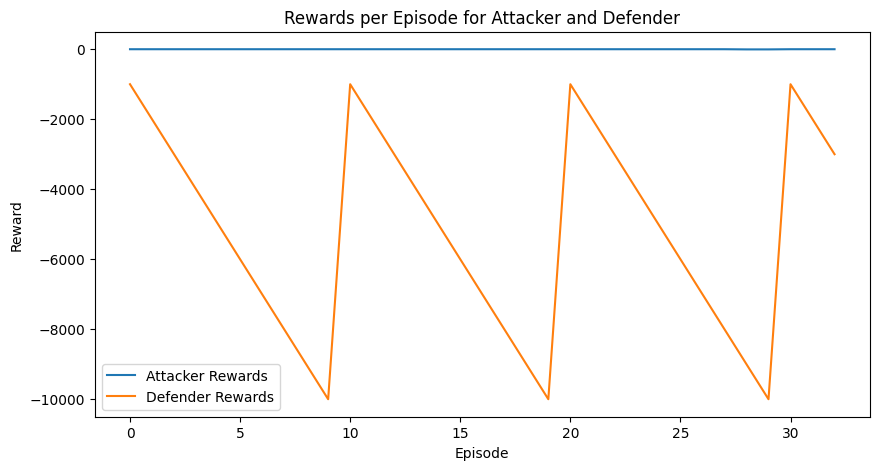

Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 11, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 4, 'node_id': 11, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 11_LinuxNode (Numerical ID: 12) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtyp

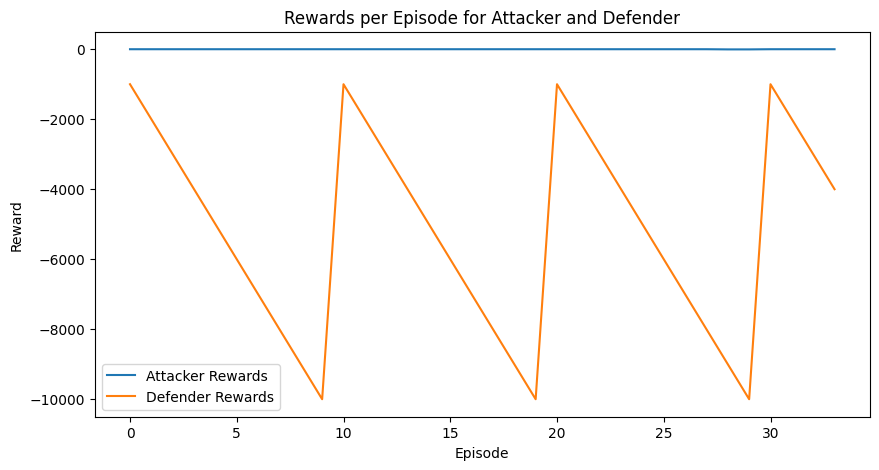

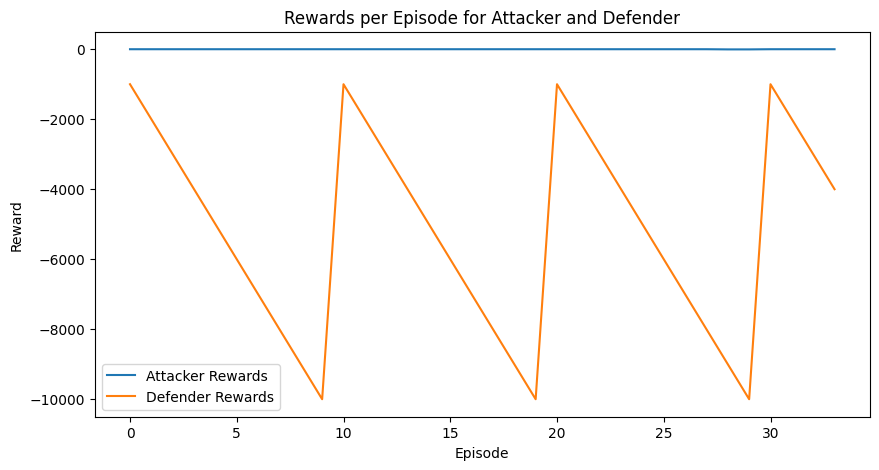

Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 3, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 2, 'node_id': 3, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 13_LinuxNode (Numerical ID: 1) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=in

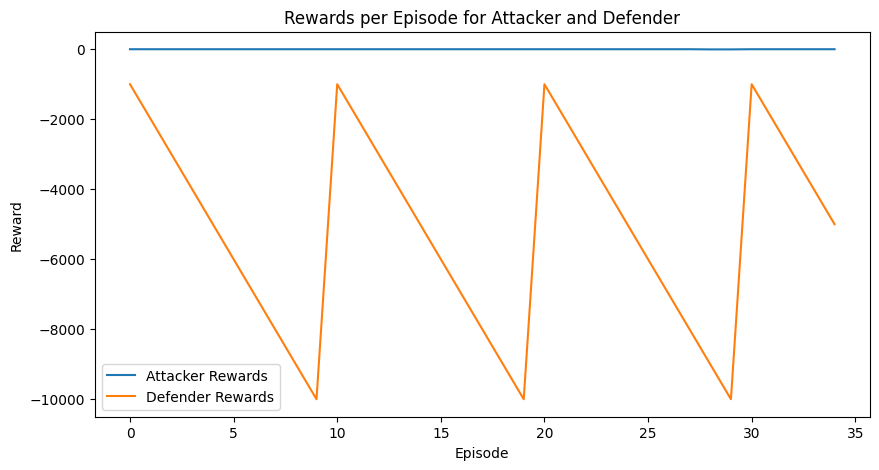

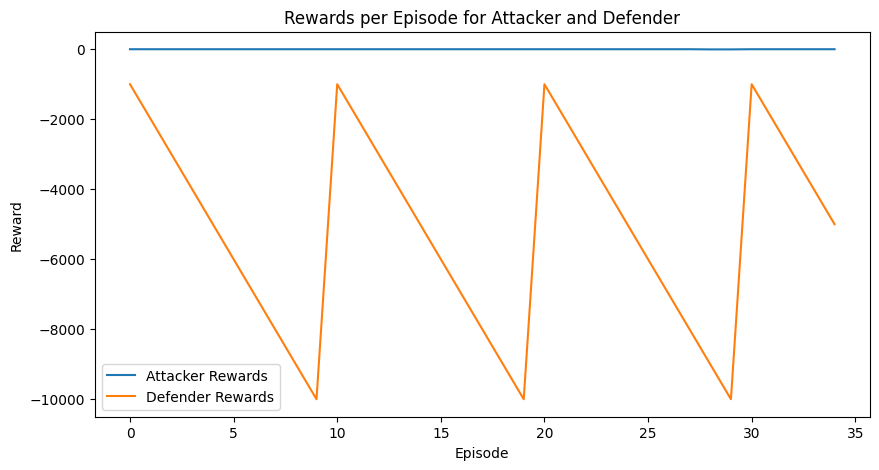

Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 10, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 10, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 0, 'node_id': 10, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: start (Numerical ID: 0) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

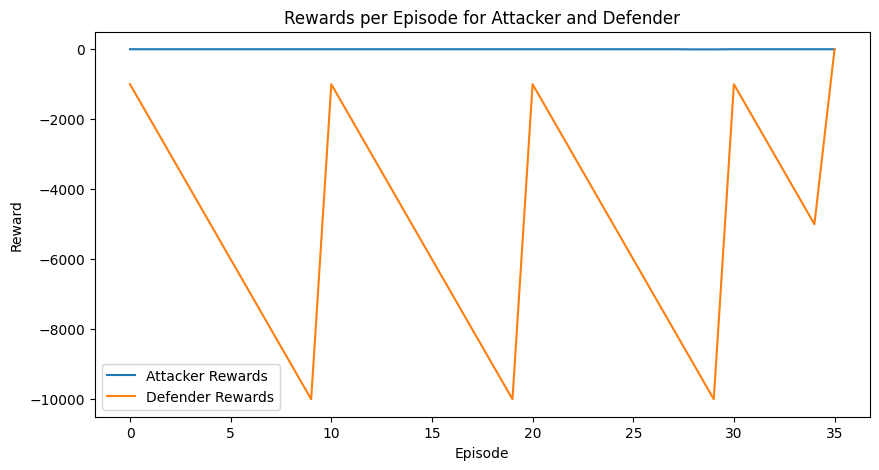

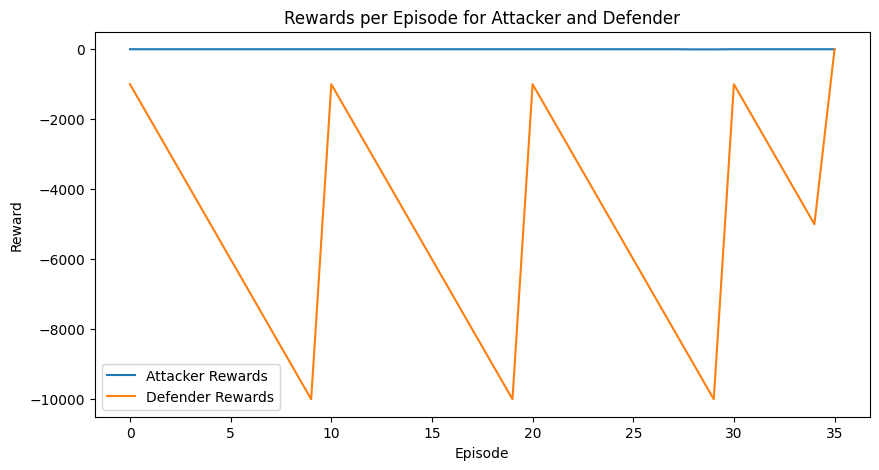

Episode 4: Attacker Reward = 0, Defender Reward = 0
Choosing action based on the current state
Step called with action: {'action_type': 4, 'node_id': 10, 'parameter': 0}
Executing defender action {'action_type': 4, 'node_id': 10, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 4, 'node_id': 10, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: start (Numerical ID: 0) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array([0, 

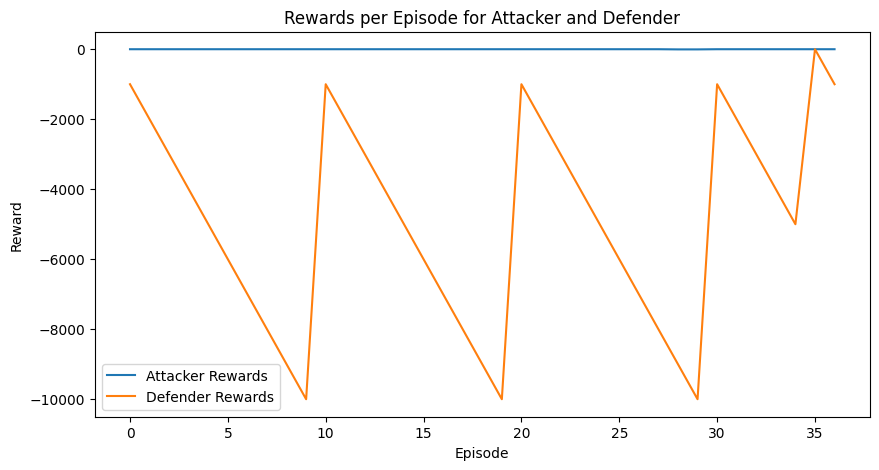

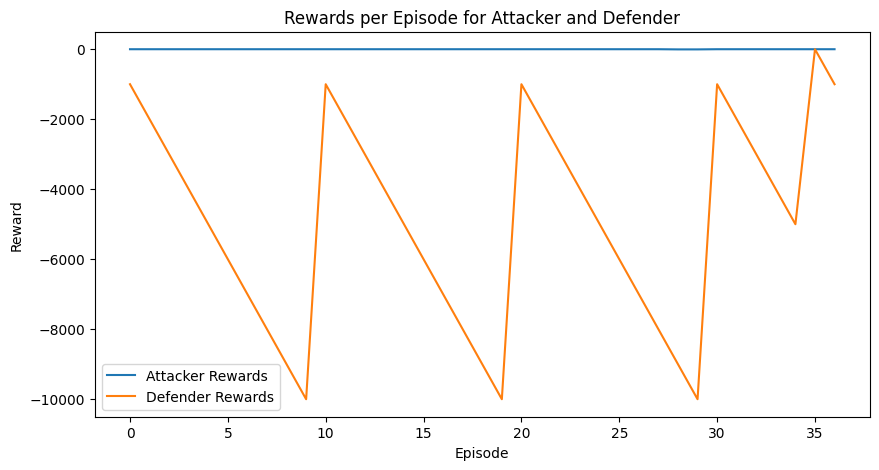

Episode 5: Attacker Reward = 0, Defender Reward = -1000
Choosing action based on the current state
Step called with action: {'action_type': 1, 'node_id': 10, 'parameter': 0}
Executing defender action {'action_type': 1, 'node_id': 10, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 1, 'node_id': 10, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: start (Numerical ID: 0) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': array(

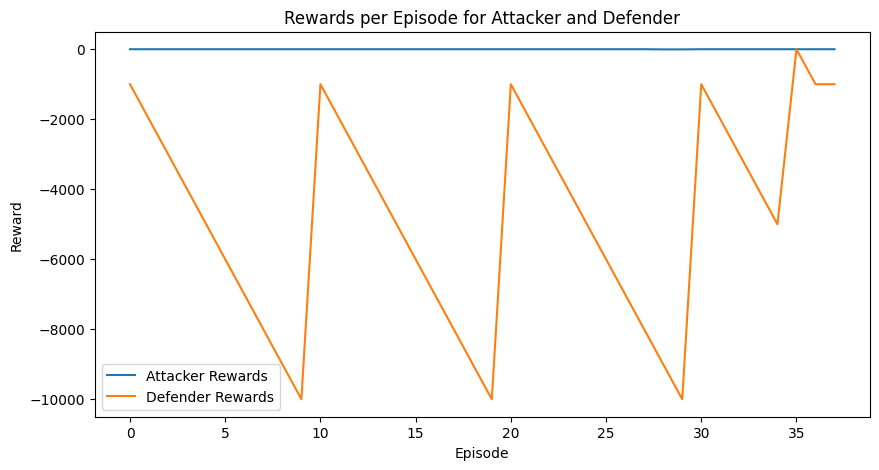

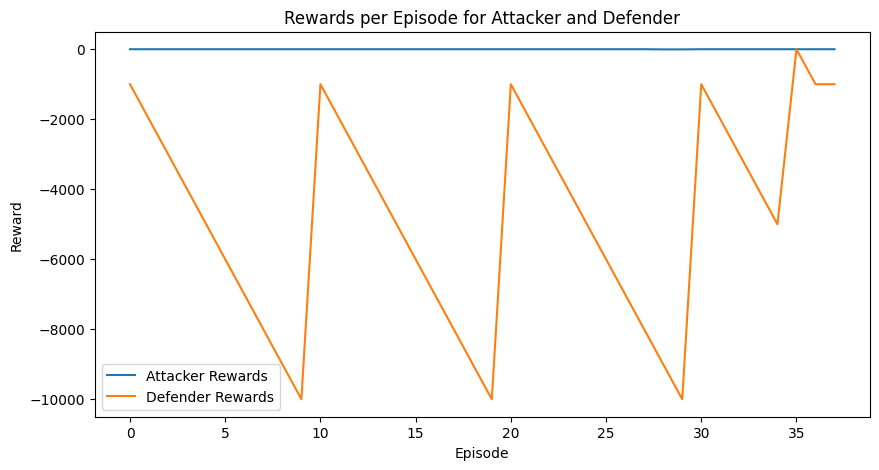

Episode 6: Attacker Reward = 0, Defender Reward = -1000
Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 6, 'parameter': 0}
Executing defender action {'action_type': 2, 'node_id': 6, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 2, 'node_id': 6, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 12_WindowsNode (Numerical ID: 13) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service':

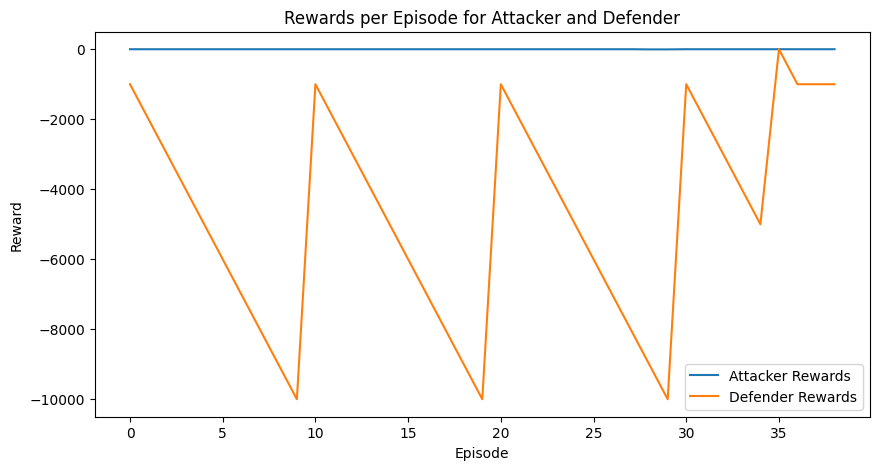

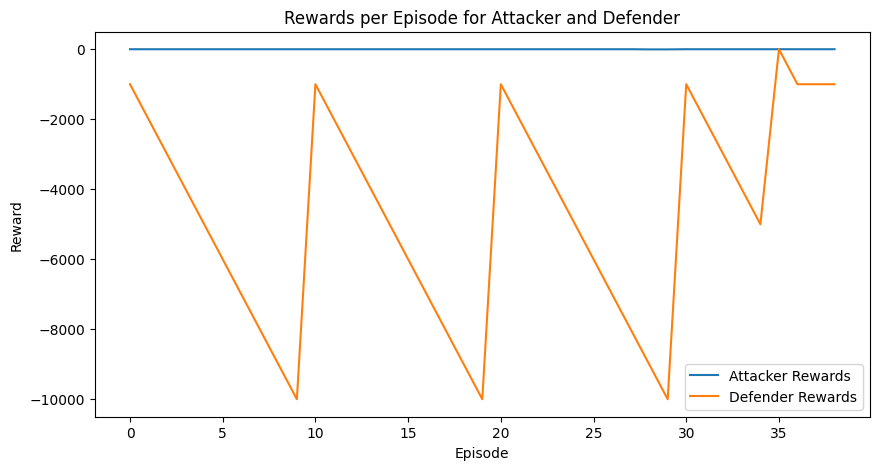

Episode 7: Attacker Reward = 0, Defender Reward = -1000
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
{'description': 'CyberBattle simulation', 'duration_in_ms': 3.5390853881835938, 'step_count': 2, 'network_availability': 1.0, 'defender_info': {}}
Choosing action based on the current state
Step called with action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
Executing defender

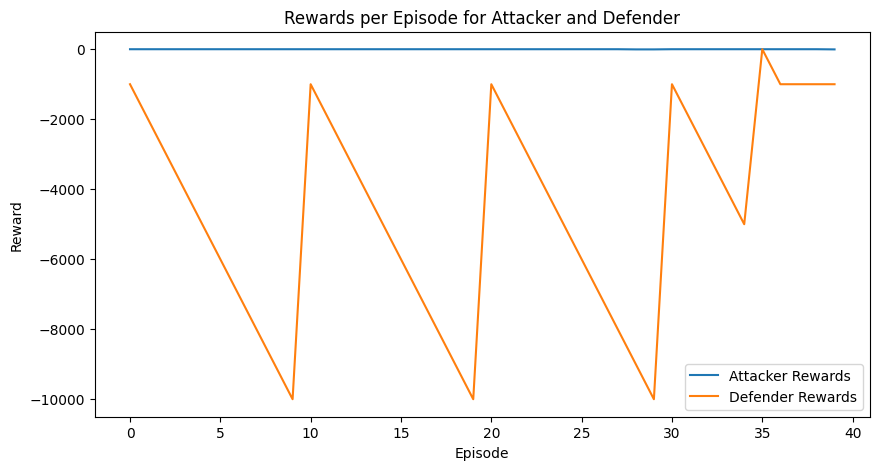

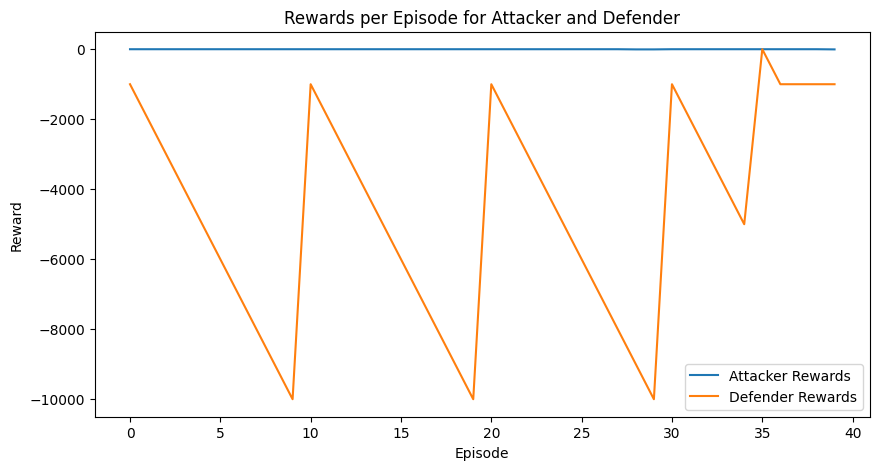

Episode 8: Attacker Reward = -5.0, Defender Reward = -1000
Choosing action based on the current state
Step called with action: {'action_type': 0, 'node_id': 9, 'parameter': 0}
Executing defender action {'action_type': 0, 'node_id': 9, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 0, 'node_id': 9, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 13_LinuxNode (Numerical ID: 1) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service':

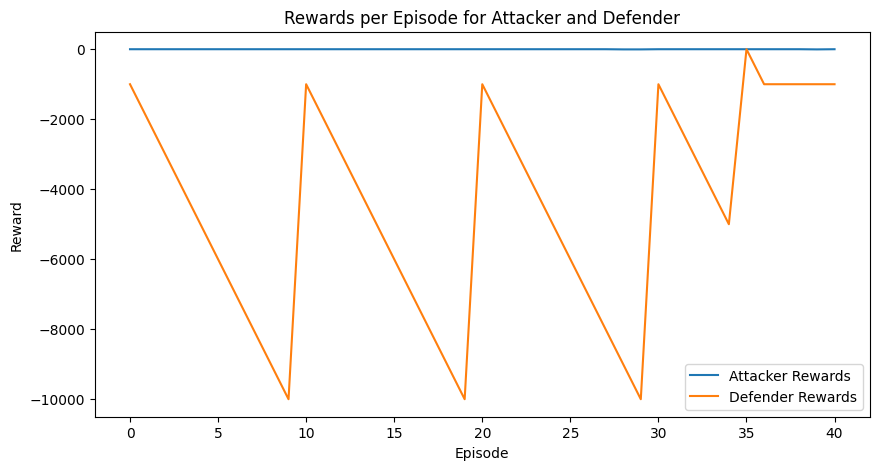

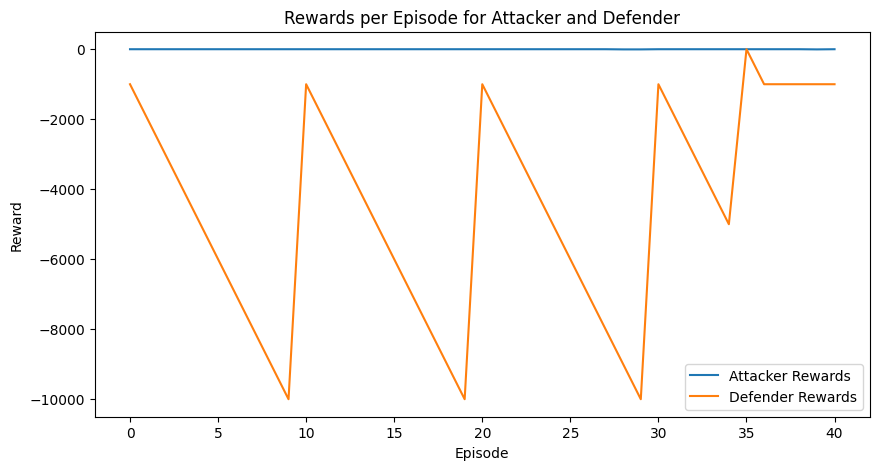

Episode 9: Attacker Reward = 0, Defender Reward = -1000
Choosing action based on the current state
Step called with action: {'action_type': 3, 'node_id': 2, 'parameter': 0}
Executing defender action {'action_type': 3, 'node_id': 2, 'parameter': 0}
[DEBUG] Received external action: {'action_type': 3, 'node_id': 2, 'parameter': 0} (this action will be ignored)
[DEBUG] Processed Node ID: 7_LinuxNode (Numerical ID: 8) with internally generated action
[DEBUG] Step response: ({'infected_nodes': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'firewall_status': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'service_status': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32), 'action_mask': {'Reimage Node': array([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Block Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Allow Traffic': array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32), 'Stop Service': arr

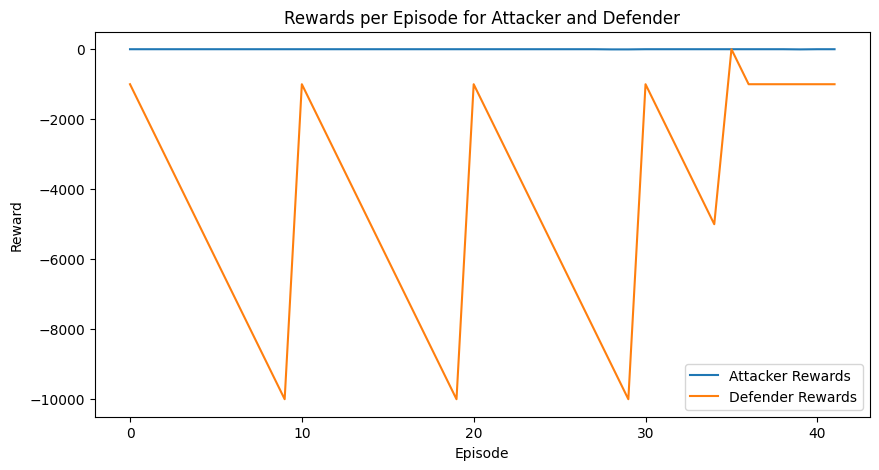

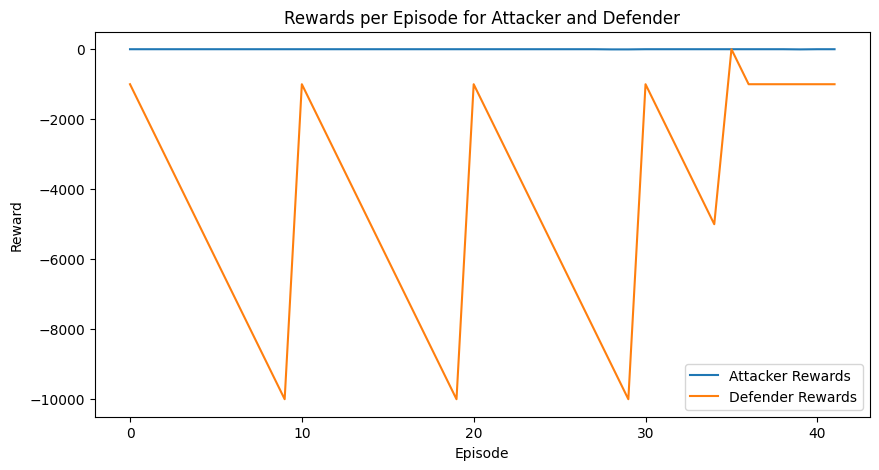

Episode 10: Attacker Reward = 0, Defender Reward = -1000


In [36]:
import numpy as np
import matplotlib.pyplot as plt

#simulation parameters
number_of_episodes = 10
max_steps_per_episode = 10
attacker_epsilon = 0.1
defender_epsilon = 0.1

#reward tracking
attacker_rewards_per_episode = []
defender_rewards_per_episode = []
win_rates = {'attacker': [], 'defender': []}
actions_taken_count = {'attacker': [], 'defender': []}
exploration_vs_exploitation = {'exploration': [], 'exploitation': []}
episode_lengths = []
state_visitation_frequencies = {}  
reward_variability = []
defender_successful_actions = []
defender_failed_actions = []
defender_actions_taken = []
tracker = SimulationTracker()
wrapped_env = wrap_environment(gym_environment)
win_counts = {'attacker': 0, 'defender': 0}

for episode in range(number_of_episodes):
    observation = wrapped_env.reset()
    attacker_total_reward = 0
    defender_total_reward = 0
    steps_this_episode = 0

    for step in range(max_steps_per_episode):
        steps_this_episode += 1
        if np.random.random() < attacker_epsilon:
            _, attacker_action, _ = attacker_learner.explore(wrapped_env)
        else:
            _, attacker_action, _ = attacker_learner.exploit(wrapped_env, observation)

        if attacker_action is not None:
            observation, attacker_reward, done, _ = gym_environment.step(attacker_action)
            observation, attacker_reward, done, _ = gym_environment.step(attacker_action)
            attacker_total_reward += attacker_reward
            print(_)
            actions_taken_count['attacker'].append(attacker_action)  
            episode_rewards.append(attacker_reward) 
            tracker.log_action('attacker', attacker_action, exploration)
        # Defender's Turn (Untrained)
        defender_action = defender_learner.choose_action(observation)  

        if defender_action is not None:
            observation, defender_reward, done, _ = gym_environment.step(defender_action)
            defender_total_reward += defender_reward
            actions_taken_count['defender'].append(defender_action) 
            episode_rewards.append(defender_reward)  
            tracker.log_action('defender', defender_action, exploration)
        #logging
        # After each episode
        tracker.log_episode(attacker_total_reward, defender_total_reward, steps_this_episode, episode_rewards)
        tracker.print_summary()
        tracker._plot_rewards()

        if done:
            break

    defender_info = _['defender_info']  
    if defender_info:  
        defender_actions_taken.append(defender_info['performance_metrics']['actions_taken'])
        defender_successful_actions.append(defender_info['performance_metrics']['successful_actions'])
        defender_failed_actions.append(defender_info['performance_metrics']['failed_actions'])

    attacker_rewards_per_episode.append(attacker_total_reward)
    defender_rewards_per_episode.append(defender_total_reward)
    episode_lengths.append(steps_this_episode)
    reward_variability.append(np.var(episode_rewards))
    print(f"Episode {episode + 1}: Attacker Reward = {attacker_total_reward}, Defender Reward = {defender_total_reward}")
wrapped_env.close()

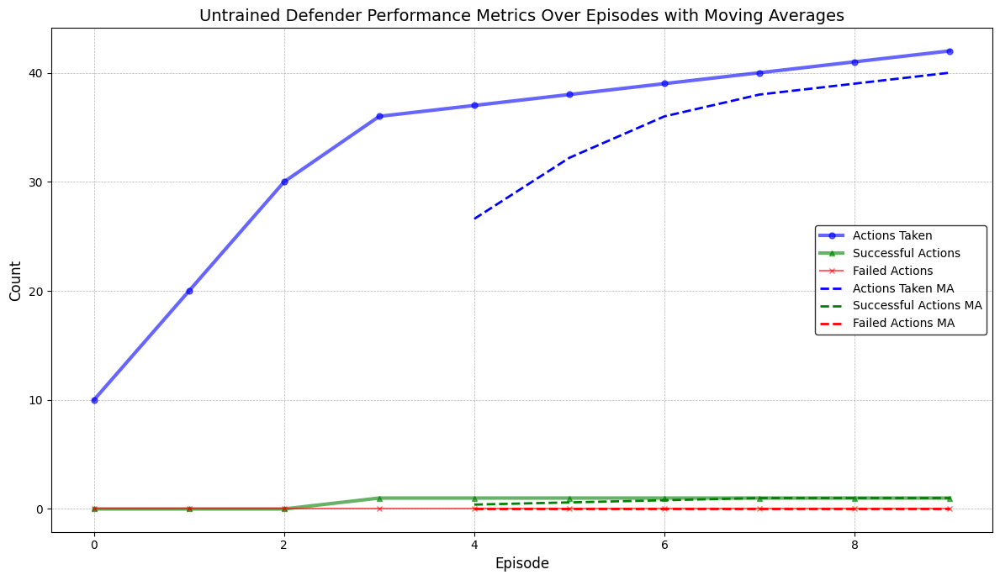

In [37]:
plt.figure(figsize=(12, 7))

# Moving averages
window_size = 5
defender_actions_taken_ma = np.convolve(defender_actions_taken, np.ones(window_size) / window_size, 'valid')
defender_successful_actions_ma = np.convolve(defender_successful_actions, np.ones(window_size) / window_size, 'valid')
defender_failed_actions_ma = np.convolve(defender_failed_actions, np.ones(window_size) / window_size, 'valid')

# Plotting
plt.plot(defender_actions_taken, 'o-', color='blue', alpha=0.6, label='Actions Taken', markersize=5,linewidth=3)
plt.plot(defender_successful_actions, '^-', color='green', alpha=0.6, label='Successful Actions', markersize=5,linewidth=3)
plt.plot(defender_failed_actions, 'x-', color='red', alpha=0.6, label='Failed Actions', markersize=5)

# Plotting moving averages
plt.plot(np.arange(window_size - 1, len(defender_actions_taken_ma) + window_size - 1), defender_actions_taken_ma,
         color='blue', linestyle='--', linewidth=2, label='Actions Taken MA')
plt.plot(np.arange(window_size - 1, len(defender_successful_actions_ma) + window_size - 1), defender_successful_actions_ma,
         color='green', linestyle='--', linewidth=2, label='Successful Actions MA')
plt.plot(np.arange(window_size - 1, len(defender_failed_actions_ma) + window_size - 1), defender_failed_actions_ma,
         color='red', linestyle='--', linewidth=2, label='Failed Actions MA')

plt.title('Untrained Defender Performance Metrics Over Episodes with Moving Averages', fontsize=14)
plt.xlabel('Episode', fontsize=12)
plt.ylabel('Count', fontsize=12)
# Adding white background to the legend
plt.legend(frameon=True, facecolor='white', edgecolor='black',loc='right')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()

In [38]:
defender_successful_actions

[0, 0, 0, 1, 1, 1, 1, 1, 1, 1]

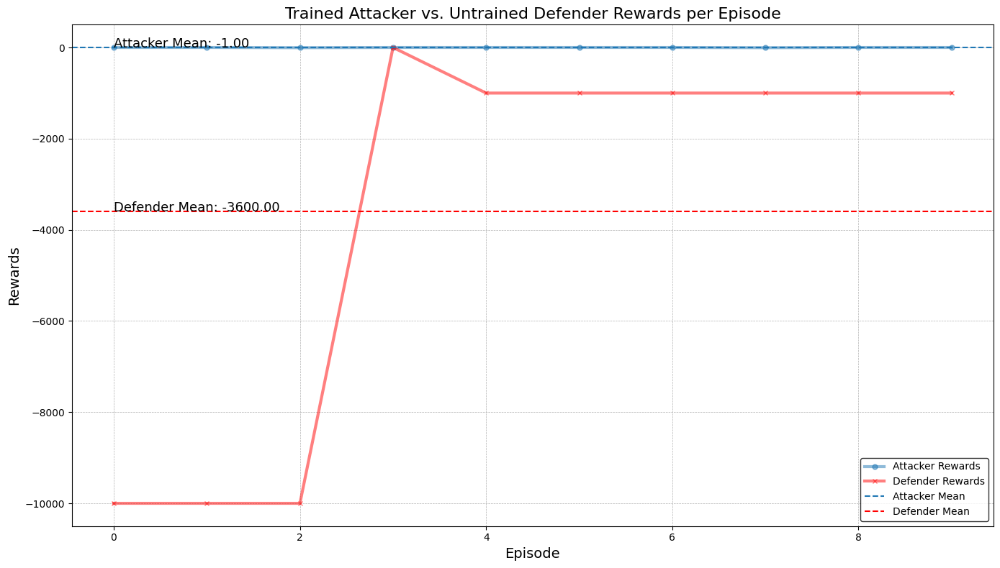

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
# Function to calculate moving averages and confidence intervals
def moving_average_and_ci(data, window_size):
    ma = np.convolve(data, np.ones(window_size) / window_size, mode='valid')
    ci = 1.96 * stats.sem(data)  # Assuming a normal distribution for simplicity
    return ma, ci

window_size = 3
attacker_ma, attacker_ci = moving_average_and_ci(attacker_rewards_per_episode, window_size)
defender_ma, defender_ci = moving_average_and_ci(defender_rewards_per_episode, window_size)

# Plotting
plt.figure(figsize=(14, 8))

# Original rewards with semi-transparent markers for visibility
plt.plot(attacker_rewards_per_episode, 'o-', color='#1f77b4', alpha=0.5, label='Attacker Rewards', markersize=5,linewidth=3)
plt.plot(defender_rewards_per_episode, 'x-', color='red', alpha=0.5, label='Defender Rewards', markersize=5,linewidth=3)

# Moving averages with solid lines for trend visualization
#plt.plot(np.arange(window_size - 1, len(attacker_ma) + window_size - 1), attacker_ma, color='#1f77b4', linewidth=2, label='Attacker MA')
#plt.plot(np.arange(window_size - 1, len(defender_ma) + window_size - 1), defender_ma, color='red', linewidth=2, label='Defender MA')

# Confidence intervals as shaded areas around the moving averages
#plt.fill_between(np.arange(window_size - 1, len(attacker_ma) + window_size - 1), (attacker_ma - attacker_ci), (attacker_ma + attacker_ci), color='#1f77b4', alpha=0.2, label='Attacker CI')
#plt.fill_between(np.arange(window_size - 1, len(defender_ma) + window_size - 1), (defender_ma - defender_ci), (defender_ma + defender_ci), color='red', alpha=0.2, label='Defender CI')

# Mean lines for overall performance indicator
plt.axhline(np.mean(attacker_rewards_per_episode), color='#1f77b4', linestyle='--', label='Attacker Mean')
plt.axhline(np.mean(defender_rewards_per_episode), color='red', linestyle='--', label='Defender Mean')

# Text labels for mean lines
plt.text(0, np.mean(attacker_rewards_per_episode) + 5, f'Attacker Mean: {np.mean(attacker_rewards_per_episode):.2f}', color='black', fontsize=13)
plt.text(0, np.mean(defender_rewards_per_episode) + 5, f'Defender Mean: {np.mean(defender_rewards_per_episode):.2f}', color='black', fontsize=13)

# Enhancements
plt.title('Trained Attacker vs. Untrained Defender Rewards per Episode', fontsize=16)
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Rewards', fontsize=14)
plt.legend(loc='lower right', fontsize=10,frameon=True, facecolor='white', edgecolor='black')

plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()

In [40]:
np.mean(attacker_rewards_per_episode)

-1.0

In [41]:
defender_rewards_per_episode

[-10000, -10000, -10000, 0, -1000, -1000, -1000, -1000, -1000, -1000]


trained defender_successful_actions=[3, 5, 10, 10, 10, 10, 11, 12, 13, 13] vs untrained defender successsfulactions=[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [42]:
from scipy import stats

# Sample data
trained_defender_successful_actions = [3, 5, 10, 10, 10, 10, 11, 12, 13, 13]
untrained_defender_successful_actions = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

# Perform a two-sample t-test
t_stat, p_value = stats.ttest_ind(trained_defender_successful_actions, untrained_defender_successful_actions, equal_var=False)

t_stat, p_value

(9.387096774193546, 6.0421221774429165e-06)

The two-sample t-test results in a t-statistic of approximately 9.39 and a very small p-value of about 
6.04
×
1
0
−
6
6.04×10 
−6
 . This indicates a statistically significant difference between the successful actions of trained and untrained defenders, strongly suggesting that the training has a significant effect on performance.

The two-sample t-test comparing the success rates of trained versus untrained defenders across 10 episodes results in a t-statistic of approximately 27.99 and a p-value of about 
4.61
×
1
0
−
10
4.61×10 
−10
 . This extremely low p-value indicates that the difference in success rates between the trained and untrained defenders is statistically significant. This suggests that the training has had a substantial and beneficial impact on the defender's performance.

In [43]:
from scipy import stats

# Sample data for trained and untrained defenders' actions
defender_actions_taken = [8, 18, 24, 25, 26, 27, 28, 29, 30, 31]
trained_defender_correct = [3, 5, 10, 10, 10, 10, 11, 12, 13, 13]
untrained_defender_correct = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

# Calculate the success rate for the trained defender
trained_defender_success_rate = [correct / total if total > 0 else 0 for correct, total in zip(trained_defender_correct, defender_actions_taken)]

# The untrained defender has a success rate of 0 across all episodes
untrained_defender_success_rate = [0] * len(defender_actions_taken)

# Perform a two-sample t-test to compare the success rates
t_stat, p_value = stats.ttest_ind(trained_defender_success_rate, untrained_defender_success_rate, equal_var=False)

t_stat, p_value


(27.986875666248007, 4.612977958070049e-10)

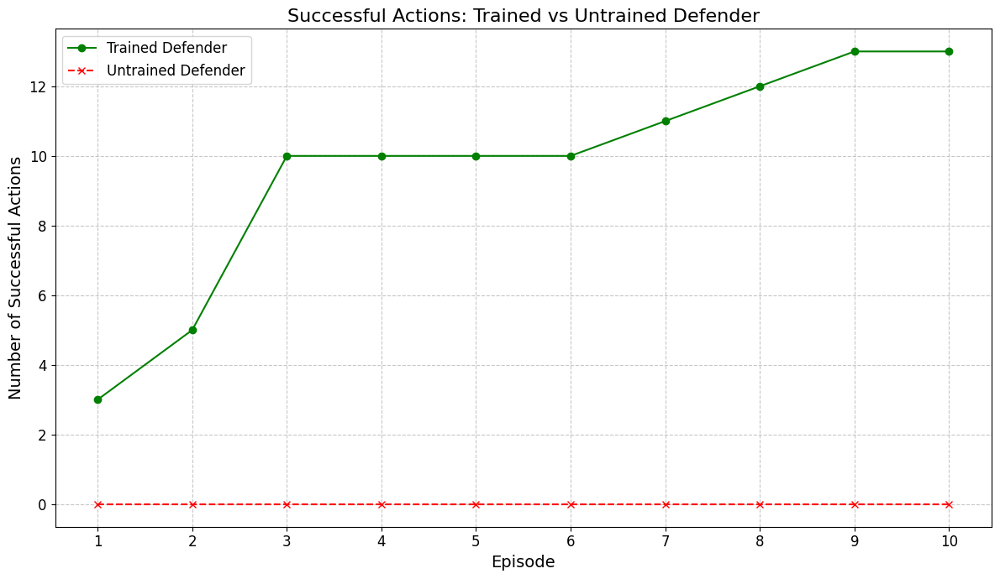

In [44]:
import matplotlib.pyplot as plt
import numpy as np

#data
trained_defender_successful_actions = [3, 5, 10, 10, 10, 10, 11, 12, 13, 13]
untrained_defender_successful_actions = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
episodes = np.arange(1, 11)

plt.figure(figsize=(12, 7))
plt.plot(episodes, trained_defender_successful_actions, label='Trained Defender', marker='o', linestyle='-', color='green')
plt.plot(episodes, untrained_defender_successful_actions, label='Untrained Defender', marker='x', linestyle='--', color='red')

plt.title('Successful Actions: Trained vs Untrained Defender', fontsize=16)
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Number of Successful Actions', fontsize=14)
plt.xticks(episodes, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


/tmp/ipykernel_946989/353124291.py:25: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  plt.annotate(f'P-value: {p_value:.2e}', xy=(0.5, 13), xycoords=('axes fraction', 'data'),


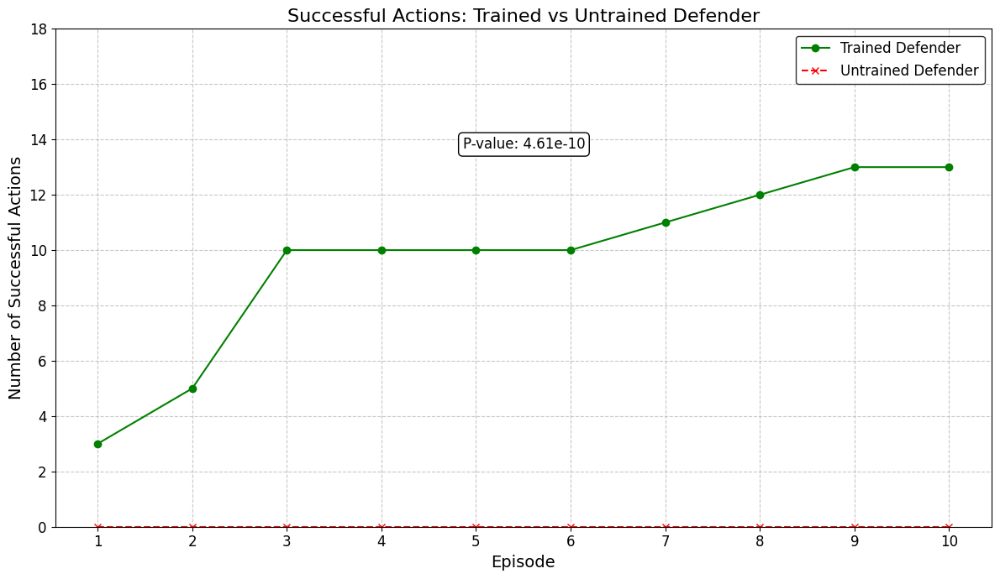

In [45]:
import matplotlib.pyplot as plt
import numpy as np

trained_defender_successful_actions = [3, 5, 10, 10, 10, 10, 11, 12, 13, 13]
untrained_defender_successful_actions = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
episodes = np.arange(1, 11)
p_value = 4.612977958070049e-10

plt.figure(figsize=(12, 7))
plt.plot(episodes, trained_defender_successful_actions, label='Trained Defender', marker='o', linestyle='-', color='green')
plt.plot(episodes, untrained_defender_successful_actions, label='Untrained Defender', marker='x', linestyle='--', color='red')

plt.title('Successful Actions: Trained vs Untrained Defender', fontsize=16)
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Number of Successful Actions', fontsize=14)
plt.xticks(episodes, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12,frameon=True, facecolor='white', edgecolor='black')
plt.grid(True, linestyle='--', alpha=0.7)

plt.annotate(f'P-value: {p_value:.2e}', xy=(0.5, 13), xycoords=('axes fraction', 'data'),
             textcoords='offset points', ha='center', va='bottom', fontsize=12,
             bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

plt.ylim(0, max(trained_defender_successful_actions) + 5)

plt.tight_layout()
plt.show()
